# MEOP dataset analysis
MEOP data can be found at: http://www.meop.net/database/format.html
MEOP stands for: "Marine Mammals Exploring the Oceans from Pole to Pole".
MEOP consists of ARGO like profiles, however, the instruments are fitted onto marine mammals.
The UK dataset of MEOP contains many profiles in the Weddel Sea region, the following analysis is of this dataset.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gsw
from netCDF4 import Dataset
import pdb
from mpl_toolkits.basemap import Basemap, cm
from matplotlib.colors import LinearSegmentedColormap
from IPython.display import Image
import matplotlib.colors as colors
from scipy.interpolate import griddata
import geopandas as gpd
from shapely.geometry import Point

In [371]:
dfmg = pd.read_csv("dfmg_glDist.csv")
del dfmg['Unnamed: 0']
del dfmg['Unnamed: 0.1']

In [377]:
dfmg.to_csv("dfmg_glDist.csv")

In [375]:
dfmg.head()

,JULD,LATITUDE,LONGITUDE,PLATFORM_NUMBER,POSITION_QC,PRES_ADJUSTED,PRES_ADJUSTED_QC,PROFILE_NUMBER,PSAL_ADJUSTED,PSAL_ADJUSTED_QC,...,DEPTH,DENSITY_INSITU,POT_DENSITY,CTEMP,DENSITY_GRADIENT,ECHODEPTH,mab,deep_flag,DIST_GLINE,POSTION_QC
0,2007-03-03 03:24:00.028799999,-68.5139,78.3736,b'00012048',b'1',6.0,1,0,NaN,9,...,-5.939708,NaN,NaN,NaN,NaN,-1.0,4.939708,0.0,4.18842,NaN
1,2007-03-03 03:24:00.028799999,-68.5139,78.3736,b'00012048',b'1',8.0,1,0,NaN,9,...,-7.919572,NaN,NaN,NaN,NaN,-1.0,6.919572,0.0,4.18842,NaN
2,2007-03-03 03:24:00.028799999,-68.5139,78.3736,b'00012048',b'1',14.0,1,0,NaN,9,...,-13.859049,NaN,NaN,NaN,NaN,-1.0,12.859049,0.0,4.18842,NaN
3,2007-03-03 03:24:00.028799999,-68.5139,78.3736,b'00012048',b'1',18.0,1,0,NaN,9,...,-17.818605,NaN,NaN,NaN,NaN,-1.0,16.818605,0.0,4.18842,NaN
4,2007-03-03 03:24:00.028799999,-68.5139,78.3736,b'00012048',b'1',22.0,1,0,NaN,9,...,-21.778083,NaN,NaN,NaN,NaN,-1.0,20.778083,0.0,4.18842,NaN


In [378]:
len(dfmg['PLATFORM_NUMBER'].unique())

499

In [ ]:
dfmg.to_csv("dfmg.csv")

In [379]:
dfmg['JULD'] = pd.to_datetime(dfmg['JULD'],infer_datetime_format=True)
len(dfmg)

2884471

In [380]:
print("From",str(dfmg['JULD'].min()).split(" ")[0],"to", str(dfmg['JULD'].max()).split(" ")[0])

From 2004-02-05 to 2016-02-22


In [4]:
print(dfmg["LATITUDE"].describe(), "\n \n", dfmg["LONGITUDE"].describe())

count    2.884471e+06
mean    -6.821635e+01
std      5.183556e+00
min     -7.844240e+01
25%     -7.201295e+01
50%     -6.737324e+01
75%     -6.429430e+01
max     -6.000010e+01
Name: LATITUDE, dtype: float64 
 
 count    2.884471e+06
mean     2.797270e+01
std      9.607434e+01
min     -1.799937e+02
25%     -6.281400e+01
50%      3.259540e+01
75%      1.079162e+02
max      1.799913e+02
Name: LONGITUDE, dtype: float64


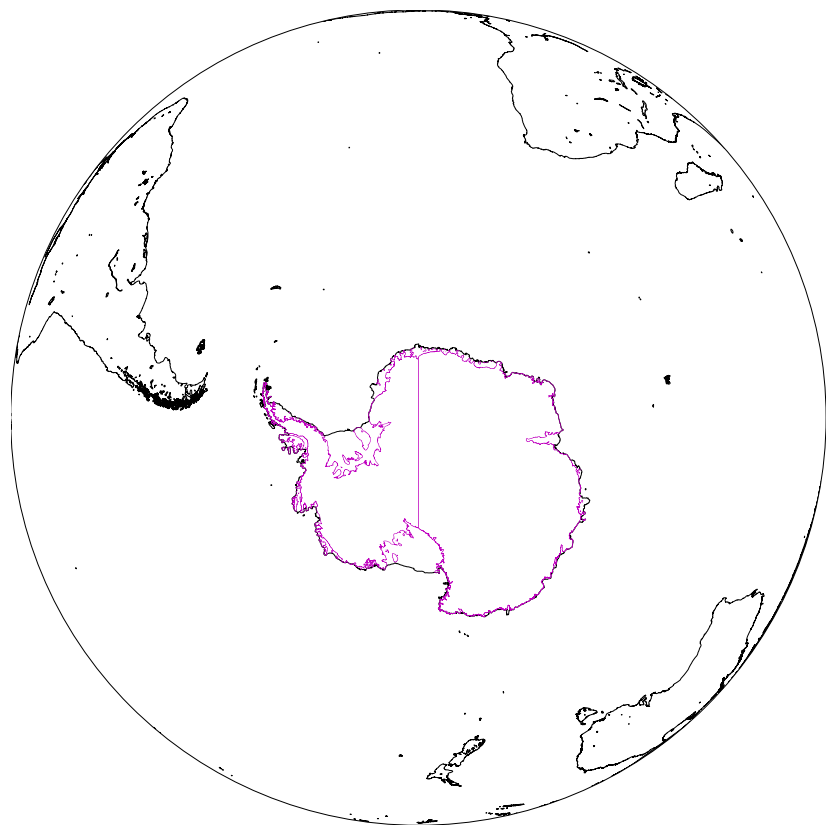

In [100]:
plt.figure(figsize=(15,15))
lat0 = -80
lon0 = 0
ant = Basemap(projection='ortho', lat_0 =lat0, lon_0 =lon0, resolution='i');
ant.drawcoastlines();
ant.readshapefile("/media/data/Datasets/Shapefiles/AntarcticGroundingLine/GSHHS_f_L6", "GSHHS_f_L6", color='m')
plt.show();

In [381]:
import plot_stations as pltStn
import importlib
importlib.reload(pltStn)

<module 'plot_stations' from '/media/data/Datasets/MEOP/MEOP-CTD_2016-07-12/UK/myScripts/plot_stations.py'>

In [382]:
import plot_bathy as pltBathy
import importlib
importlib.reload(pltBathy)

<module 'plot_bathy' from '/media/data/Datasets/MEOP/MEOP-CTD_2016-07-12/UK/myScripts/plot_bathy.py'>

#### Reading in GEBCO elevation data, selecting all values lying within Weddel Sea and below 0 level

In [7]:
from scipy.io import netcdf
bathy = netcdf.netcdf_file('/media/data/Datasets/Bathymetry/GEBCO_2014_2D.nc', 'r')

In [8]:
lons = bathy.variables['lon'][:]
lats = bathy.variables['lat'][:]
lonbounds = [-180, 180] # creating lon,lat bounds for region of interest, ie. Weddel Sea
latbounds = [-80, -60]

latli = np.argmin( np.abs(lats - latbounds[0]) ) # extracting the indices of start and end of the region of interest
latui = np.argmin( np.abs(lats - latbounds[1]) )
lonli = np.argmin( np.abs(lons - lonbounds[0]) )
lonui = np.argmin( np.abs(lons - lonbounds[1]) )
elevWedSea = bathy.variables['elevation'][latli:latui, lonli:lonui] # elevation of Weddell Sea
mask_below0 = elevWedSea[:,:] > 0
elevWedSea = np.ma.masked_array(elevWedSea[:,:] , mask_below0)

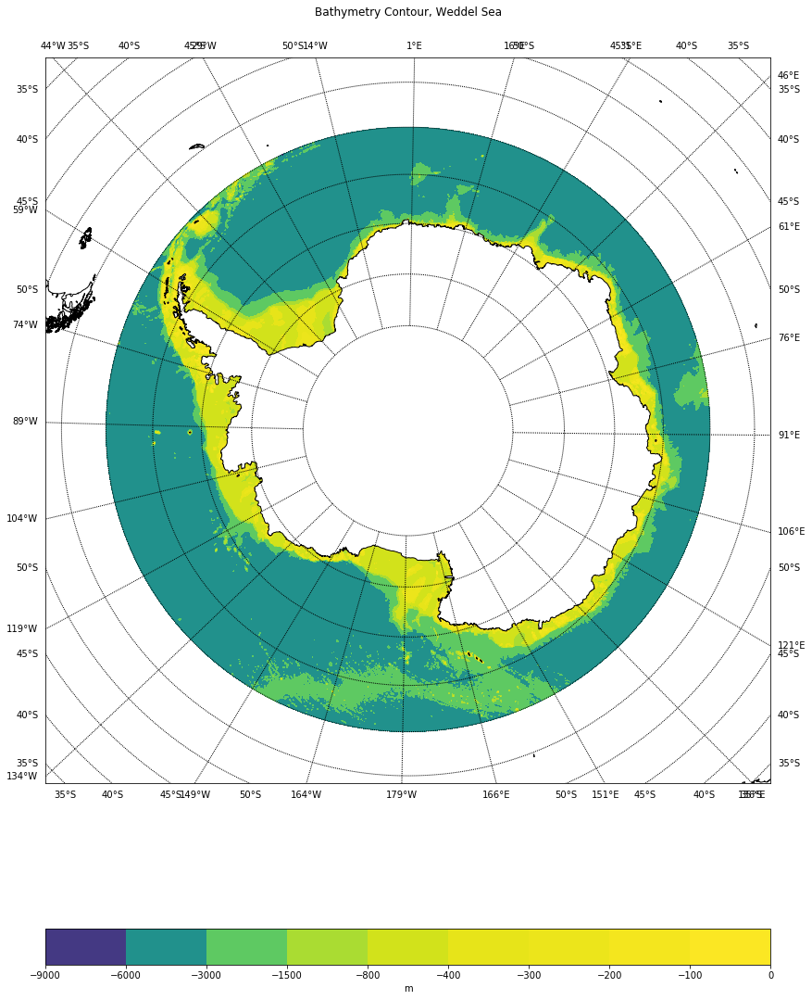

In [17]:
%matplotlib inline
pltBathy.plot_bathy(elevWedSea, lons[lonli:lonui], 
                             lats[latli:latui], title='Bathymetry Contour, Weddel Sea', wd=15, ht=15)

In [33]:
lonsWed = lons[lonli:lonui]
latsWed = lats[latli:latui]

In the plot below, we can see all the points where profiles have been recorded. In black is the continent shoreline. In magenta is the Ice Shelf grounding line as obtained from : *The Global Self-consistent, Hierarchical, High-resolution Geography (GSHHG) Database is a high-resolution geography data set amalgamated from three data bases in the public domain. This layer is part of GSHHG Version 2.3.3.* \url{https://earthworks.stanford.edu/catalog/stanford-zt046tb6131}

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1623: MatplotlibDeprecationWarning: The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.
  fill_color = ax.get_axis_bgcolor()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


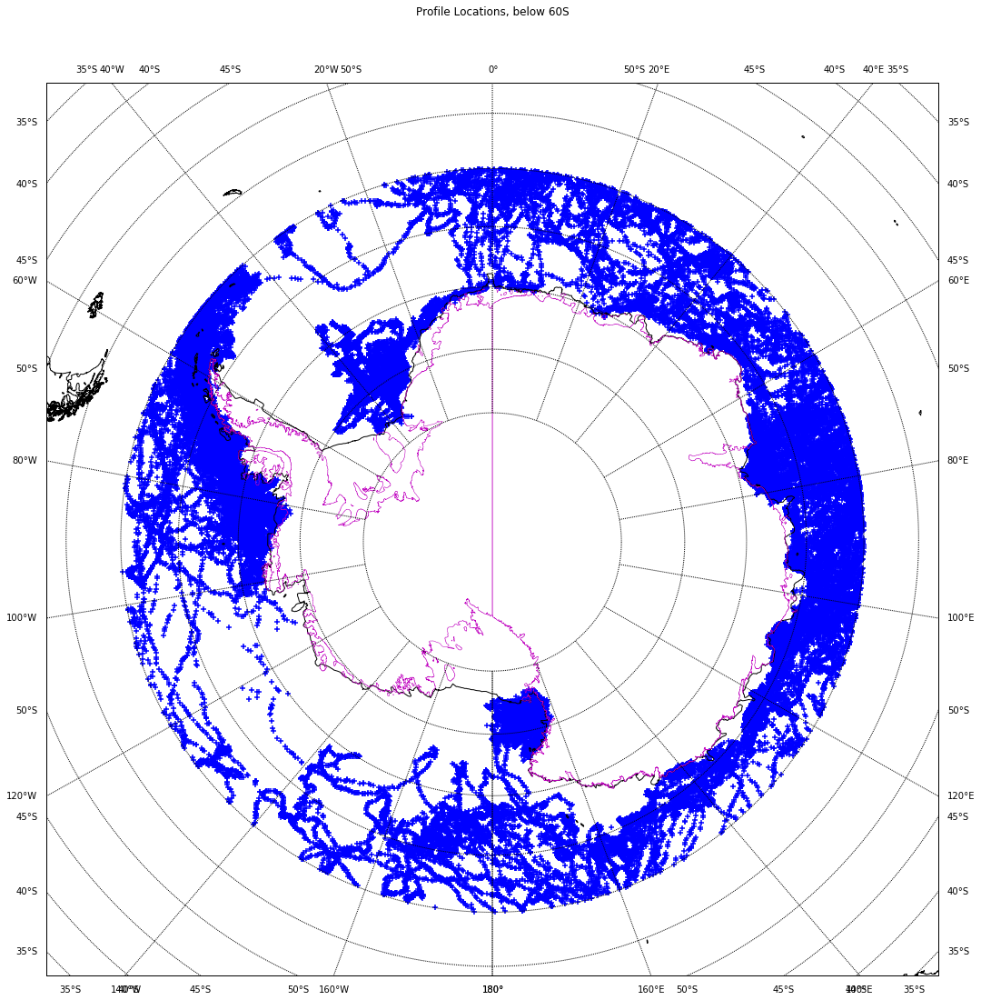

In [383]:
unique_positions60 = dfmg.loc[:,"LATITUDE": "LONGITUDE"].drop_duplicates(subset=['LONGITUDE', 'LATITUDE']).values
pltStn.plot_station_locations(unique_positions60, title='Profile Locations, below 60S')

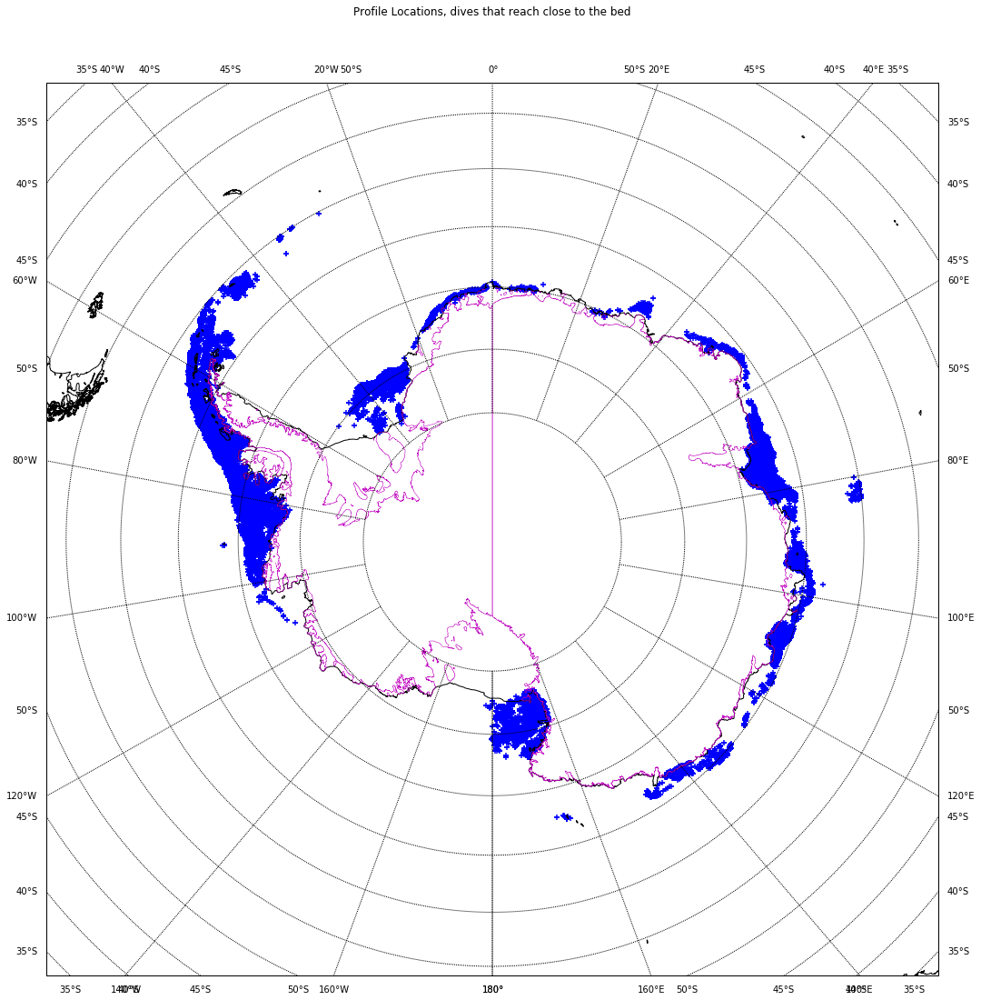

In [107]:
unique_positions60 = dfmg.loc[lt60].loc[:,"LATITUDE": "LONGITUDE"].drop_duplicates(subset=['LONGITUDE', 'LATITUDE']).values
pltStn.plot_station_locations(unique_positions60, title='Profile Locations, dives that reach close to the bed')

## We see above that the dives that reach at least 60mab occur mostly close to the continent

#### Quite a few null values are in the dataset, as we can see below:

In [9]:
len(dfmg[dfmg['PSAL_ADJUSTED'].isnull()])

561395

In [10]:
len(dfmg[dfmg['TEMP_ADJUSTED'].isnull()])

332053

In [11]:
len(dfmg[dfmg['DENSITY_INSITU'].isnull()])

604278

As defined in Legg, 2009, Weddel Sea Overflow (WSO), and Ross Sea Overflow (RSO) have the following properties in source waters and their corresponding product waters

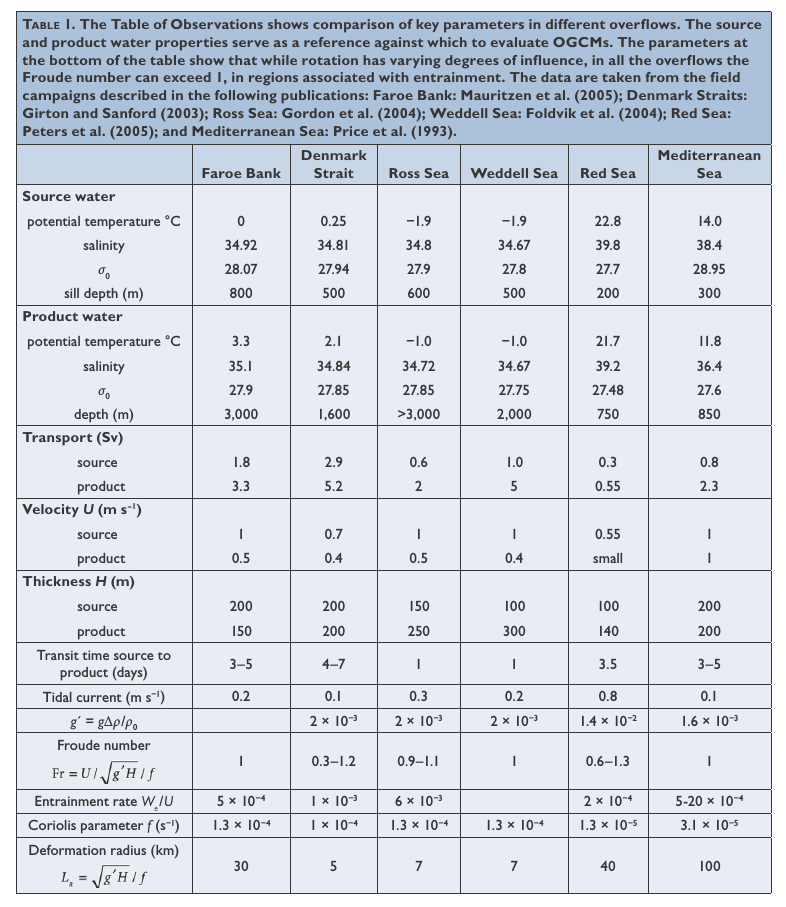

In [138]:
Image(filename='TableOverflowsDefinedLegg2009.png') 

In [384]:
WSO_source = (dfmg['CTEMP'] <= -1.7 ) & (dfmg["PSAL_ADJUSTED"] > 34.5)
WSO_prod = (dfmg['CTEMP'] <= -0.8) & (dfmg['CTEMP'] >= -1.7) & (dfmg["PSAL_ADJUSTED"] > 34.5)

len(dfmg.loc[WSO_source, 'PROFILE_NUMBER'].unique())

24446

In [385]:
len(dfmg.loc[WSO_prod, 'PROFILE_NUMBER'].unique())

16060

In [386]:
import plot_station_bot_sal as pbs

The plots below plot the salinity values at the bottom of the dive followed by the depth at the bottom of the dive

We see that the "source" points cluster in the eastern part of the Weddell Sea, Western part of the Ross Sea, and the Western part of Prydz bay.

The Antarctic peninsula also shows a few points clustered near the tip. It is a possible location for high rates of warming due to convergence of Kelvin waves that propogate from Eastern parts of Southern Ocean where wind stresses are increasing. How will the production of bottom water change with the warming in this region?

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1623: MatplotlibDeprecationWarning: The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.
  fill_color = ax.get_axis_bgcolor()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


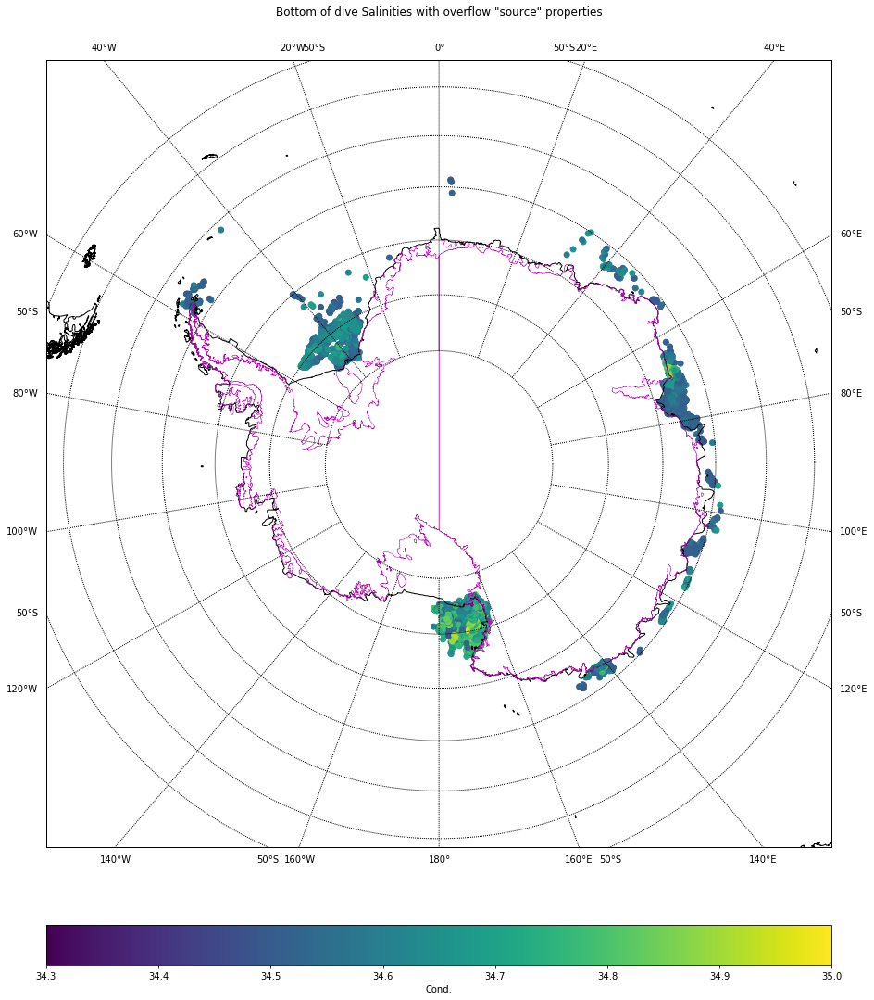

In [387]:
%matplotlib inline
importlib.reload(pbs)
mask_months = mask_months = sel_months(dfmg, [6,8,9])
pbs.plot_station_bot_sal(dfmg[WSO_source], 
                         title="Bottom of dive Salinities with overflow \"source\" properties",
                         contour=False, save=False, 
                         savename='./Images/WSO_source_locations.png', cmin=34.3, cmax=35.)

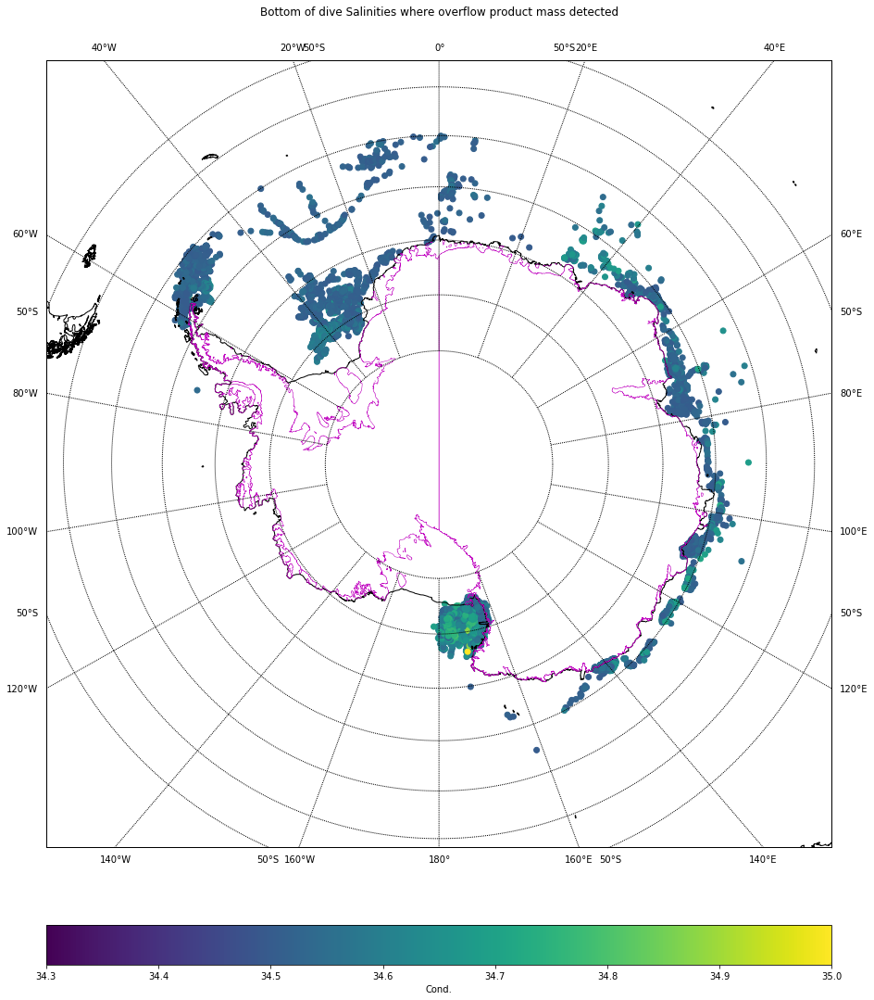

In [111]:
pbs.plot_station_bot_sal(dfmg[WSO_prod], 
                     title="Bottom of dive Salinities where overflow product mass detected",
                     cmin=34.3, cmax=35, save=True, savename="./Images/WSO_product.png")

In [375]:
len(dfmg)

2884471

### The distribution of CTemp has a long tail like a Gamma distribution
Will it be valid to compute 95% conf. int. based on the assumption that the distribution is normal?

2552418


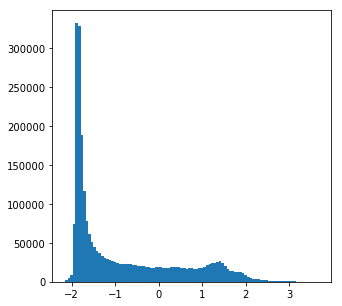

In [388]:
mask_pressureLevel = (dfmg['PRES_ADJUSTED'] >= 100) & (dfmg['PRES_ADJUSTED'] <= 120)
var = dfmg.loc[:,'TEMP_ADJUSTED'].dropna().values
print(len(var))
bins = np.linspace(np.percentile(var, 0.1), np.percentile(var, 99.9), 100)

fig = plt.figure(figsize=(5,5))
plt.hist(var, bins=bins)
plt.show()

In [389]:
def plot_hist(df1, df2, label1="", label2="", wd=13, ht=6, 
              salmin=34.3, salmax=35.8, sigmin=27.5, sigmax=28.8, save=False, savename="untitled.png"):
    fig = plt.figure(figsize=(wd,ht))
    sal1 = df1['PSAL_ADJUSTED'].as_matrix()
    sal2 = df2['PSAL_ADJUSTED'].as_matrix()
    
    weights1 = np.ones_like(sal1) / float(len(sal1))
    weights2 = np.ones_like(sal2) / float(len(sal2))
    ax1 = fig.add_subplot(1,2,1)
    ax1.hist(sal1, alpha=0.5, label=label1, weights=weights1, bins=100)
    ax1.hist(sal2, alpha=0.5, label=label2, weights=weights2, bins=100)
    ax1.set_xlim(salmin, salmax)
    ax1.set_xlabel("Salinity")
    ax1.set_ylabel("Normed Counts")

    ax2 = fig.add_subplot(1,2,2)
    sigma_no1 = df1['POT_DENSITY'].as_matrix()
    sigma_no2 = df2['POT_DENSITY'].as_matrix()
    
    ax2.hist(sigma_no1, alpha=0.5, label=label1, weights=weights1, bins=100)
    ax2.hist(sigma_no2, alpha=0.5, label=label2, weights=weights2, bins=100)
    ax2.set_xlim(sigmin, sigmax)
    ax2.set_xlabel('$\sigma_0$')

    plt.legend();
    if(save==True):
        plt.savefig(savename)
    plt.show();

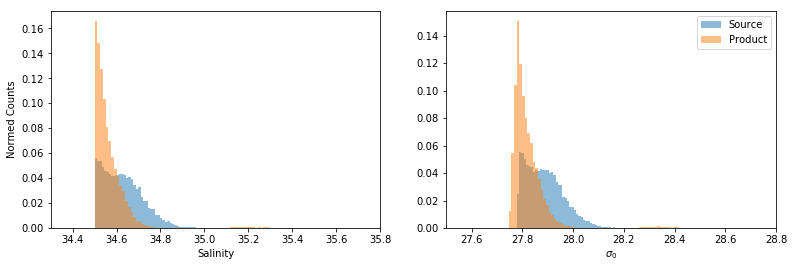

In [54]:
plot_hist(dfmg[WSO_source], dfmg[WSO_prod], label1="Source",label2="Product", ht=4, save=True, 
          savename="./Images/All_HistSalSigma_SourceProduct.png")

From the quantile distribution above, we see that the product water masses have lower salinity and lower density

Creating regional boxes in the Weddell Sea as below:

In [390]:
box1 = (dfmg["LATITUDE"] > -80) & (dfmg["LATITUDE"] < -75) & (dfmg["LONGITUDE"] > -60) & (dfmg["LONGITUDE"] < -40)
box2 = (dfmg["LATITUDE"] > -80) & (dfmg["LATITUDE"] < -75) & (dfmg["LONGITUDE"] > -40) & (dfmg["LONGITUDE"] < -20)
box3 = (dfmg["LATITUDE"] > -75) & (dfmg["LATITUDE"] < -70) & (dfmg["LONGITUDE"] > -60) & (dfmg["LONGITUDE"] < -40)
box4 = (dfmg["LATITUDE"] > -75) & (dfmg["LATITUDE"] < -70) & (dfmg["LONGITUDE"] > -40) & (dfmg["LONGITUDE"] < -20)

box5 = (dfmg["LATITUDE"] > -80) & (dfmg["LATITUDE"] < -75) & (dfmg["LONGITUDE"] > 160) & (dfmg["LONGITUDE"] < 180)
box6 = (dfmg["LATITUDE"] > -80) & (dfmg["LATITUDE"] < -75) & (dfmg["LONGITUDE"] > -180) & (dfmg["LONGITUDE"] < -160)
box7 = (dfmg["LATITUDE"] > -75) & (dfmg["LATITUDE"] < -70) & (dfmg["LONGITUDE"] > 160) & (dfmg["LONGITUDE"] < 180)
box8 = (dfmg["LATITUDE"] > -75) & (dfmg["LATITUDE"] < -70) & (dfmg["LONGITUDE"] > -180) & (dfmg["LONGITUDE"] < -160)

box9 = (dfmg["LATITUDE"] > -70) & (dfmg["LATITUDE"] < -65) & (dfmg["LONGITUDE"] > 60) & (dfmg["LONGITUDE"] < 70)
box10 = (dfmg["LATITUDE"] > -70) & (dfmg["LATITUDE"] < -65) & (dfmg["LONGITUDE"] > 70) & (dfmg["LONGITUDE"] < 80)

In [391]:
Weddell = (box1 | box2 | box3| box4)
Ross = (box5 | box6 | box7 | box8)
Prydz = (box9 | box10)
antPeninsula = (dfmg['LONGITUDE'] > -80) & (dfmg['LONGITUDE'] < -60)
westAnt = (dfmg['LONGITUDE'] > -100) & (dfmg['LONGITUDE'] < -80)

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1623: MatplotlibDeprecationWarning: The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.
  fill_color = ax.get_axis_bgcolor()


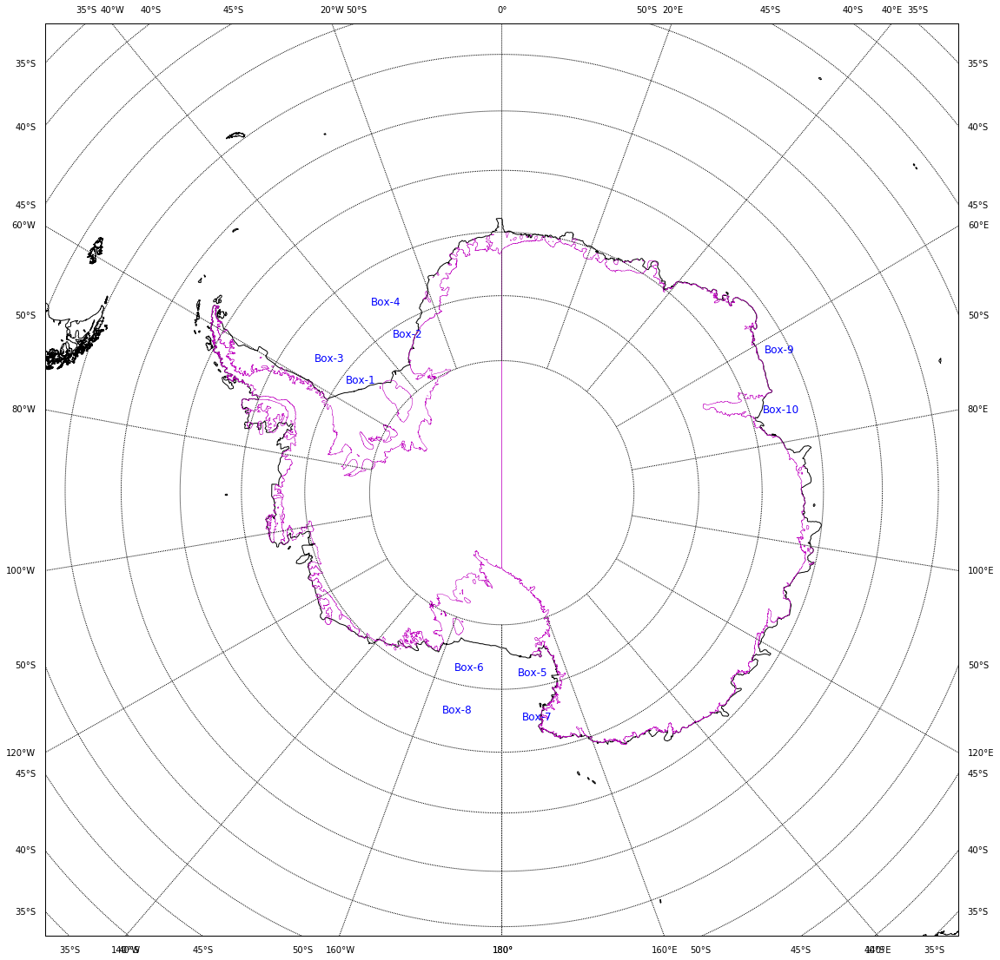

In [16]:
box_locs = np.array([ [-55, -75.5] , [-35, -75.5] , [-55, -72.5], [-35, -72.5], [175, -76.], 
                     [-165, -76.], [175, -72.5], [-165, -72.5] , [62, -67], [73, -69] ])
boxes = ['Box-1', 'Box-2', 'Box-3', 'Box-4', 'Box-5', 'Box-6', 'Box-7', 'Box-8', 'Box-9', 'Box-10']
import plot_boxes
import importlib
importlib.reload(plot_boxes)
plot_boxes.plot_boxes(positions=box_locs, boxes=boxes)

In [392]:
def plot_time_history(df, wd=15, ht=6, title="", 
                      salmin=34.2, salmax=35, tmin=-3, tmax=-0.5):
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(wd,ht))
    
    sal = df.loc[df.groupby('PROFILE_NUMBER').tail(1).index, 'PSAL_ADJUSTED'].as_matrix()
    ctemp = df.loc[df.groupby('PROFILE_NUMBER').tail(1).index, 'CTEMP'].as_matrix()
    depth = df.loc[df.groupby('PROFILE_NUMBER').tail(1).index, 'DEPTH'].as_matrix()
    time = df.loc[df.groupby('PROFILE_NUMBER').tail(1).index, 'JULD'].as_matrix()
    
    counter = 0
    for ax in axes.flat:
        if(counter == 0):
            im = ax.scatter(time, sal, c=depth)
            ax.set_ylim(salmin, salmax)
            ax.set_ylabel("Salinity")
        else:
            im = ax.scatter(time, ctemp, c=depth)
            ax.set_ylim(tmin, tmax)
            ax.set_ylabel("$\\theta^o$C")
        counter+=1
            
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.01, 0.7])
    cb = fig.colorbar(im, cax=cbar_ax)
    cb.set_label("Depth (m)")
    plt.suptitle(title+" (Total no of readings= "+str(len(df))+")")
    #plt.tight_layout()
    plt.show();

In [393]:
def plot_time_history2(data, mask=[mask1, mask2], wd=15, ht=6, title="", 
                      salmin=34.2, salmax=35, tmin=-3, tmax=-0.5, timemin=0, 
                       timemax=0, save=False, savename="Untitled.png"):
    fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(wd,ht))
    if(timemin==0 or timemax==0):
        timemin= data['JULD'].min()
        timemax = data['JULD'].max()
        
    for i in range(len(mask)):
        df = data.loc[mask[i]]
        sal = df.loc[df.groupby('PROFILE_NUMBER').tail(1).index, 'PSAL_ADJUSTED'].as_matrix()
        ctemp = df.loc[df.groupby('PROFILE_NUMBER').tail(1).index, 'CTEMP'].as_matrix()
        depth = df.loc[df.groupby('PROFILE_NUMBER').tail(1).index, 'DEPTH'].as_matrix()
        time = pd.to_datetime(df.loc[df.groupby('PROFILE_NUMBER').tail(1).index, 'JULD'].as_matrix())
        
        counter = 0
        for ax in axes.flat[i*2: i*2+2]:
            if(counter%2 == 0):
                im = ax.scatter(time, sal, c=depth)
                ax.set_ylim(salmin, salmax)
                ax.set_ylabel("Salinity")
                ax.set_xlim(timemin, timemax)
                ax.set_xticklabels([])
                if(i == 0):
                    ax.set_title("Source Waters:")
                else:
                    ax.set_title("Product Waters:")
            else:
                im = ax.scatter(time, ctemp, c=depth)
                ax.set_ylim(tmin, tmax)
                ax.set_ylabel("$\\theta^o$C")
                ax.set_xlim(timemin, timemax)
                if(counter != i*2-1):
                    ax.set_xticklabels([])
            counter+=1
            
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.01, 0.7])
    cb = fig.colorbar(im, cax=cbar_ax)
    cb.set_label("Depth (m)")
    #plt.suptitle(title)
    #plt.tight_layout()
    if(save==True):
        plt.savefig(savename)
    plt.show();


In [18]:
dfmg.loc[box1 & WSO_source, "PSAL_ADJUSTED"].count()

6305

In [67]:
print("From",str(dfmg['JULD'].min()).split(" ")[0],"to", str(dfmg['JULD'].max()).split(" ")[0])

From 2004-02-05 to 2016-02-22


In [22]:
timemin = pd.Timestamp('2007-01-01')
timemax = pd.Timestamp('2016-01-01')

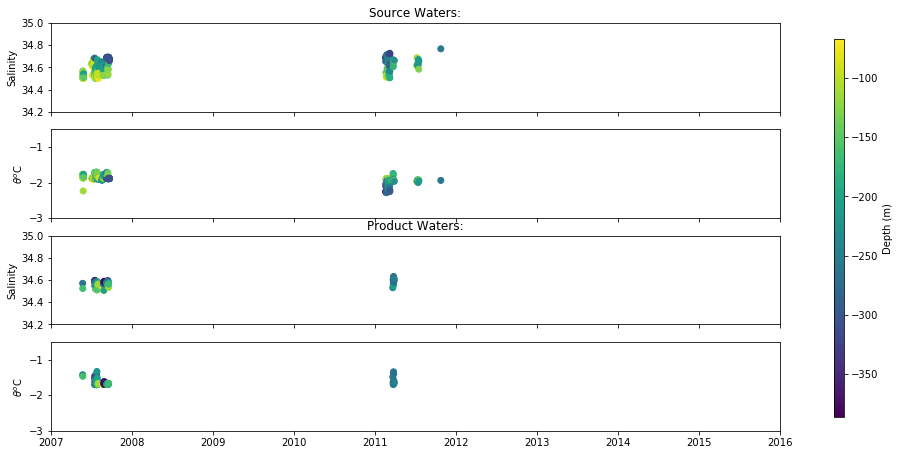

In [23]:
mask1 = box1 & WSO_source
mask2 = box1 & WSO_prod
plot_time_history2(dfmg, mask=[mask1, mask2], ht=7.5, title="Box1", 
                 tmin=-3, tmax=-0.5, salmin=34.2, timemin=timemin, timemax= timemax)

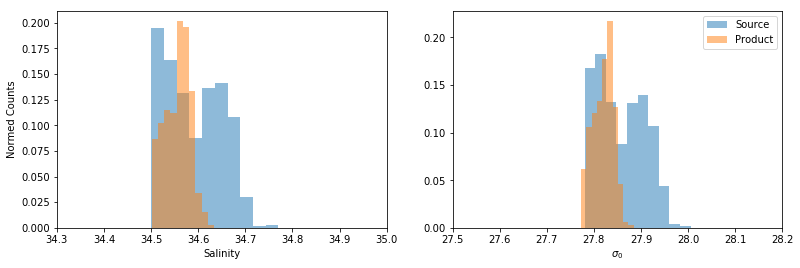

In [20]:
plot_hist(dfmg[WSO_source & box1], dfmg[WSO_prod & box1], label1="Source",
          label2="Product", ht=4, salmax=35, sigmax=28.2)

Source: 23412 Product: 12974


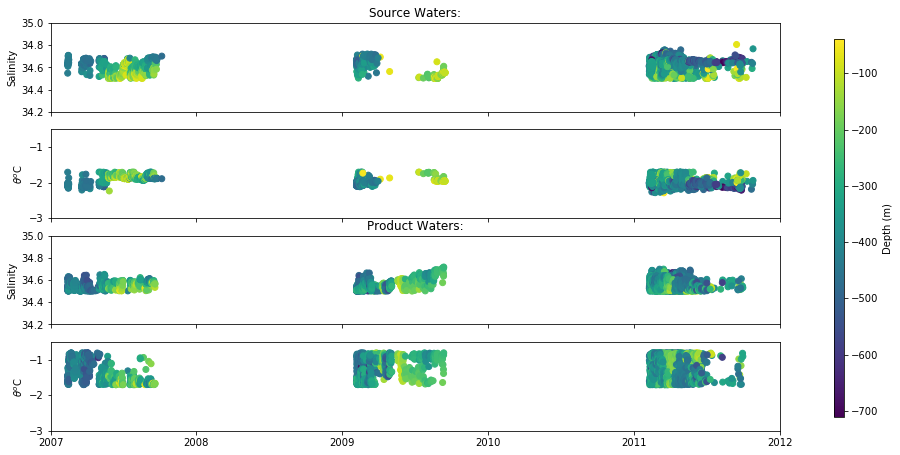

In [394]:
mask1 = (box1 | box2 | box3 | box4) & WSO_source
mask2 = (box1 | box2 | box3 | box4) & WSO_prod
print("Source:",len(dfmg[mask1]), "Product:", len(dfmg[mask2]))
timemin = pd.Timestamp('2007-01-01')
timemax = pd.Timestamp('2012-01-01')
plot_time_history2(dfmg, ht=7.5, title="", timemin=timemin, timemax= timemax, 
                  mask=[mask1, mask2], save=True, savename="./Images/WeddellSea_time_vs_botOfDiveSalCT.png")

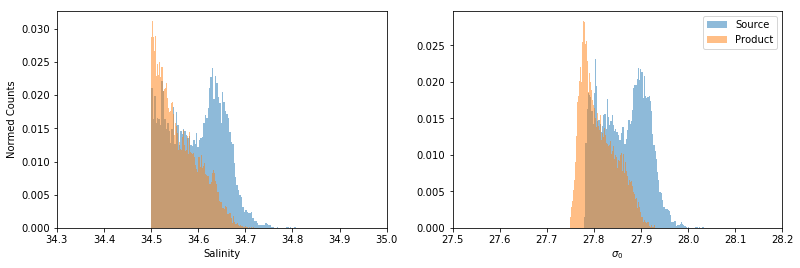

In [55]:
mask1 = (box1 | box2 | box3 | box4) & WSO_source
mask2 = (box1 | box2 | box3 | box4) & WSO_prod
plot_hist(dfmg[mask1], dfmg[mask2], label1="Source",
          label2="Product", ht=4, salmax=35, sigmax=28.2, save=True, 
          savename="./Images/WeddellSea_HistSalSigma.png")

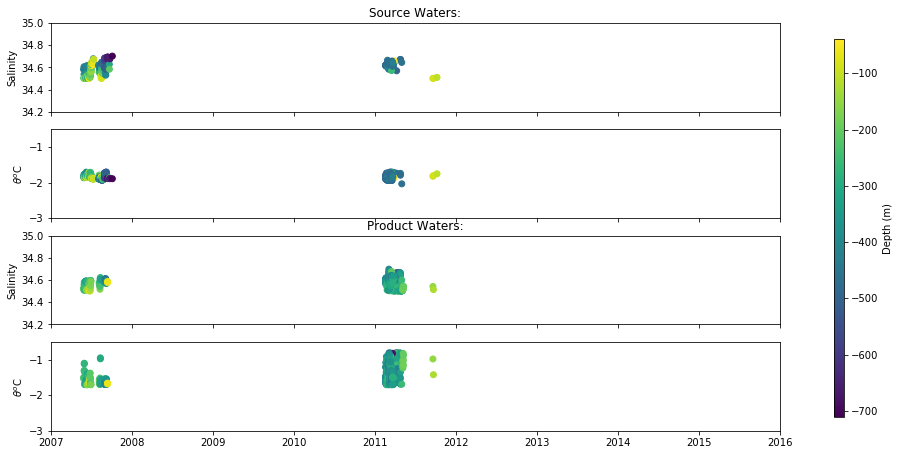

In [133]:
mask1 = box3 & WSO_source
mask2 = box3 & WSO_prod
plot_time_history2(dfmg, ht=7.5, title="", timemin=timemin, timemax= timemax, 
                  mask=[mask1, mask2])

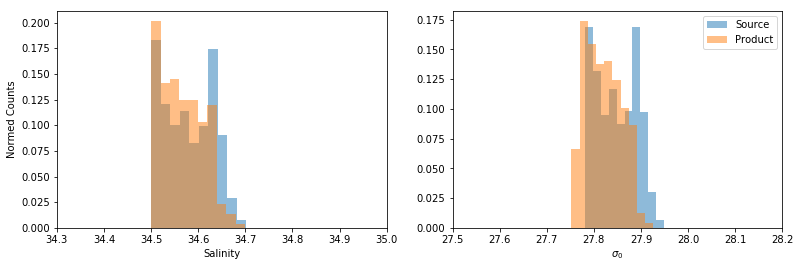

In [24]:
plot_hist(dfmg[WSO_source & box3], dfmg[WSO_prod & box3], label1="Source",
          label2="Product", ht=4, salmax=35, sigmax=28.2)

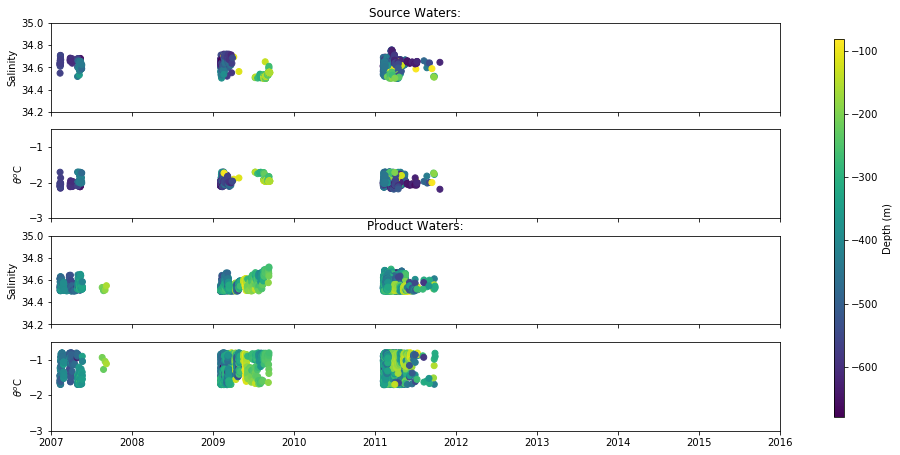

In [134]:
mask1 = box4 & WSO_source
mask2 = box4 & WSO_prod
plot_time_history2(dfmg, ht=7.5, title="", timemin=timemin, timemax= timemax, 
                  mask=[mask1, mask2])

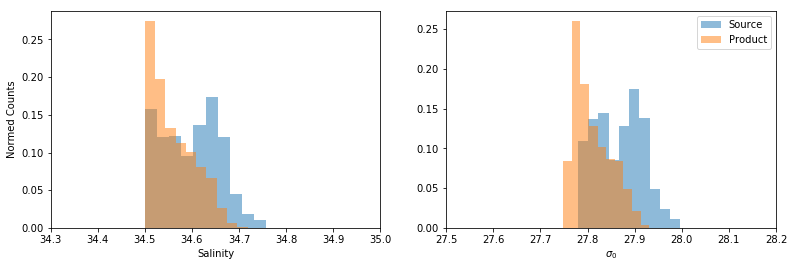

In [26]:
plot_hist(dfmg[WSO_source & box4], dfmg[WSO_prod & box4], label1="Source",
          label2="Product", ht=4, salmax=35, sigmax=28.2)

Source: 14885 Product: 6051


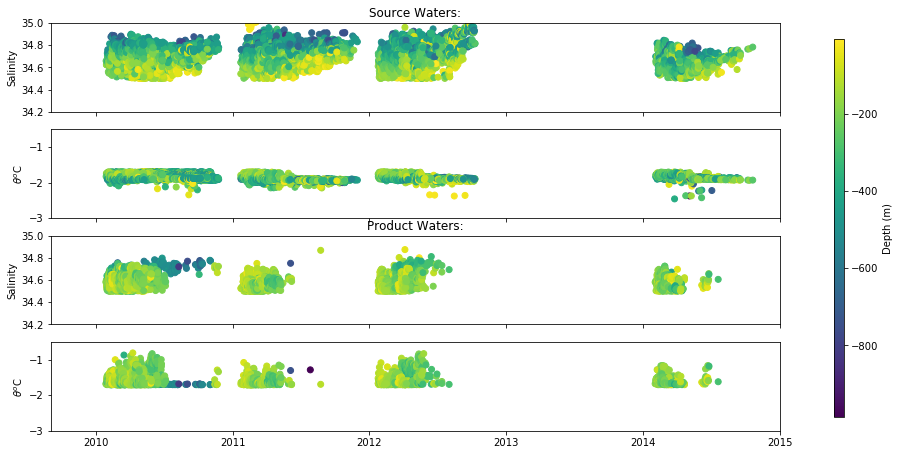

In [56]:
mask1 = (box5 | box6 | box7 | box8) & WSO_source
mask2 = (box5 | box6 | box7 | box8) & WSO_prod
print("Source:",len(dfmg.loc[mask1, 'PROFILE_NUMBER'].unique()), "Product:", 
      len(dfmg.loc[mask2, 'PROFILE_NUMBER'].unique()))
timemin = pd.Timestamp('2009-09-01')
timemax = pd.Timestamp('2015-01-01')
plot_time_history2(dfmg, ht=7.5, title="", timemin=timemin, timemax= timemax, 
                  mask=[mask1, mask2], save=True, savename="./Images/RossSea_time_vs_botOfDiveSalCT.png")

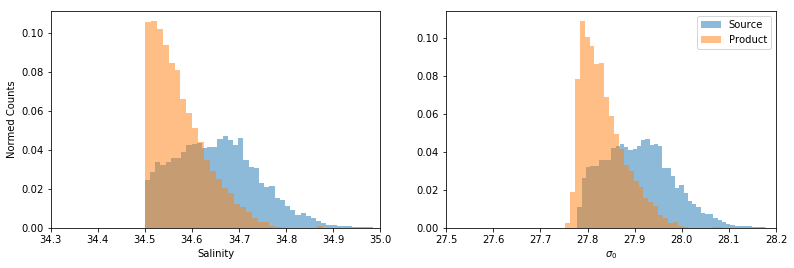

In [57]:
mask1 = (box5 | box6 | box7 | box8) & WSO_source
mask2 = (box5 | box6 | box7 | box8) & WSO_prod
plot_hist(dfmg[mask1], dfmg[mask2], label1="Source",
          label2="Product", ht=4, salmax=35, sigmax=28.2, save=True,
          savename="./Images/RossSea_HistSalSigma.png")

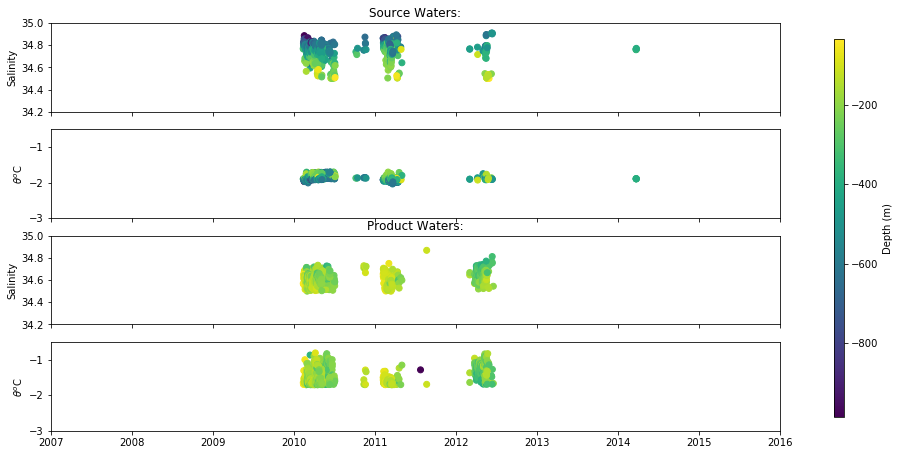

In [136]:
mask1 = box7 & WSO_source
mask2 = box7 & WSO_prod
plot_time_history2(dfmg, ht=7.5, title="", timemin=timemin, timemax= timemax, 
                  mask=[mask1, mask2])

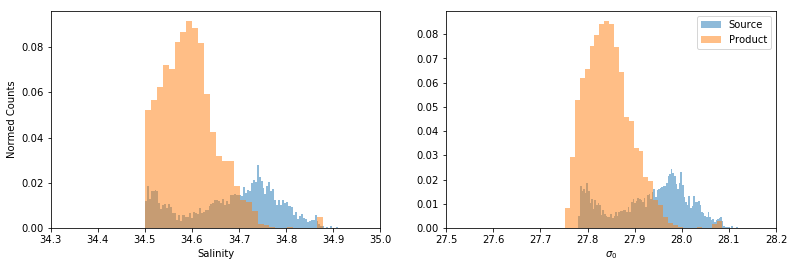

In [60]:
plot_hist(dfmg[WSO_source & box7], dfmg[WSO_prod & box7], label1="Source",
          label2="Product", ht=4, salmax=35, sigmax=28.2)

#### Neglecting Box-6 and Box-8 as they have very few readings

Source: 3859 Product: 1071


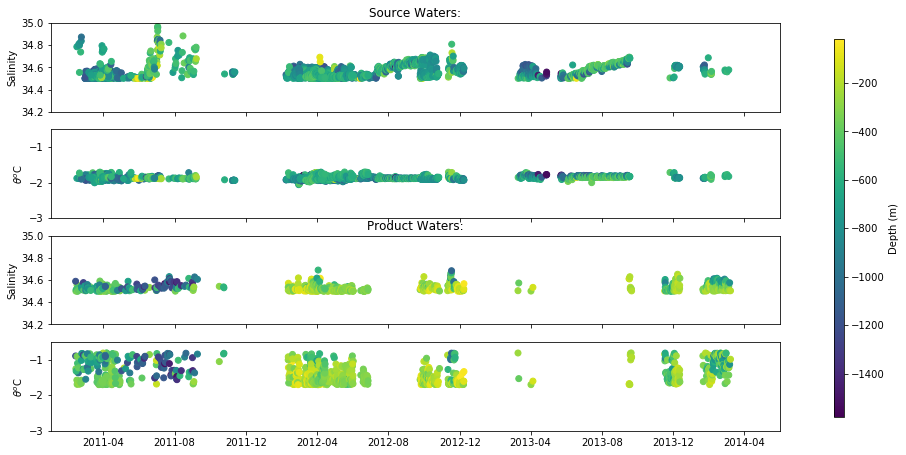

In [58]:
mask1 = (box9 | box10) & WSO_source
mask2 = (box9 | box10) & WSO_prod
timemin = pd.Timestamp('2011-01-01')
timemax = pd.Timestamp('2014-06-01')
print("Source:",len(dfmg.loc[mask1, 'PROFILE_NUMBER'].unique()), "Product:", 
      len(dfmg.loc[mask2, 'PROFILE_NUMBER'].unique()))
plot_time_history2(dfmg,ht=7.5, title="", timemin=timemin, timemax= timemax, 
                  mask=[mask1, mask2], save=True, savename="./Images/PrydzBay_time_vs_botOfDiveSalCT.png")

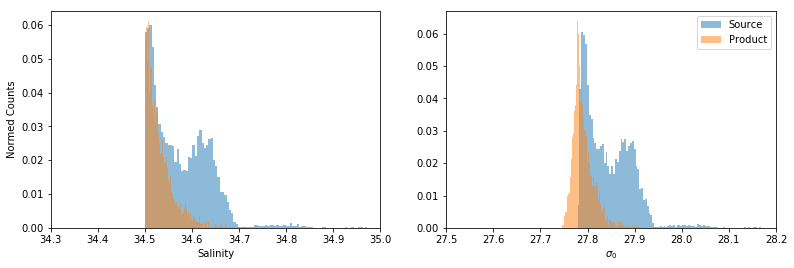

In [59]:
mask1 = (box9 | box10) & WSO_source
mask2 = (box9 | box10) & WSO_prod
plot_hist(dfmg[mask1], dfmg[mask2], label1="Source",
          label2="Product", ht=4, salmax=35, sigmax=28.2, save=True, 
          savename="./Images/PrydzBay_HistSalSigma.png")

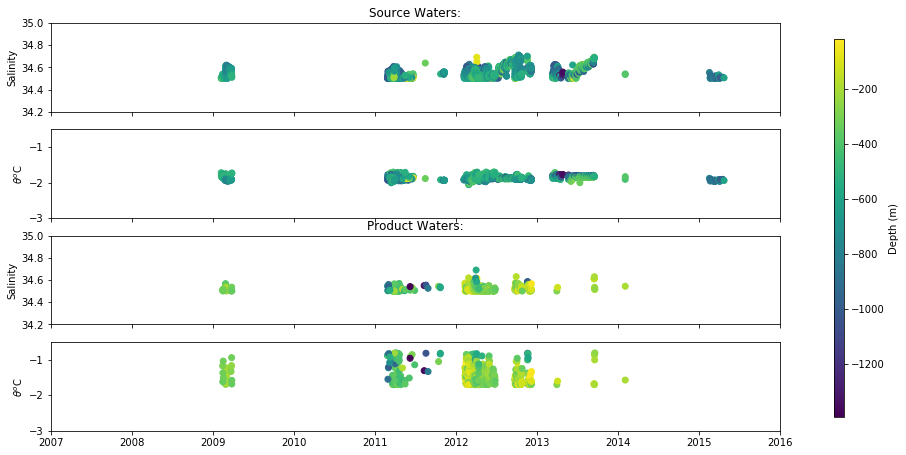

In [137]:
mask1 = box10 & WSO_source
mask2 = box10 & WSO_prod
plot_time_history2(dfmg, ht=7.5, title="", timemin=timemin, timemax= timemax, 
                  mask=[mask1, mask2])

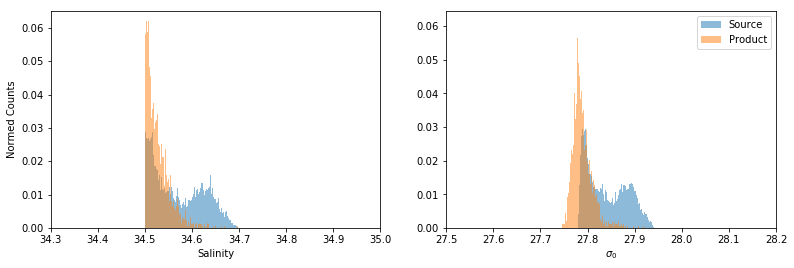

In [61]:
plot_hist(dfmg[WSO_source & box10], dfmg[WSO_prod & box10], label1="Source",
          label2="Product", ht=4, salmax=35, sigmax=28.2)

We see that the dataset is from 2004-2016. The table below shows the no of profiles that were recorded on a monthly basis. Also, the no of profiles that recorded waters with Bottom water (source) properties are in the WSO column.

In [ ]:
monthnos = np.arange(1,13,1)
months = ['J','F','M','A','M','J','J','A','S','O','N','D']
print("All profiles:","\t \t", "NPROFs- Source","\t \t", "Ratio %", "\t \t NPROFS- Prod")
nprof_all = np.zeros(12)
nprof_source = np.zeros(12)
nprof_prod = np.zeros(12)

for i in range(12):
    nprof_all[i] = dfmg.loc[(dfmg['JULD'].dt.month == monthnos[i]),'JULD'].count()
    nprof_source[i] = dfmg.loc[(dfmg['JULD'].dt.month == monthnos[i])&WSO_source, \
                                                              'JULD'].count()
    nprof_prod[i] = dfmg.loc[(dfmg['JULD'].dt.month == monthnos[i])&WSO_prod, \
                                                              'JULD'].count()
    print("NPROF in ",months[i], nprof_all[i],"\t", \
         "NPROF in ",months[i], nprof_source[i], "\t", nprof_source[i]/nprof_all[i]*100., "\t \t", nprof_prod[i])

In [404]:
def plot_counts_profs(df, boxes=[box2, box4, box5, box7, box9, box10], 
                      titles=['box2', 'box4', 'box5', 'box7', 'box9', 'box10'],
                      row=2, col=3, wd=12, ht=10, save=False, savename="Untitled.png" ):
    
    monthnos = np.arange(1,13,1)
    months = ['J','F','M','A','M','J','J','A','S','O','N','D']

    fig, axarr = plt.subplots(row, col, figsize=(wd,ht))


    for j in range(len(boxes)):
        nprof_all = np.zeros(12)
        nprof_source = np.zeros(12)
        nprof_prod = np.zeros(12)

        for i in range(12):
            nprof_all[i] = df.loc[(df['JULD'].dt.month == monthnos[i]) & boxes[j],'JULD'].count()
            nprof_source[i] = df.loc[(df['JULD'].dt.month == monthnos[i])&WSO_source & boxes[j], \
                                                                  'JULD'].count()
            nprof_prod[i] = df.loc[(df['JULD'].dt.month == monthnos[i])&WSO_prod & boxes[j], \
                                                                  'JULD'].count()

        m = int(j/col)
        n = int(j%col)
        print(m,n)
        ax = axarr[n]
        ax_sp = ax.twinx()
        wd=0.1
        rects_all = ax.bar(np.arange(12), nprof_all, wd, color='y', label='nprof_all')
        rects_source = ax_sp.bar(np.arange(12)+wd, nprof_source/nprof_all*100, wd, color='r', label='nprof_source')
        rects_prod = ax_sp.bar(np.arange(12)+wd*2, nprof_prod/nprof_all*100, wd, color='b', label='nprof_prod')
        ax.set_xticks(np.arange(12) + wd*2)
        ax.set_xticklabels(months)
        ax_sp.set_ylim(0,60)
        if(n == 0):
            ax.set_ylabel("count of all profiles")
        if(n == col-1):
            ax_sp.set_ylabel("% occurence of source or product \n in total count of all profiles")
        ax.set_title(titles[j])

        handles, labels = ax.get_legend_handles_labels()
        handles2, labels2 = ax_sp.get_legend_handles_labels()
        
        if(j == 0):
            ax.legend(handles+handles2, labels+labels2, loc=0)
    plt.tight_layout()
    if(save==True):
        plt.savefig(savename, dpi=150)
    plt.show()

0 0


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide


0 1
0 2


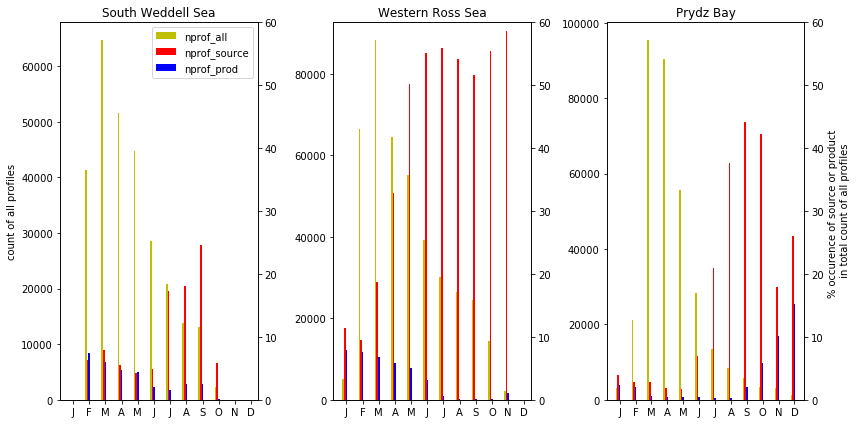

In [407]:
plot_counts_profs(dfmg, boxes=[Weddell, Ross, Prydz], row=1, col=3, titles=['South Weddell Sea', 
                                                                            'Western Ross Sea', 'Prydz Bay'], 
                  ht=6, save=True, savename='./Images/Hist_regionwise.png')

0 0


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide


0 1
0 2
1 0
1 1
1 2


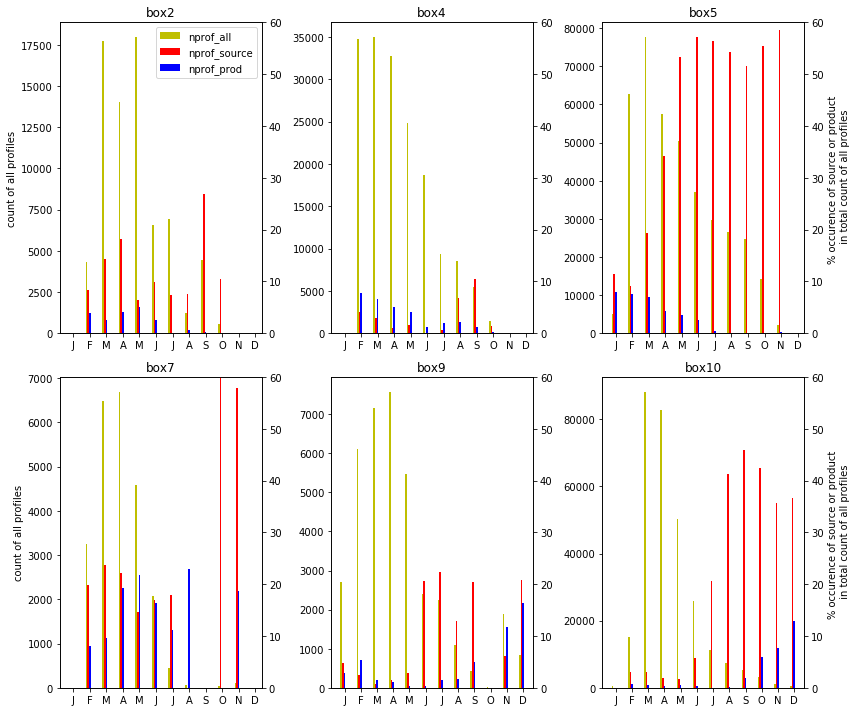

In [401]:
plot_counts_profs(dfmg, save=True, savename="./Images/Hist_regionwise.png")

In [146]:
print(len(dfmg[WSO_source]), len(dfmg[WSO_prod]))

215916 48305


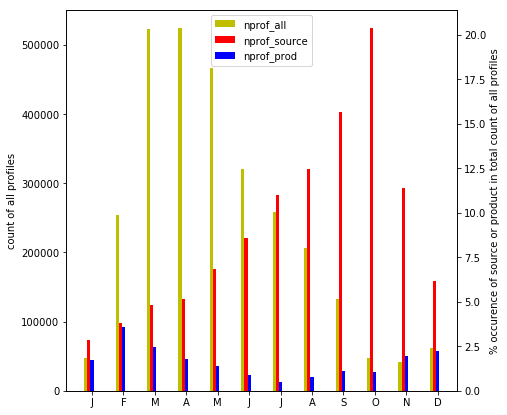

In [121]:
monthnos = np.arange(1,13,1)
months = ['J','F','M','A','M','J','J','A','S','O','N','D']

fig, ax = plt.subplots(figsize=(7,7))

nprof_all = np.zeros(12)
nprof_source = np.zeros(12)
nprof_prod = np.zeros(12)

for i in range(12):
    nprof_all[i] = dfmg.loc[(dfmg['JULD'].dt.month == monthnos[i]) ,'JULD'].count()
    nprof_source[i] = dfmg.loc[(dfmg['JULD'].dt.month == monthnos[i])&WSO_source, \
                                                          'JULD'].count()
    nprof_prod[i] = dfmg.loc[(dfmg['JULD'].dt.month == monthnos[i])&WSO_prod, \
                                                          'JULD'].count()

ax_sp = ax.twinx()
wd=0.1
rects_all = ax.bar(np.arange(12), nprof_all, wd, color='y', label='nprof_all')
rects_source = ax_sp.bar(np.arange(12)+wd, nprof_source/nprof_all*100, wd, color='r', label='nprof_source')
rects_prod = ax_sp.bar(np.arange(12)+wd*2, nprof_prod/nprof_all*100, wd, color='b', label='nprof_prod')
ax.set_xticks(np.arange(12) + wd*2)
ax.set_xticklabels(months)
ax.set_ylabel("count of all profiles")
ax_sp.set_ylabel("% occurence of source or product in total count of all profiles")

handles, labels = ax.get_legend_handles_labels()
handles2, labels2 = ax_sp.get_legend_handles_labels()

ax.legend(handles+handles2, labels+labels2, loc=9)
plt.savefig("./Images/hist_profcount_allregion.png")
plt.show()

**legend guide:**

1. nprof_all : No of profiles in the dataframe (all profiles with good QC occuring below 60S)
1. nprof_source : % of profiles meeting the source water properties as defined in Legg, 2009
1. nprof_prod : % of profiles meeting the product water properties as defined in Legg, 2009

** Interesting observations: **
1. The no of profiles (all) peaks in the low sea ice months and then drops off
1. However, the source water occurence increases along with the increase in sea ice
1. Product water however seems to peak in Feb. Why is this so? Could this be because the dives that go deep enough in the deeper sea (away from the continental shelf) are not happening much?

There are 0 source water masses detetected in 2005 and 2006 despite there being a lot of readings in those years.

There are very few readings in 2008, 2009, and 2015. Why?

1. Where were the readings clustered? Is the distribution different from the other years?
    1. 2008 - there were no profiles within Ross, Weddell, and Prydz bay regions
    1. 2009 - there were a few profiles within Weddell Sea, and Prydz bay. However, in the Weddell Sea, it was more to the East of FRIS, and in deeper waters. In the prydz bay too, it was in the deeper waters.
    1. 2015, there were readings in the Prydz bay region alone
2. What was the climatological anomaly in SST, sea ice extent, salinity etc in the above years as compared to the other years

In [36]:
years = dfmg['JULD'].dt.year.unique()
years = np.sort(years)
below60S = dfmg['LATITUDE'] < -60
print("All profiles:","\t \t", "NPROFs- Source","\t \t", "Ratio %", "\t \t NPROFS- Prod")
for i in years:
    nprof_all = dfmg.loc[(dfmg['JULD'].dt.year == i) ,'JULD'].count()
    nprof_source = dfmg.loc[(dfmg['JULD'].dt.year == i) & WSO_source ,'JULD'].count()
    nprof_prod = dfmg.loc[(dfmg['JULD'].dt.year == i) & WSO_prod ,'JULD'].count()
    print("NPROF in ",i, nprof_all,"\t \t", \
         nprof_source, "\t \t", nprof_source/nprof_all*100., "\t \t", nprof_prod)

All profiles: 	 	 NPROFs- Source 	 	 Ratio % 	 	 NPROFS- Prod
NPROF in  2004 58087 	 	 221 	 	 0.380463787078 	 	 675
NPROF in  2005 92410 	 	 0 	 	 0.0 	 	 10
NPROF in  2006 92467 	 	 0 	 	 0.0 	 	 0
NPROF in  2007 375191 	 	 11569 	 	 3.0834961393 	 	 3149
NPROF in  2008 365188 	 	 5155 	 	 1.41160169557 	 	 2291
NPROF in  2009 376991 	 	 5777 	 	 1.53239732514 	 	 3846
NPROF in  2010 402231 	 	 55441 	 	 13.7833732358 	 	 12023
NPROF in  2011 532180 	 	 68616 	 	 12.8933819384 	 	 13503
NPROF in  2012 344797 	 	 43064 	 	 12.4896678335 	 	 8593
NPROF in  2013 95267 	 	 6044 	 	 6.34427451269 	 	 1344
NPROF in  2014 97190 	 	 19597 	 	 20.1635970779 	 	 2642
NPROF in  2015 52416 	 	 432 	 	 0.824175824176 	 	 229
NPROF in  2016 56 	 	 0 	 	 0.0 	 	 0


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1623: MatplotlibDeprecationWarning: The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.
  fill_color = ax.get_axis_bgcolor()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


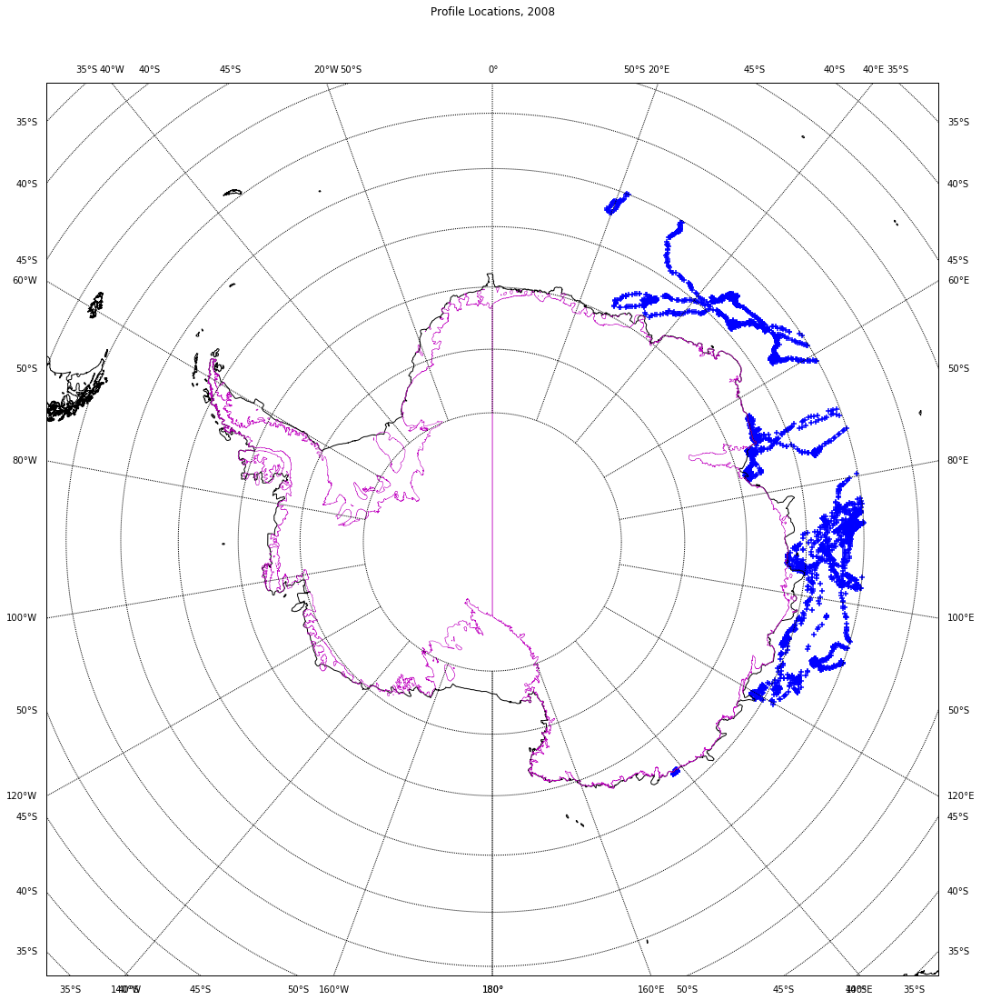

In [69]:
mask_yr = (dfmg['JULD'].dt.year == 2015)
unique_positions60 = dfmg.loc[mask_yr].loc[:,"LATITUDE": "LONGITUDE"].drop_duplicates(subset=['LONGITUDE', 'LATITUDE']).values
pltStn.plot_station_locations(unique_positions60, title='Profile Locations, 2008')

In [328]:
print("Year \t\t Weddell \t\t Ross \t\t Prydz")
for i in years:
    yr = dfmg['JULD'].dt.year == i
    mask = below60S & yr
    Weddell = (dfmg.loc[mask, 'LONGITUDE'] > -65) & (dfmg.loc[mask, 'LONGITUDE'] < -18)
    Ross = ( ((dfmg.loc[below60S & yr, 'LONGITUDE'] > 160) & (dfmg.loc[below60S & yr, 'LONGITUDE'] < 180))
        | ((dfmg.loc[below60S & yr, 'LONGITUDE'] < -140) & (dfmg.loc[below60S & yr, 'LONGITUDE'] > -180)) )
        
    Prydz = (dfmg.loc[mask, 'LONGITUDE'] > 60) & (dfmg.loc[mask, 'LONGITUDE'] < 85)

    Weddell_count = len(dfmg.loc[yr&below60S & Weddell, 'LATITUDE':'LONGITUDE'].drop_duplicates(subset=['LONGITUDE', 
                                                                               'LATITUDE']).values)
    Ross_count = len(dfmg.loc[yr&below60S & Ross, 'LATITUDE':'LONGITUDE'].drop_duplicates(subset=['LONGITUDE', 
                                                                               'LATITUDE']).values)
    Prydz_count = len(dfmg.loc[yr&below60S & Prydz, 'LATITUDE':'LONGITUDE'].drop_duplicates(subset=['LONGITUDE', 
                                                                               'LATITUDE']).values)
    print(i,'\t \t', Weddell_count, '\t \t', Ross_count, '\t \t', Prydz_count)


Year 		 Weddell 		 Ross 		 Prydz
2004 	 	 0 	 	 1456 	 	 467
2005 	 	 930 	 	 712 	 	 678
2006 	 	 287 	 	 116 	 	 5653
2007 	 	 7268 	 	 0 	 	 3860
2008 	 	 3940 	 	 0 	 	 0
2009 	 	 6708 	 	 134 	 	 1021
2010 	 	 4202 	 	 12078 	 	 0
2011 	 	 9862 	 	 5955 	 	 10964
2012 	 	 0 	 	 6059 	 	 6604
2013 	 	 268 	 	 267 	 	 1164
2014 	 	 342 	 	 1962 	 	 621
2015 	 	 0 	 	 0 	 	 833
2016 	 	 0 	 	 0 	 	 7


In [229]:
from haversine import haversine
def dist_min(points, lons, lats):
    if(len(lons) != len(lats)):
        raise ValueError('lons and lats must be equal len')
    min_distance = np.zeros(len(points))
    distance = np.zeros(len(lons))
    
    for i in range(len(points)):
        for j in range(len(lons)):
            distance[j] = haversine([points[i,0], points[i,1]], [lats[j], lons[j]])
        min_distance[i] = distance.min()
    return min_distance

In [232]:
points = dfmg.loc[box2 & WSO_source & mask_low & sel_inversion & lt60, "LATITUDE": "LONGITUDE"].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values

In [37]:
dfmg.loc[:,'mab'] = abs(dfmg['ECHODEPTH'].abs() - dfmg['DEPTH'].abs())

In [17]:
sel_inversion = -dfmg['DENSITY_GRADIENT'] < 0
len(dfmg.loc[sel_inversion])

420568

In [256]:
def find_distance_to_groundingLine(points, grndLine):
    # ensure points are in lon, lat format
    from shapely.geometry import Point
    import geopandas as gpd
    pointsList = []
    for i in range(len(points)):
        pointsList.append(Point(points[i]))
    geo_points = gpd.GeoSeries(pointsList)
    distance_min = np.zeros(len(geo_points))
    
    for i in range(len(geo_points)):
        dist_all = grndLine.geometry[:].distance(geo_points[i]) * np.pi/180 * 6371.
        distance_min[i] = dist_all.min()
    return distance_min

In [255]:
grndLine = gpd.read_file("/media/data/Datasets/Shapefiles/AntarcticGroundingLine/GSHHS_f_L6.shp")

In [250]:
from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA
import scipy.interpolate as interpolate
import pdb
import numpy.ma as ma

def find_depth_averages_v2(df, wd=7, ht=5, tmin = -2.3, tmax=-0.5, salmin=33.5, salmax=35.4,
                           sigmin=26, sigmax=28, sigvline=[0,0], save=False, savename='Untitled.png',
                           depth_bins=10.0, mask_depth_step=-5.0, use_sample_sd=False, use_full_sd=True,
                           cutoff_depth=0, errorevery=1, ymin=0, maskerror=0, markersize='4'):
    zlowest = df['DEPTH'].min()
    zhighest = 0.0
    
    depth_binned = np.arange(zlowest, zhighest, depth_bins)
        
    binned_groups = df.groupby(pd.cut(df.DEPTH, depth_binned))
    
    sal_mean = binned_groups['PSAL_ADJUSTED'].mean().values
    sal_count = binned_groups['PSAL_ADJUSTED'].count().values
    sal_sd = binned_groups['PSAL_ADJUSTED'].std().values
    
    temp_mean = binned_groups['TEMP_ADJUSTED'].mean().values
    temp_count = binned_groups['TEMP_ADJUSTED'].count().values
    temp_sd = binned_groups['TEMP_ADJUSTED'].std().values

    sigma_mean = binned_groups['POT_DENSITY'].mean().values
    sigma_count = binned_groups['POT_DENSITY'].count().values
    sigma_sd = binned_groups['POT_DENSITY'].std().values

    
    def get_xerror(sd, n_sd):
        xerror = 1.96 * sd / np.sqrt(n_sd)
        if(maskerror > 0):
            xerror = ma.array(xerror, mask=(xerror > np.percentile(xerror, maskerror) ))
        else:
            xerror = ma.array(xerror, mask=(xerror < 0))
        return xerror
    
    fig = plt.figure(figsize=(wd,ht))
    axT = host_subplot(1,1,1, axes_class=AA.Axes)
    axS = axT.twiny()
    axSig = axT.twiny()
    
    offset = 40
    new_fixed_axis = axSig.get_grid_helper().new_fixed_axis
    axSig.axis["top"] = new_fixed_axis(loc="top",
                                    axes=axSig,
                                    offset=(0,offset))
    axSig.axis["top"].toggle(all=True)
    temp_xerror = get_xerror(temp_sd, temp_count)
    mask_low = np.where(temp_count > 9)[0]
    
    axT.errorbar(temp_mean[mask_low], depth_binned[:-1][mask_low], xerr=temp_xerror[mask_low], 
                 errorevery=errorevery, capsize=4, 
                 color='b', fmt='.', markersize=markersize)
    
    axT.set_xlabel("$\\theta^o$ C", color='b')
    axT.set_xlim(tmin, tmax)
    if(cutoff_depth != 0):
        axT.set_ylim(cutoff_depth, 0)
    axT.set_ylabel('Depth (m)')
    
    sal_xerror = get_xerror(sal_sd, sal_count)
    mask_low = np.where(sal_count > 9)[0]
    axS.errorbar(sal_mean[mask_low], depth_binned[:-1][mask_low], xerr=sal_xerror[mask_low], 
                 errorevery=errorevery, capsize=4, color='r', fmt='.', markersize=markersize)
    axS.set_xlim(salmin, salmax)
    axS.set_xlabel("Salinity", color='r')
    
    sigma_xerror = get_xerror(sigma_sd, sigma_count)
    mask_low = np.where(sigma_count > 9)[0]
    axSig.errorbar(sigma_mean[mask_low], depth_binned[:-1][mask_low], xerr=sigma_xerror[mask_low], 
                   errorevery=errorevery, 
                   capsize=4, color='g', fmt='.', markersize=markersize)
    axSig.set_xlabel('$\sigma_0$(kgm$^{-3}$)', color='g')
    axSig.set_xlim(sigmin, sigmax)
    axSig.axis["top"].label.set_color('g')
    axSig.locator_params(axis='x',nticks=4)
    axSig.axvline(x = sigvline[0], color='g', linestyle='--')
    axSig.axvline(x = sigvline[1], color='g', linestyle='--')
    
    plt.tight_layout();
    if(save==True):
        plt.savefig(savename, dpi=150)
    
    plt.show();


In [149]:
from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA
import scipy.interpolate as interpolate
import pdb
import numpy.ma as ma

def find_depth_averages(df, wd=7, ht=5, tmin = -2.3, tmax=-0.5, salmin=33.5, salmax=35.4, 
                        sigmin=26, sigmax=28, sigvline=[0,0], save=False, savename='Untitled.png', 
                        depth_increment=-10.0, mask_depth_step=-5.0, use_sample_sd=False, use_full_sd=True, 
                        cutoff_depth=0, errorevery=1, ymin=0, maskerror=0, markersize='4'):
    zlowest = df['DEPTH'].min()
    zhighest = 0.0
    z = np.arange(zhighest, zlowest, depth_increment)
    depth_bins = np.arange(zlowest, zhighest, -depth_increment)
    sal_z = np.zeros(len(z))
    count_sal = np.zeros(len(z))
    temp_z = np.zeros(len(z))
    count_temp = np.zeros(len(z))
    sigma_z = np.zeros(len(z))
    count_sigma = np.zeros(len(z))
    
    def get_full_sample_sd(var):
        SD = np.zeros(len(z))
        N_SD = np.zeros(len(z))
        for i in range(len(z)):
            mds = mask_depth_step
            flag = 0
            if(use_full_sd == True):
                mask_depth_full = (dfmg['DEPTH'] < (z[i] - mds)) & (dfmg['DEPTH'] > 
                                                                            (z[i] + mds))
                SD[i] = dfmg.loc[mask_depth_full, var].std()
            if(use_sample_sd == True):
                mask_depth_sample = (df['DEPTH'] < (z[i] - mds)) & (df['DEPTH'] > 
                                                                            (z[i] + mds))
                SD[i] = df.loc[mask_depth_sample, var].std()
                
            N_SD[i] = len(df.loc[mask_depth_sample, var].dropna())
            
            while(N_SD[i] == 0 & flag == 0):
                if(use_full_sd == True):
                    mask_depth_full = (dfmg['DEPTH'] < (z[i] - mds)) & (dfmg['DEPTH'] > 
                                                                            (z[i] + mds))
                    SD[i] = dfmg.loc[mask_depth_full, var].std()
                if(use_sample_sd == True):
                    mask_depth_sample = (df['DEPTH'] < (z[i] - mds)) & (df['DEPTH'] > 
                                                                            (z[i] + mds))
                    SD[i] = df.loc[mask_depth_sample, var].std()
                
                N_SD[i] = len(df.loc[mask_depth_sample, var].dropna())
                if(N_SD[i] == 0):
                    mds = mds-5.0
                    flag = 1
                    
            sd_max = max(SD)
            SD[np.isnan(SD)] = sd_max
            N_SD[N_SD == 0] = 1
        return SD, N_SD
    
    def get_var_to_nearest_z_level(dfprof):
        sal = dfprof['PSAL_ADJUSTED'].dropna().values
        depth_sal = dfprof.loc[dfprof['PSAL_ADJUSTED'].dropna().index, 'DEPTH'].values

        temp = dfprof['CTEMP'].dropna().values
        depth_temp = dfprof.loc[dfprof['CTEMP'].dropna().index, 'DEPTH'].values

        sigma = dfprof['POT_DENSITY'].dropna().values
        depth_sigma = dfprof.loc[dfprof['POT_DENSITY'].dropna().index, 'DEPTH'].values
        
        if((len(sal) > 1) & (len(temp) > 1) & (len(sigma) > 1)):
            def get_z_range_ind(depth):
                z_start = np.argmin(abs(z - depth[0]))
                z_end = np.argmin(abs(z - depth[-1]))
                return z_start, z_end

            def get_interpd_values(var, depth):
                interp_func = interpolate.interp1d(depth, var)
                return interp_func(z[z_start+1:z_end])

            z_start, z_end = get_z_range_ind(depth_sal)
            sal_z[z_start+1:z_end] += get_interpd_values(sal[:], depth_sal[:])
            count_sal[z_start+1:z_end] += 1

            #pdb.set_trace()
            z_start, z_end = get_z_range_ind(depth_temp)
            temp_z[z_start+1:z_end] += get_interpd_values(temp[:], depth_temp[:])
            count_temp[z_start+1: z_end] += 1

            z_start, z_end = get_z_range_ind(depth_sigma)
            sigma_z[z_start+1:z_end] += get_interpd_values(sigma[:], depth_sigma[:])
            count_sigma[z_start+1: z_end] += 1
        
    df.groupby('PROFILE_NUMBER').apply(get_var_to_nearest_z_level)
    
    def get_xerror(sd, n_sd):
        xerror = 1.96 * sd / np.sqrt(n_sd)
        if(maskerror > 0):
            xerror = ma.array(xerror, mask=(xerror > np.percentile(xerror, maskerror) ))
        else:
            xerror = ma.array(xerror, mask=(xerror < 0))
        return xerror
    
    fig = plt.figure(figsize=(wd,ht))
    axT = host_subplot(1,1,1, axes_class=AA.Axes)
    axS = axT.twiny()
    axSig = axT.twiny()
    
    offset = 40
    new_fixed_axis = axSig.get_grid_helper().new_fixed_axis
    axSig.axis["top"] = new_fixed_axis(loc="top",
                                    axes=axSig,
                                    offset=(0,offset))
    axSig.axis["top"].toggle(all=True)
    
    sd, n_sd = get_full_sample_sd('CTEMP')
    xerror = get_xerror(sd, n_sd)
    avg = temp_z[1:-1]/count_temp[1:-1]
    axT.errorbar(avg[~xerror.mask[1:-1]], z[1:-1][~xerror.mask[1:-1]], xerr=xerror[1:-1][~xerror.mask[1:-1]], 
                 errorevery=errorevery, capsize=4, 
                 color='b', fmt='.', markersize=markersize)
    
    axT.set_xlabel("$\\theta^o$ C", color='b')
    axT.set_xlim(tmin, tmax)
    if(cutoff_depth != 0):
        axT.set_ylim(cutoff_depth, 0)
    axT.set_ylabel('Depth (m)')
    
    sd, n_sd = get_full_sample_sd('PSAL_ADJUSTED')
    xerror = get_xerror(sd, n_sd)
    avg = sal_z[1:-1]/count_sal[1:-1]
    axS.errorbar(avg[~xerror.mask[1:-1]], z[1:-1][~xerror.mask[1:-1]], xerr=xerror[1:-1][~xerror.mask[1:-1]], 
                 errorevery=errorevery, capsize=4, color='r', fmt='.', markersize=markersize)
    axS.set_xlim(salmin, salmax)
    axS.set_xlabel("Salinity", color='r')
    
    sd, n_sd = get_full_sample_sd('POT_DENSITY')
    xerror = get_xerror(sd, n_sd)
    avg = sigma_z[1:-1]/count_sigma[1:-1]
    axSig.errorbar(avg[~xerror.mask[1:-1]], z[1:-1][~xerror.mask[1:-1]], xerr=xerror[1:-1][~xerror.mask[1:-1]], 
                   errorevery=errorevery, 
                   capsize=4, color='g', fmt='.', markersize=markersize)
    axSig.set_xlabel('$\sigma_0$(kgm$^{-3}$)', color='g')
    axSig.set_xlim(sigmin, sigmax)
    axSig.axis["top"].label.set_color('g')
    axSig.locator_params(axis='x',nticks=4)
    axSig.axvline(x = sigvline[0], color='g', linestyle='--')
    axSig.axvline(x = sigvline[1], color='g', linestyle='--')
    
    plt.tight_layout();
    if(save==True):
        plt.savefig(savename, dpi=150)
    
    plt.show();

In [67]:
def get_mask_from_prof_mask(df, profmask):
    profs = dfmg.loc[profmask, 'PROFILE_NUMBER'].unique()
    mask = np.zeros(len(dfmg), dtype=bool)
    for i in range(len(profs)):
        mask = mask | (dfmg['PROFILE_NUMBER'] == profs[i])
    return mask

2091


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


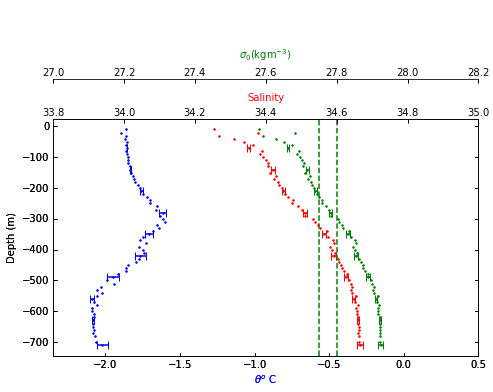

In [254]:
mask_months = sel_months(dfmg, [12,1,2,3,4,5])
Weddell = box1|box2|box3|box4
print(len(dfmg.loc[(Weddell & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Weddell & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.8, 27.75], tmin=-2.35, tmax=0.5, salmin=33.8,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Weddell_source_DJFMAM.png', 
                    use_sample_sd=True, use_full_sd=False, errorevery=7, maskerror=False, 
                       markersize='3', depth_bins=10)

In [169]:
def play_beep():
    import os
    duration = 1  # second
    freq = 440  # Hz
    os.system('play --no-show-progress --null --channels 1 synth %s sine %f' % (duration, freq))
play_beep()

9661


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


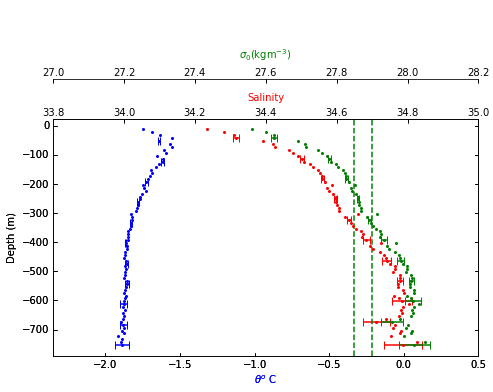

In [191]:
mask_months = sel_months(dfmg, [12,1,2,3,4,5])
Ross = box5| box6| box7| box8
print(len(dfmg.loc[(Ross & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Ross & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.9, 27.85], tmin=-2.35, tmax=0.5, salmin=33.8,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Ross_source_DJFMAM.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=7, maskerror=False)

2826


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


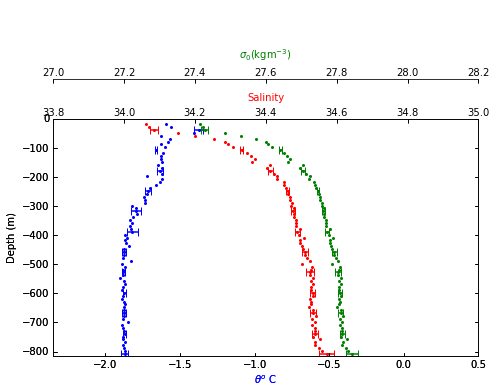

In [193]:
mask_months = sel_months(dfmg, [12,1,2,3,4,5])
PrydzBay = box9 | box10
print(len(dfmg.loc[(PrydzBay & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (PrydzBay & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[0, 0], tmin=-2.35, tmax=0.5, salmin=33.8,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Prydz_source_DJFMAM.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=-815, errorevery=7, maskerror=False)

746


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


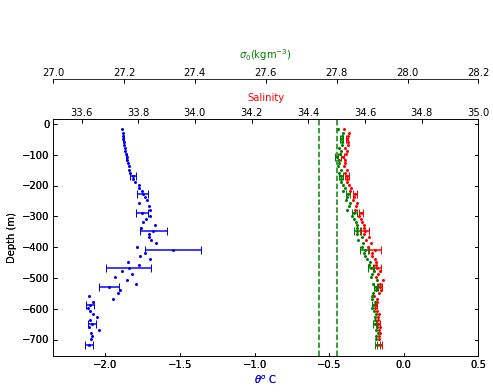

In [198]:
mask_months = sel_months(dfmg, [6,7,8,9,10,11])
Weddell = (box1|box2|box3|box4)
print(len(dfmg.loc[(Weddell & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Weddell & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.8, 27.75], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Weddell_source_JJASON.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=6)

5224


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


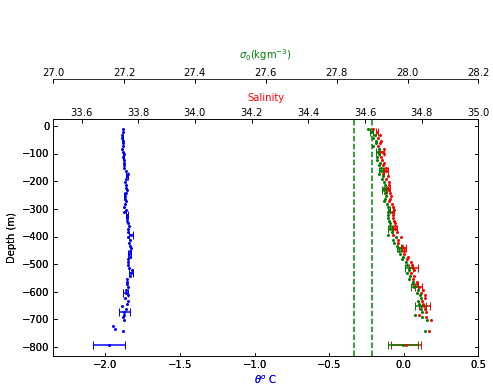

In [200]:
mask_months = sel_months(dfmg, [6,7,8,9,10,11])
Ross = (box5 | box6| box7| box8)
print(len(dfmg.loc[(Ross & WSO_source & mask_months ), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Ross & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.9, 27.85], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Ross_source_JJASON.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=7)

1033


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


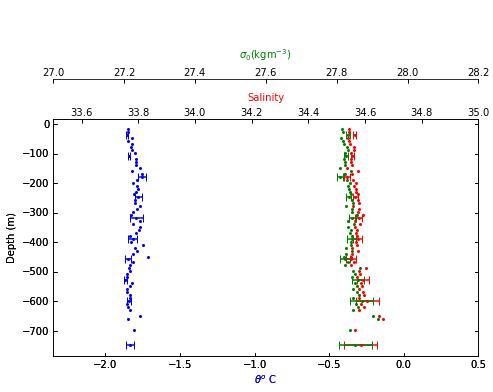

In [206]:
mask_months = sel_months(dfmg, [6,7,8,9,10,11])
PrydzBay = (box9 | box10)
print(len(dfmg.loc[(PrydzBay & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (PrydzBay & mask_months & WSO_source) )
find_depth_averages_v2(dfmg[mask & mask_no_null], sigvline=[0, 0], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_PrydzBay_source_JJASON.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=7)

504


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


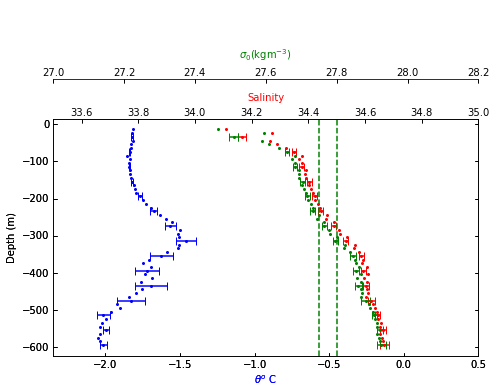

In [207]:
mask_months = sel_months(dfmg, [12,1,2])
Weddell = (box1 | box2 | box3 | box4)
print(len(dfmg.loc[(Weddell & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Weddell & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.8, 27.75], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Weddell_source_DJF.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=4)

2113


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


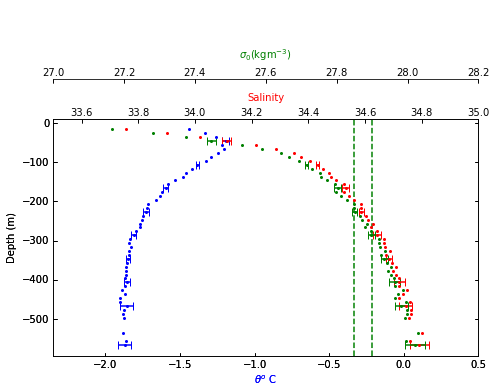

In [208]:
mask_months = sel_months(dfmg, [12,1,2])
Ross = (box5 | box6| box7| box8)
print(len(dfmg.loc[(Ross & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Ross & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.9, 27.85], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Ross_source_DJF.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=6)

374


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


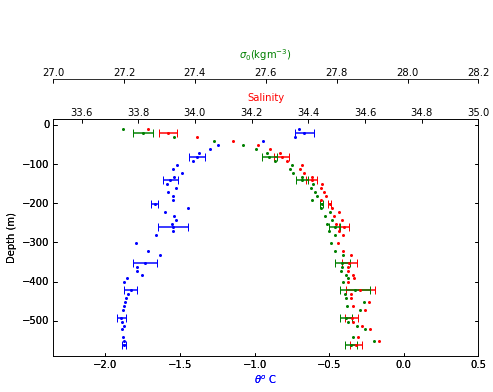

In [209]:
mask_months = sel_months(dfmg, [12,1,2])
Prydz = (box9 | box10)
print(len(dfmg.loc[(Prydz & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Prydz & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[0, 0], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Prydz_source_DJF.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=6)

1587


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


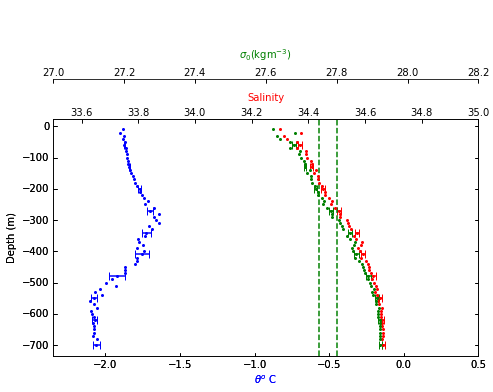

In [210]:
mask_months = sel_months(dfmg, [3,4,5])
Weddell = (box1 | box2 | box3 | box4)
print(len(dfmg.loc[(Weddell & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Weddell & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.8, 27.75], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Weddell_source_MAM.png', 
                    use_sample_sd=True, use_full_sd=False, errorevery=7)

7548


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


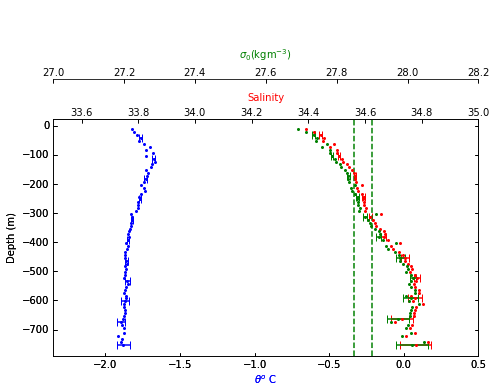

In [212]:
mask_months = sel_months(dfmg, [3,4,5])

print(len(dfmg.loc[(Ross & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Ross & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.9, 27.85], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Ross_source_MAM.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=7)

2452


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


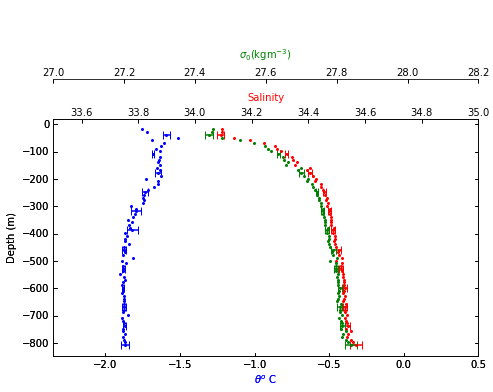

In [213]:
mask_months = sel_months(dfmg, [3,4,5])
print(len(dfmg.loc[(Prydz & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Prydz & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[0, 0], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Prydz_source_MAM.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=7)

538


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


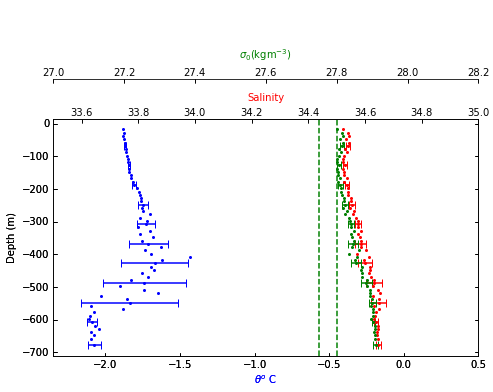

In [214]:
mask_months = sel_months(dfmg, [6,7,8])
Weddell = (box1 | box2 | box3 | box4)
print(len(dfmg.loc[(Weddell & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Weddell & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.8, 27.75], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Weddell_source_JJA.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=6)

3770


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


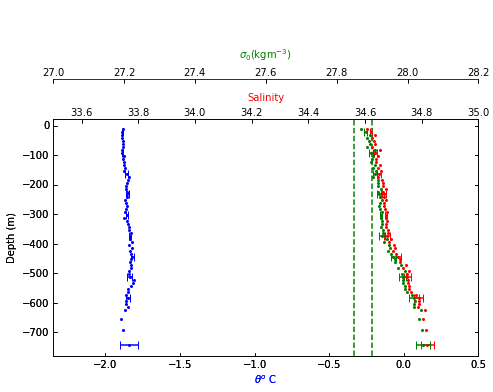

In [215]:
mask_months = sel_months(dfmg, [6,7,8])
print(len(dfmg.loc[(Ross & WSO_source & mask_months ), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Ross & WSO_source & mask_months ) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.9, 27.85], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Ross_source_JJA.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=7)

655


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


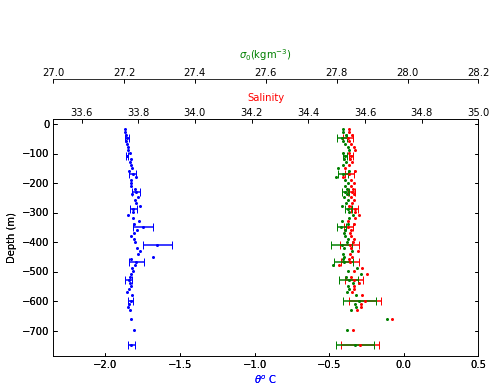

In [217]:
mask_months = sel_months(dfmg, [6,7,8])
print(len(dfmg.loc[(Prydz & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Prydz & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[0, 0], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Prydz_source_JJA.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=6)

208


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


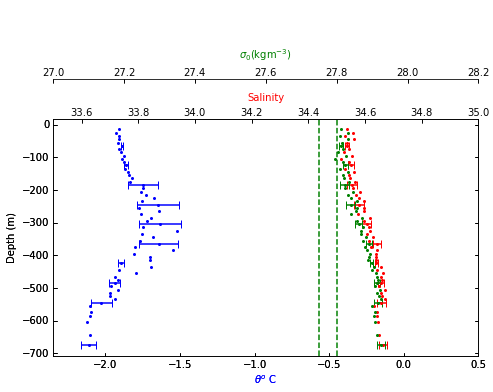

In [220]:
mask_months = sel_months(dfmg, [9,10,11])
print(len(dfmg.loc[(Weddell & WSO_source & mask_months ), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, ( Weddell & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.8, 27.75], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Weddell_source_SON.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=6)

1454


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


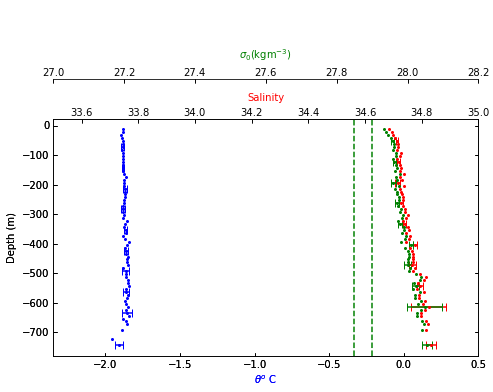

In [219]:
mask_months = sel_months(dfmg, [9,10,11])
print(len(dfmg.loc[(Ross & WSO_source & mask_months), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Ross & WSO_source & mask_months) )
find_depth_averages_v2(dfmg[mask], sigvline=[27.9, 27.85], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Ross_source_SON.png', 
                    use_sample_sd=True, use_full_sd=False, errorevery=7, maskerror=False)

289


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


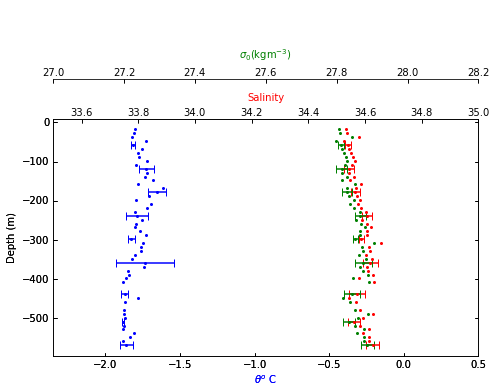

In [221]:
mask_months = sel_months(dfmg, [9,10,11])
print(len(dfmg.loc[(Prydz & WSO_source & mask_months & lt60), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (Prydz & WSO_source & mask_months & lt60) )
find_depth_averages_v2(dfmg[mask], sigvline=[0, 0], tmin=-2.35, tmax=0.5, salmin=33.5,
                    salmax=35., sigmin=27., sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Prydz_source_SON.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=6)

In [565]:
from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA

def plot_profile(df,  distances, rows=1, cols=1, wd=10, ht=6, profiles=[1], sigmin=27, sigmax=28, 
                 tmin=-2, tmax=-0.5, salmin=34, salmax=35, y=1.45, title=' ', sigvline=[0,0], save=False, 
                 savename="Untitled.png"):
    fig = plt.figure(figsize=(wd,ht))
    counter=1
    for i in range(len(profiles)):
        profs = df['PROFILE_NUMBER'] == profiles[i]
        stind = np.where(profs == True)[0][0]
        juld = df.iloc[stind, 0]
        
        axT = host_subplot(rows,cols,counter, axes_class=AA.Axes)
        counter+=1
        axS = axT.twiny()
        axSig = axT.twiny()
        axDist = axT.twinx()
        offset = 40
        new_fixed_axis = axSig.get_grid_helper().new_fixed_axis
        axSig.axis["top"] = new_fixed_axis(loc="top",
                                    axes=axSig,
                                    offset=(0,offset))
        axSig.axis["top"].toggle(all=True)
        
        
        sal = df.loc[profs, 'PSAL_ADJUSTED'].as_matrix()
        temp = df.loc[profs, 'CTEMP'].as_matrix()
        sigma0 = df.loc[profs, 'POT_DENSITY'].as_matrix()
        depth = df.loc[profs, 'DEPTH'].as_matrix()
        
        axT.plot(temp, depth, marker='o', color='b')
        axT.set_xlabel("Pot. Temp. deg C", color='b')
        axT.set_xlim(tmin, tmax)
        
        axDist.bar(tmax,distances[i], width=0.2, color='0.25')
        axDist.set_ylim(0,700)
        if(int((counter-1)%cols) == 0 ):
            axDist.set_ylabel("Dist. to grounding line (km)")
        if(int((counter-1)%cols) == 1 ):
                axT.set_ylabel('Depth (m)')
        axS.plot(sal, depth, marker='o', color='r')
        axS.set_xlim(salmin, salmax)
        axS.set_xlabel("Salinity", color='r')
        
        axSig.plot(sigma0, depth, marker='o', color='g')
        axSig.set_xlabel('$\sigma_0$(kgm$^{-3}$)', color='g')
        axSig.set_xlim(sigmin, sigmax)
        axSig.axis["top"].label.set_color('g')
        axSig.locator_params(axis='x',nticks=4)
        axSig.axvline(x = sigvline[0], color='g')
        axSig.axvline(x = sigvline[1], color='g')
        
        lon = df.iloc[stind, 2]
        lat = df.iloc[stind, 1]
        plt.title("Profile No = "+str(profiles[i])+
                  ", Dt: "+str(juld.month)+"/"+str(juld.year)+"\n"+"lon/lat:"+str(lon)+"/"+str(lat), y=y)
        
    plt.suptitle(title, y=1.0055)
    plt.tight_layout();    
    if(save==True):
        plt.savefig(savename, dpi=150)
    plt.show();

In [24]:
dfmg.columns

Index(['JULD', 'LATITUDE', 'LONGITUDE', 'PLATFORM_NUMBER', 'POSITION_QC',
       'PRES_ADJUSTED', 'PRES_ADJUSTED_QC', 'PROFILE_NUMBER', 'PSAL_ADJUSTED',
       'PSAL_ADJUSTED_QC', 'TEMP_ADJUSTED', 'TEMP_ADJUSTED_QC', 'DEPTH',
       'DENSITY_INSITU', 'POT_DENSITY', 'CTEMP', 'DENSITY_GRADIENT',
       'ECHODEPTH', 'mab', 'deep_flag'],
      dtype='object')

In [63]:
def sel_months(df, months=[1]):
    mask = np.zeros(len(df), dtype=bool)
    for i in months:
        mask = mask | (df['JULD'].dt.month == i)
        
    return mask

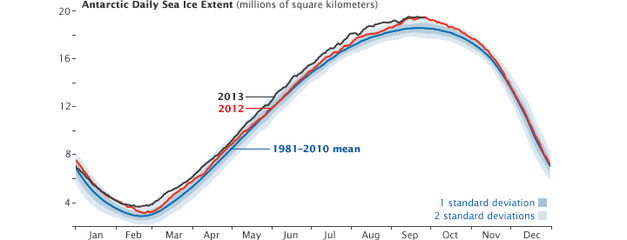

In [209]:
Image(filename='./Images/Seaice_extent_2013_chart.jpg')

In [65]:
#gt600 = dfmg['DEPTH'] < -600
lt60 = abs(dfmg['mab']) < 60
lowIceMonths = [12,1,2,3,4,5]
highIceMonths = [6,7,8,9,10,11]

mask_low = sel_months(dfmg, lowIceMonths)
mask_high = sel_months(dfmg, highIceMonths)
#gt600profs = dfmg.loc[box2 & WSO_source & gt600, 'PROFILE_NUMBER'].unique()

## South Western Weddell Sea, Low Sea-Ice Months (DJFMAM)

Vertical lines drawn at $\sigma_0=27.8$ (source water) and $\sigma_0=27.75$ (Product Water)

In [19]:
profslow = dfmg.loc[box2 & WSO_source & mask_low & sel_inversion & lt60, 'PROFILE_NUMBER'].unique()
len(profslow)

97

This is the average of all the plots:

In [318]:
points = dfmg.loc[box2 & WSO_source & mask_low & sel_inversion & lt60, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)
print(type(prof_distances))

<class 'numpy.ndarray'>


## Box2, Source Water, Low Sea-Ice (DJFMAM)

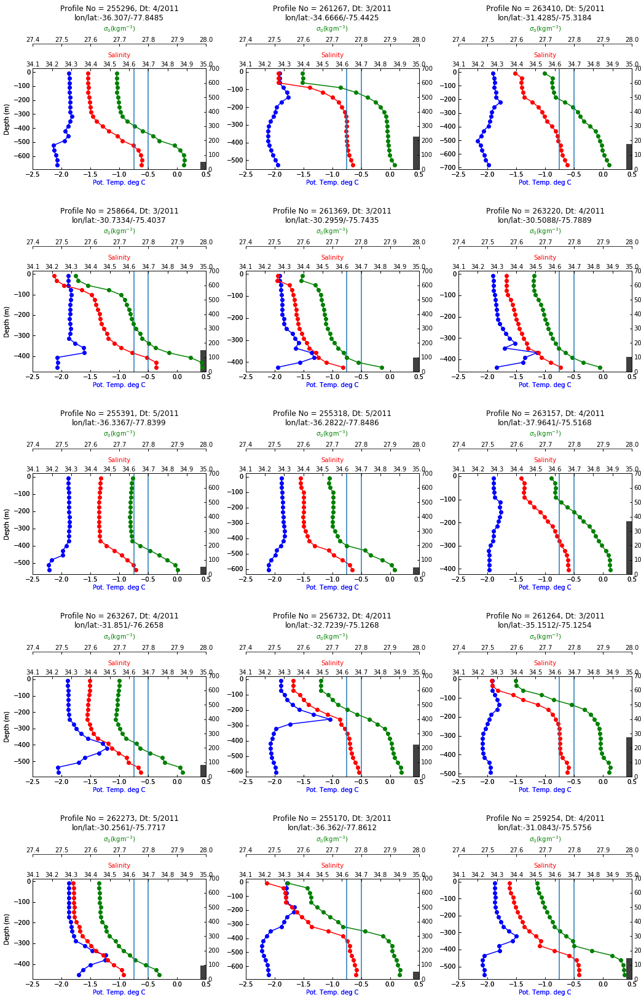

In [348]:
profslow = dfmg.loc[box2 & WSO_source & mask_low & lt60, 'PROFILE_NUMBER'].unique()
points = dfmg.loc[box2 & WSO_source & mask_low & lt60, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)
#SE Weddell Sea, Source Water, Low Sea Ice Months
rand_ind = np.random.randint(0, len(profslow), 15)
plot_profile(dfmg, prof_distances[rand_ind], profiles=profslow[rand_ind], rows=5, cols=3, ht=23, 
             tmin=-2.5, wd=15, salmin=34.1, sigmin=27.4,  
             title='', 
             sigvline=[27.8, 27.75], save=True, savename="./Images/prof_box2_source_lowIce.png")

## Box2 | Product Water | Low Sea-Ice months 

In [18]:
len(dfmg.loc[box2 & WSO_prod & mask_low & sel_inversion & lt60, 'PROFILE_NUMBER'].unique())

25

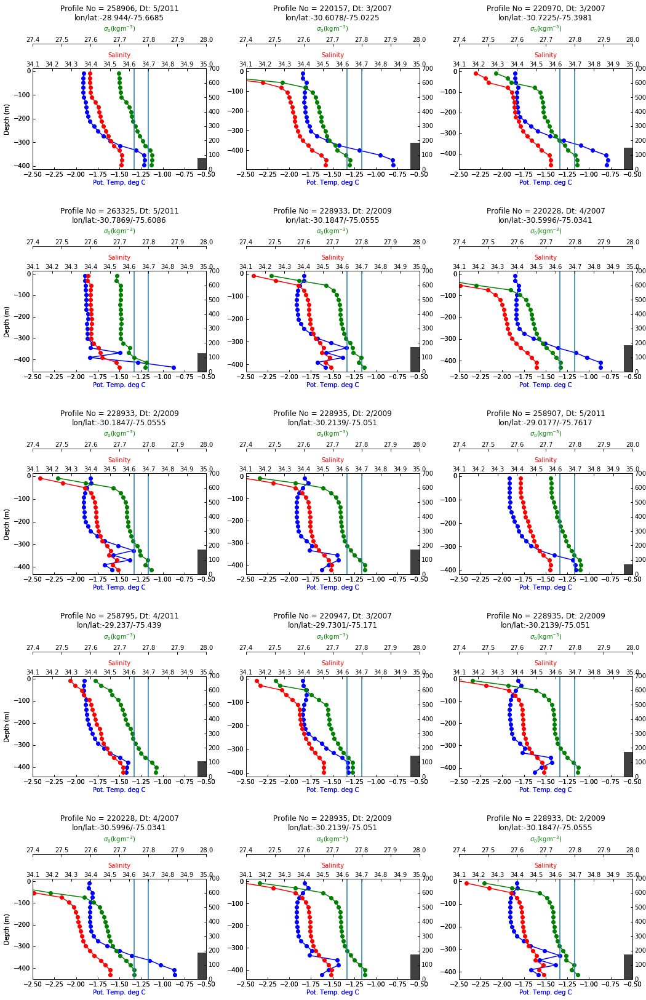

In [19]:
profslow = dfmg.loc[box2 & WSO_prod & mask_low & sel_inversion & lt60, 'PROFILE_NUMBER'].unique()
points = dfmg.loc[box2 & WSO_prod & mask_low & sel_inversion & lt60, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)
#South-Eastern Weddell Sea, Product Water Profiles, Low Ice Months (DJFMAM)
rand_ind = np.random.randint(0, len(profslow), 15)
plot_profile(dfmg, prof_distances[rand_ind], profiles=profslow[rand_ind], rows=5, cols=3, ht=23, 
             tmin=-2.5, wd=15, salmin=34.1, sigmin=27.4,  
             title='', 
             sigvline=[27.8, 27.75], save=True, savename='./Images/prof_box2_prod_lowIce.png' )

## Box5, Western Ross Sea, Low Sea-Ice Months (DJFMAM)

Vertical line drawn at at $\sigma_0=27.9$ (source water) and $\sigma_0=27.85$ (Product Water)

In [12]:
profslow = dfmg.loc[box5 & WSO_source & mask_low & sel_inversion & lt60, 'PROFILE_NUMBER'].unique()
len(profslow)

NameError: name 'mask_low' is not defined

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in true_divide
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:56: RuntimeWarning: invalid value encountered in true_divide


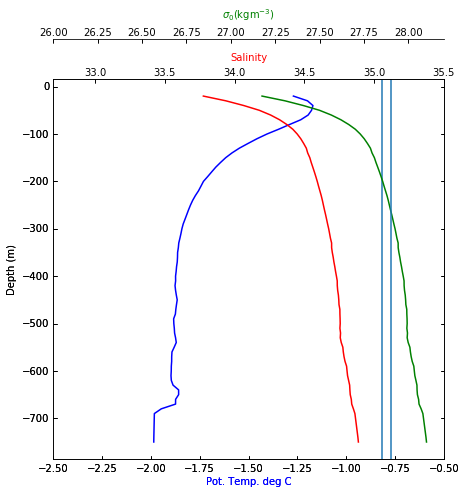

In [171]:
mask_months = sel_months(dfmg, [2])
mask = get_mask_from_prof_mask(dfmg, (box5 & WSO_source & mask_months & lt60) )
find_depth_averages(dfmg[mask], salmin=32.7, salmax=35.5, sigmin=26., sigmax=28.2, tmin=-2.5, tmax= -0.5,
             sigvline=[27.9, 27.85])

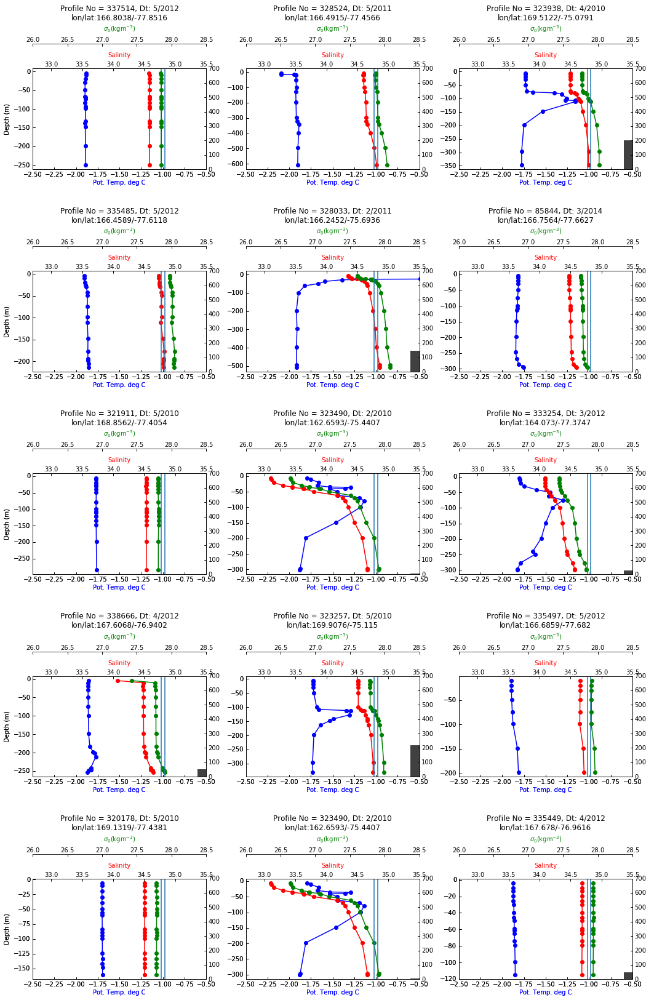

In [22]:
profslow = dfmg.loc[box5 & WSO_source & mask_low & sel_inversion & lt60, 'PROFILE_NUMBER'].unique()
points = dfmg.loc[box5 & WSO_source & mask_low & sel_inversion & lt60, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)
#Western Ross Sea, Low Ice Months (DJFMAM)
rand_ind = np.random.randint(0, len(profslow), 15)
plot_profile(dfmg, prof_distances[rand_ind], profiles=profslow[rand_ind], rows=5, cols=3, ht=23, 
             tmin=-2.5, wd=15, salmin=32.7, salmax=35.5, sigmin=26., sigmax=28.5, 
             title='', sigvline=[27.9, 27.85], save=True, savename="./Images/prof_box5_source_lowIce.png")

## Ross Sea | Product Water | Low Sea Ice

In [20]:
len(dfmg.loc[box5 & WSO_prod & mask_low & sel_inversion & lt60, 'PROFILE_NUMBER'].unique())

99

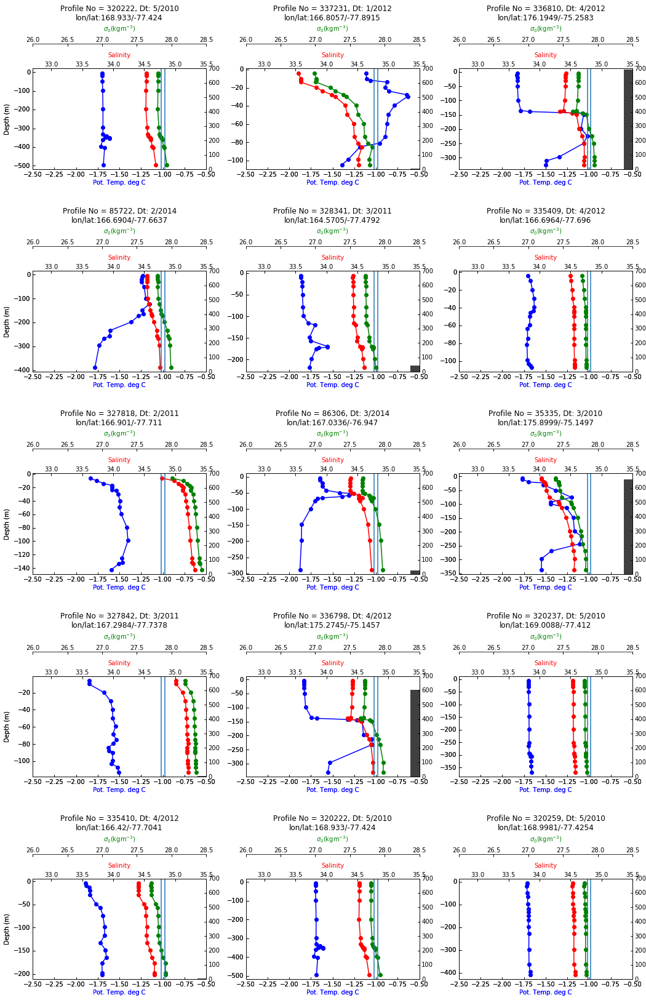

In [23]:
profslow = dfmg.loc[box5 & WSO_prod & mask_low & sel_inversion & lt60, 'PROFILE_NUMBER'].unique()
points = dfmg.loc[box5 & WSO_prod & mask_low & sel_inversion & lt60, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)
#Western Ross Sea, Low Ice Months (DJFMAM)
rand_ind = np.random.randint(0, len(profslow), 15)
plot_profile(dfmg, prof_distances[rand_ind], profiles=profslow[rand_ind], rows=5, cols=3, ht=23, 
             tmin=-2.5, wd=15, salmin=32.7, salmax=35.5, sigmin=26., sigmax=28.5, 
             title='', sigvline=[27.9, 27.85], save=True, savename="./Images/prof_box5_prod_lowIce.png")

## South Eastern Weddell Sea | Source waters | High Sea Ice Months (JJASON)

In [39]:
lt60profsGrowth = dfmg.loc[box2 & WSO_source & mask_high & lt60 & sel_inversion, 'PROFILE_NUMBER'].unique()
len(lt60profsGrowth)

36

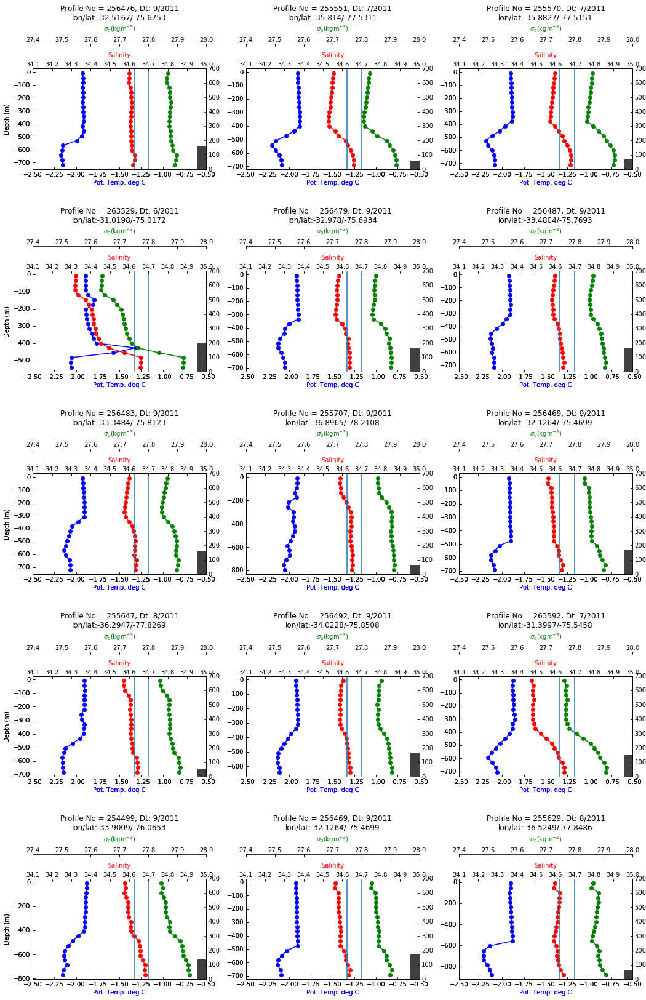

In [30]:
lt60profsGrowth = dfmg.loc[box2 & WSO_source & lt60 & mask_high & sel_inversion, 'PROFILE_NUMBER'].unique()
points = dfmg.loc[box2 & WSO_source & lt60 & mask_high & sel_inversion, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)

rand_ind = np.random.randint(0, len(lt60profsGrowth), 15)
plot_profile(dfmg, prof_distances[rand_ind], profiles=lt60profsGrowth[rand_ind], rows=5, cols=3, ht=23, 
             tmin=-2.5, wd=15, salmin=34.1, sigmin=27.4,
             title='', sigvline=[27.75, 27.8], save=True, savename="./Images/prof_box2_source_highIce.png")

## SE Weddell Sea | product waters | High sea-ice

In [27]:
len(dfmg.loc[box2 & WSO_prod & lt60 & mask_high, 'PROFILE_NUMBER'].unique())

64

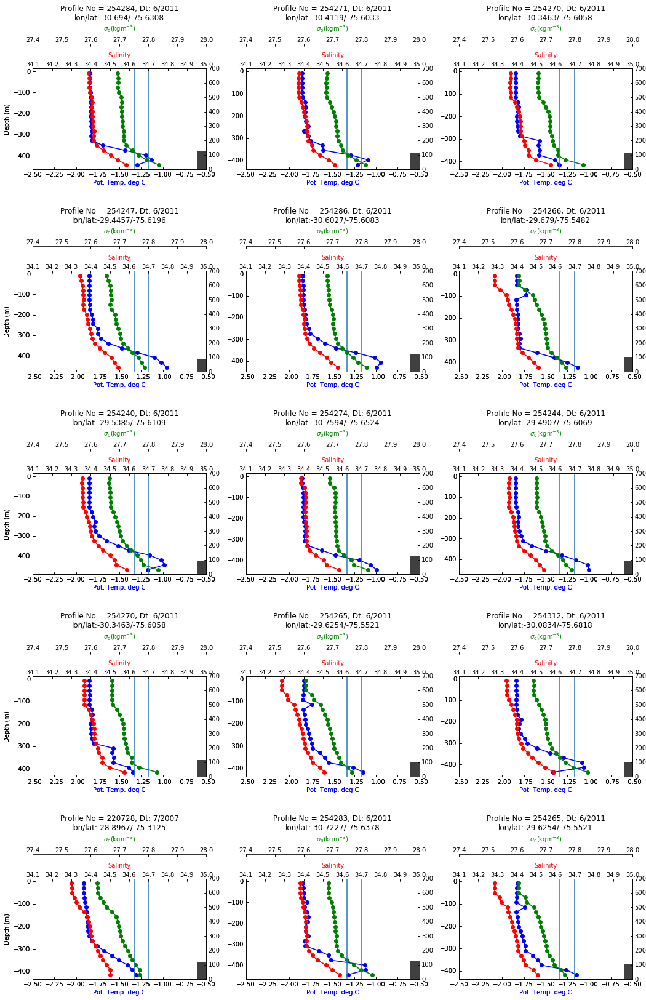

In [29]:
lt60profsGrowth = dfmg.loc[box2 & WSO_prod & lt60 & mask_high, 'PROFILE_NUMBER'].unique()
points = dfmg.loc[box2 & WSO_prod & lt60 & mask_high, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)

rand_ind = np.random.randint(0, len(lt60profsGrowth), 15)
plot_profile(dfmg, prof_distances[rand_ind], profiles=lt60profsGrowth[rand_ind], rows=5, cols=3, ht=23, 
             tmin=-2.5, wd=15, salmin=34.1, sigmin=27.4,
             title='', sigvline=[27.75, 27.8], save=True, savename="./Images/prof_box2_prod_highIce.png")

## Western Ross Sea, Source | High Sea-Ice Months (JJASON)

In [60]:
lt60profsGrowth = dfmg.loc[box5 & WSO_source & lt60 & mask_high & sel_inversion, 'PROFILE_NUMBER'].unique()
len(lt60profsGrowth)

926

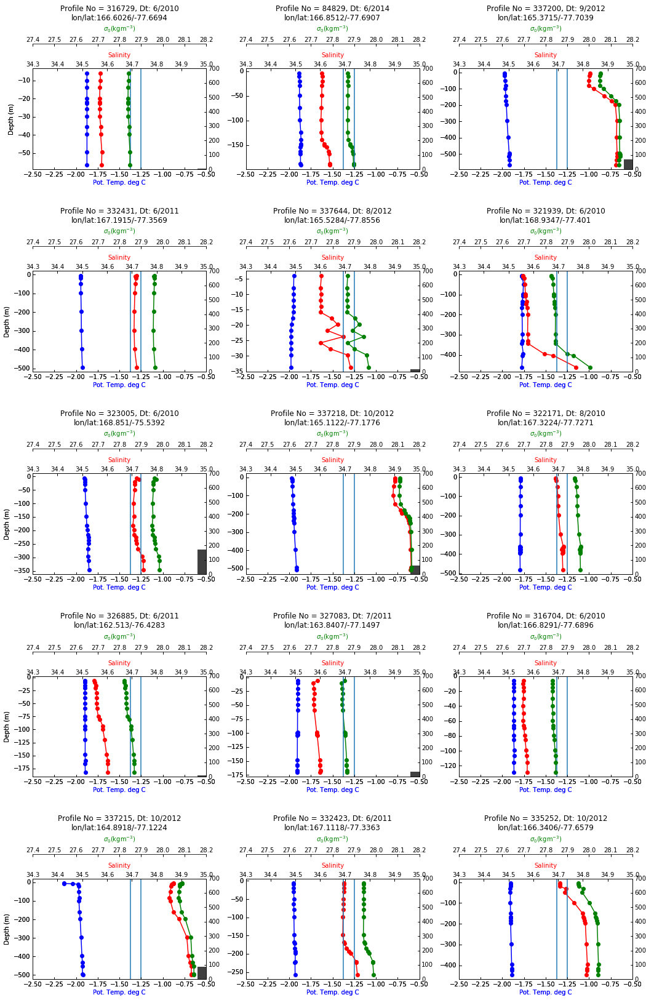

In [31]:
lt60profsGrowth = dfmg.loc[box5 & WSO_source & lt60 & mask_high & sel_inversion, 'PROFILE_NUMBER'].unique()
points = dfmg.loc[box5 & WSO_source & lt60 & mask_high & sel_inversion, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)

rand_ind = np.random.randint(0, len(lt60profsGrowth), 15)
plot_profile(dfmg, prof_distances[rand_ind], profiles=lt60profsGrowth[rand_ind], rows=5, cols=3, ht=23, 
             tmin=-2.5, wd=15, salmin=34.3, sigmin=27.4, sigmax=28.2,
             title='', sigvline=[27.85, 27.9], save=True, savename="./Images/prof_box5_source_highIce.png")

In [33]:
len(dfmg.loc[box5 & WSO_prod & lt60 & mask_high & sel_inversion, 'PROFILE_NUMBER'].unique())

25

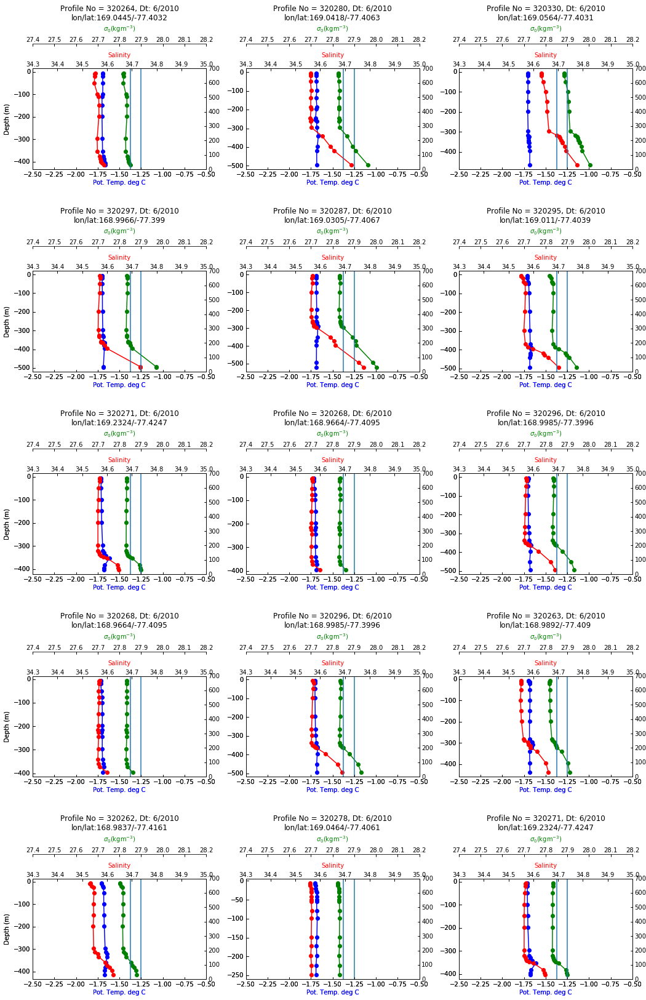

In [32]:
lt60profsGrowth = dfmg.loc[box5 & WSO_prod & lt60 & mask_high & sel_inversion, 'PROFILE_NUMBER'].unique()
points = dfmg.loc[box5 & WSO_prod & lt60 & mask_high & sel_inversion, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)

rand_ind = np.random.randint(0, len(lt60profsGrowth), 15)
plot_profile(dfmg, prof_distances[rand_ind], profiles=lt60profsGrowth[rand_ind], rows=5, cols=3, ht=23, 
             tmin=-2.5, wd=15, salmin=34.3, sigmin=27.4, sigmax=28.2,
             title='', sigvline=[27.85, 27.9], save=True, savename="./Images/prof_box5_prod_highIce.png")

## Prydz Bay | Source | High

In [35]:
len(dfmg.loc[box10 & WSO_source & lt60 & mask_high & sel_inversion, 'PROFILE_NUMBER'].unique())

265

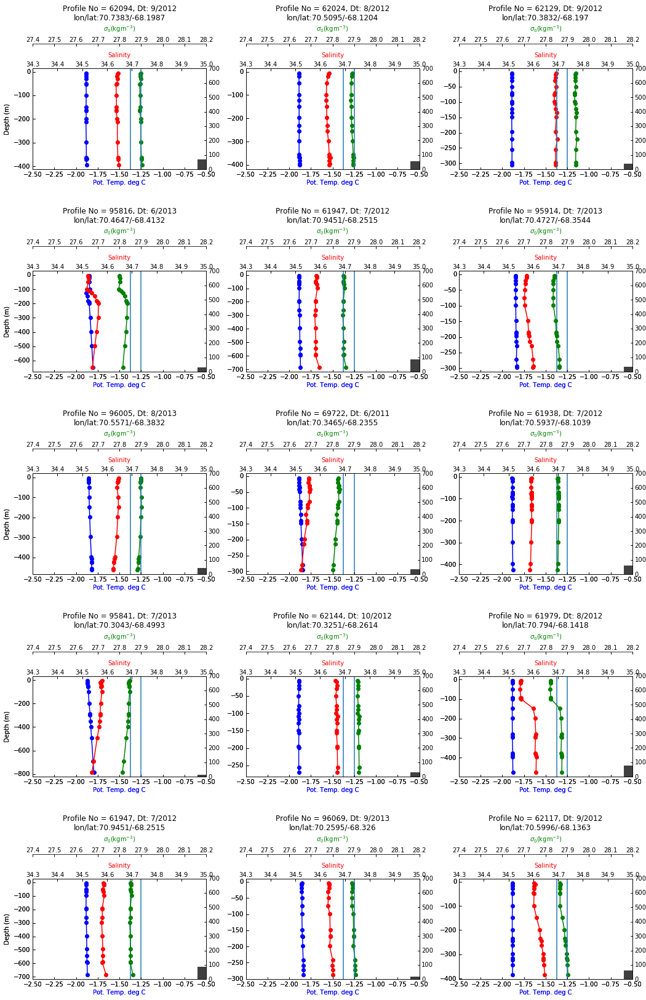

In [34]:
lt60profsGrowth = dfmg.loc[box10 & WSO_source & lt60 & mask_high & sel_inversion, 'PROFILE_NUMBER'].unique()
points = dfmg.loc[box10 & WSO_source & lt60 & mask_high & sel_inversion, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)

rand_ind = np.random.randint(0, len(lt60profsGrowth), 15)
plot_profile(dfmg, prof_distances[rand_ind], profiles=lt60profsGrowth[rand_ind], rows=5, cols=3, ht=23, 
             tmin=-2.5, wd=15, salmin=34.3, sigmin=27.4, sigmax=28.2,
             title='', sigvline=[27.85, 27.9], save=True, savename="./Images/prof_box10_source_highIce.png")

In [37]:
len(dfmg.loc[box10 & WSO_source & lt60 & mask_low & sel_inversion, 'PROFILE_NUMBER'].unique())

135

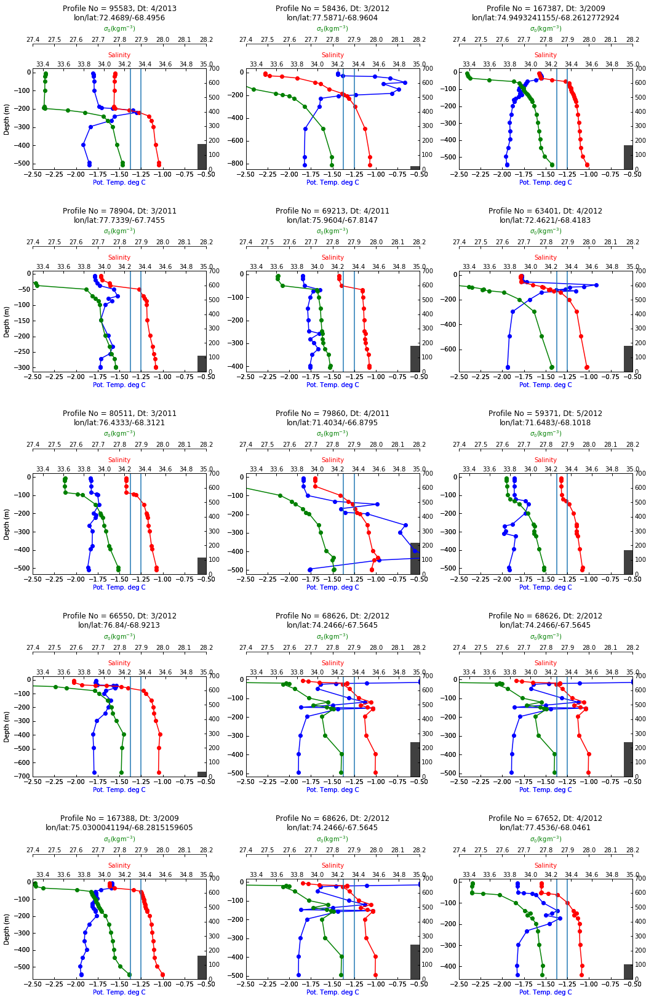

In [38]:
lt60profsGrowth = dfmg.loc[box10 & WSO_source & lt60 & mask_low & sel_inversion, 'PROFILE_NUMBER'].unique()
points = dfmg.loc[box10 & WSO_source & lt60 & mask_low & sel_inversion, 'LATITUDE':'LONGITUDE'].drop_duplicates(
    subset=['LONGITUDE', 'LATITUDE']).values
prof_distances = find_distance_to_groundingLine(points[:, ::-1], grndLine)

rand_ind = np.random.randint(0, len(lt60profsGrowth), 15)
plot_profile(dfmg, prof_distances[rand_ind], profiles=lt60profsGrowth[rand_ind], rows=5, cols=3, ht=23, 
             tmin=-2.5, wd=15, salmin=33.3, sigmin=27.4, sigmax=28.2,
             title='', sigvline=[27.85, 27.9], save=True, savename="./Images/prof_box10_source_lowIce.png")

## Points with low surface salinity

In [46]:
dfmg.loc[lowsal & lt60, 'DEPTH'].describe()

count    5109.000000
mean      -20.808017
std        19.354798
min      -494.252601
25%       -28.694431
50%       -15.832881
75%        -8.910158
max        -2.367265
Name: DEPTH, dtype: float64

In [114]:
def get_loc(profiles= np.array([256483, 246487, 256492])):
    loc = np.zeros((len(profiles), 2))
    j=0
    for i in profiles:
        mask = dfmg["PROFILE_NUMBER"] == i
        loc[j, 1] = dfmg.loc[mask, "LATITUDE"].as_matrix()[0]
        loc[j, 0] = dfmg.loc[mask, "LONGITUDE"].as_matrix()[0]
        j+=1
    return loc

#profiles= np.array([256483, 246487, 256492, 333122, 333121])
#locs= get_loc(profiles=profiles) #np.array([[-33.3484, -75.8123]]) 
#boxes=['X'] *len(locs)
#plot_boxes.plot_boxes(positions=locs, boxes=boxes)

In [411]:
lowSurfSal = (dfmg['PSAL_ADJUSTED'] < 33.5) & (dfmg['DEPTH'] > -100)
high_mid_depth_temp = (dfmg['CTEMP'] > -0.5) & (dfmg['DEPTH'] < -100)
gline_le_50km = dfmg['DIST_GLINE'] <= 50
gline_le_100km = dfmg['DIST_GLINE'] <= 100
gline_le_25km = dfmg['DIST_GLINE'] <= 25

4016


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1623: MatplotlibDeprecationWarning: The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.
  fill_color = ax.get_axis_bgcolor()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


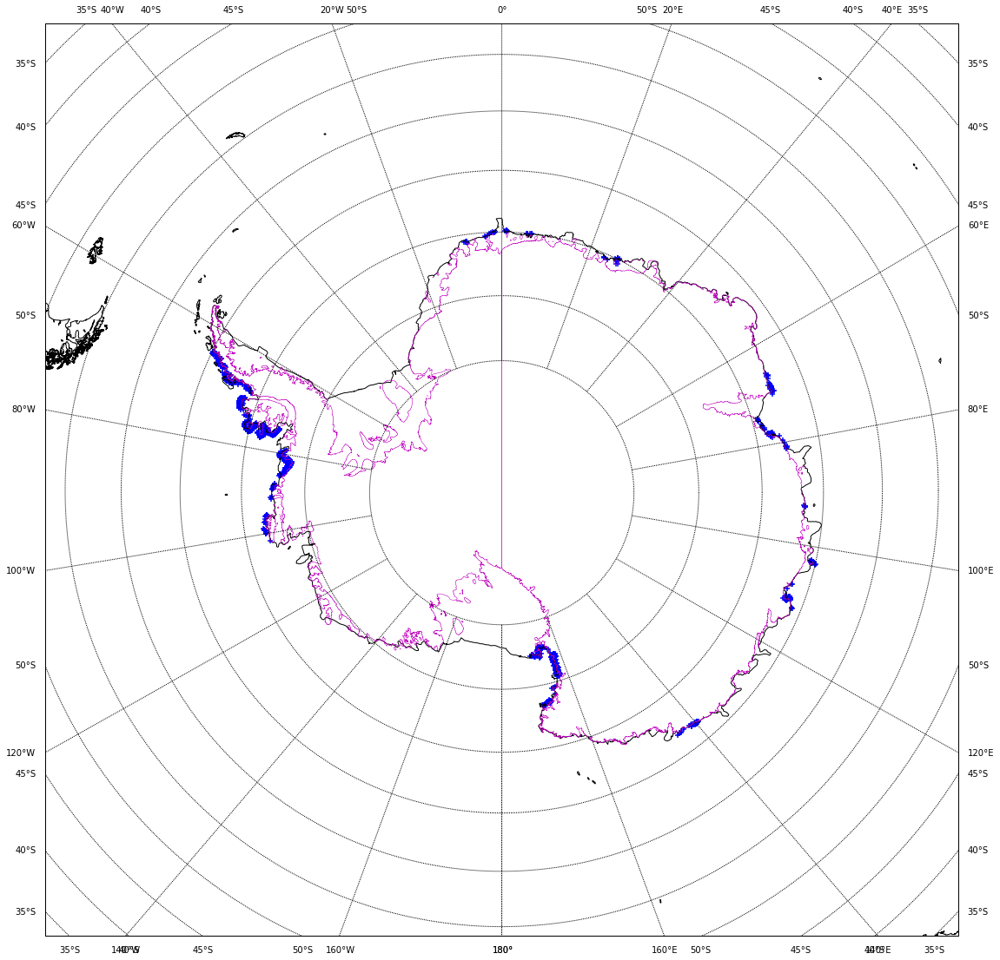

In [412]:
profs = dfmg.loc[lowSurfSal & gline_le_25km, 'PROFILE_NUMBER'].unique()
print(len(profs))
locs= get_loc(profiles=profs) #np.array([[-33.3484, -75.8123]]) 
pltStn.plot_station_locations(positions=locs[:, ::-1])

5688


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1623: MatplotlibDeprecationWarning: The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.
  fill_color = ax.get_axis_bgcolor()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


[ True False False  True  True  True  True False False  True False False
  True  True  True  True False False False]


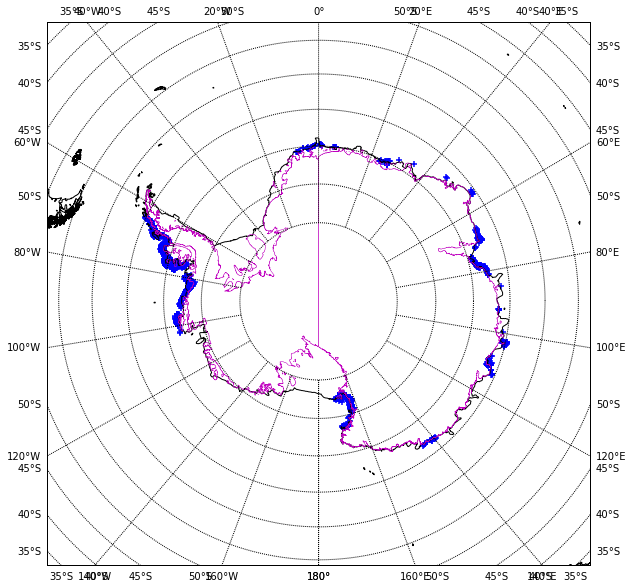

In [587]:
%matplotlib inline
import importlib
importlib.reload(pltStn)
profs = dfmg.loc[lowSurfSal & gline_le_50km, 'PROFILE_NUMBER'].unique()
print(len(profs))
locs= get_loc(profiles=profs) #np.array([[-33.3484, -75.8123]]) 
importlib.reload(pltStn)
pltStn.plot_station_locations(positions=locs[:, ::-1], save=True, savename="./Images/LowSurfSalProfs_le_50km.png", 
                             wd=10, ht=10)

7603


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:1623: MatplotlibDeprecationWarning: The get_axis_bgcolor function was deprecated in version 2.0. Use get_facecolor instead.
  fill_color = ax.get_axis_bgcolor()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


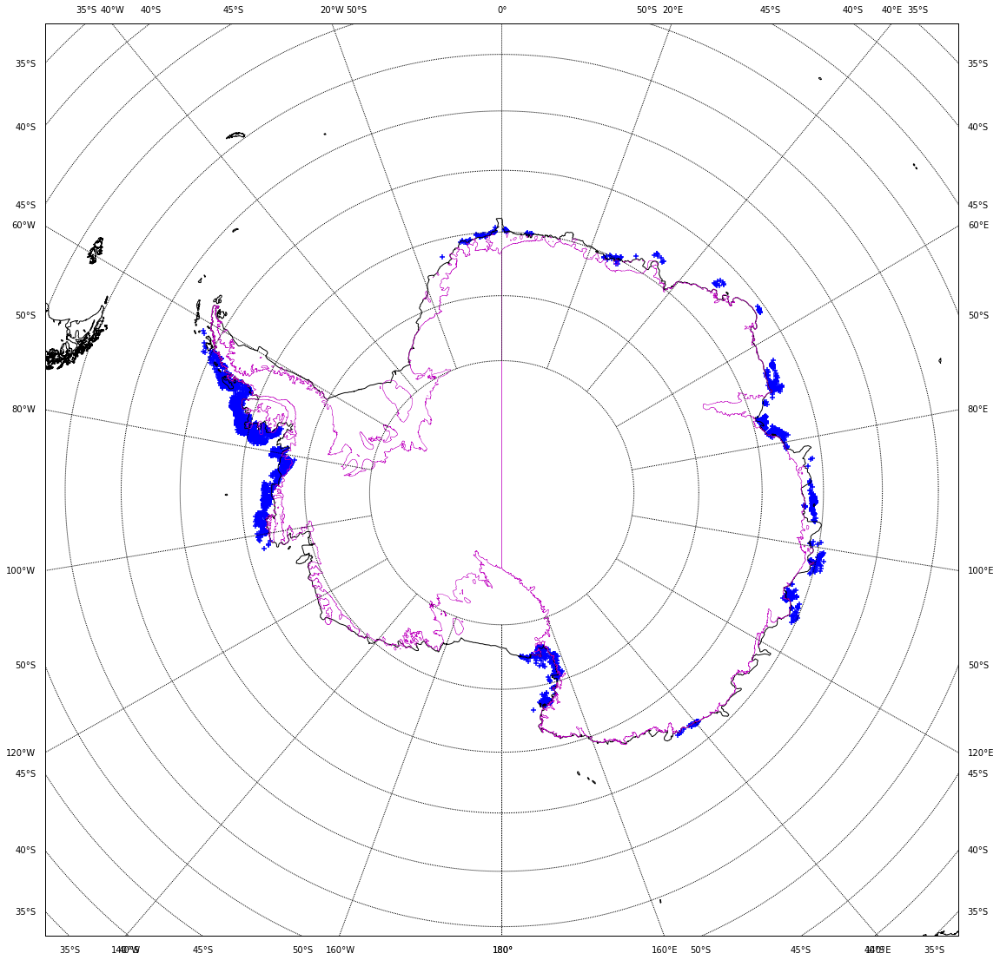

In [410]:
profs = dfmg.loc[lowSurfSal & gline_le_100km, 'PROFILE_NUMBER'].unique()
print(len(profs))
locs= get_loc(profiles=profs) #np.array([[-33.3484, -75.8123]]) 

pltStn.plot_station_locations(positions=locs[:, ::-1])

In [451]:
def print_monthly_counts(df, mask, label, wd=0.2, savename="Untitled.png"):
    monthly_count = np.zeros((len(mask), 12))
    exwd = 0
    months = ['J','F','M','A','M','J','J','A','S','O','N','D']
    fig, ax = plt.subplots(figsize=(7,4))
    for j in range(len(mask)):
        for i in range(1,13):
            maskMonth = df.loc[(mask[j]), 'JULD'].dt.month == i
            monthly_count[j][i-1] = len(dfmg.loc[(maskMonth & mask[j]), 'PROFILE_NUMBER'].unique())
            
        ax.bar(np.arange(1,13,1)+exwd, monthly_count[j], wd, label=label[j])
        exwd += wd
    ax.set_xticks(np.arange(12)+wd)
    ax.set_xticklabels(months)
    ax.legend()
    plt.savefig(savename)
    plt.show()

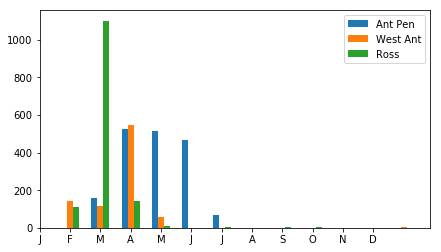

In [452]:
print_monthly_counts(dfmg, mask = [(lowSurfSal & antPeninsula & gline_le_25km), 
                                   (lowSurfSal & westAnt & gline_le_100km), (lowSurfSal & Ross & gline_le_25km)],
                    label=['Ant Pen', 'West Ant', 'Ross'], savename="./Images/Count_lowSurfSal.png")

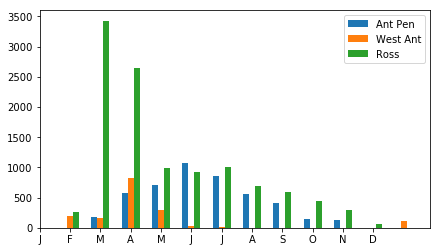

In [453]:
print_monthly_counts(dfmg, mask = [(antPeninsula & gline_le_25km), 
                                   (westAnt & gline_le_100km), (Ross & gline_le_25km)],
                    label=['Ant Pen', 'West Ant', 'Ross'], savename="./Images/Count_WestAntRoss.png")

1733


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


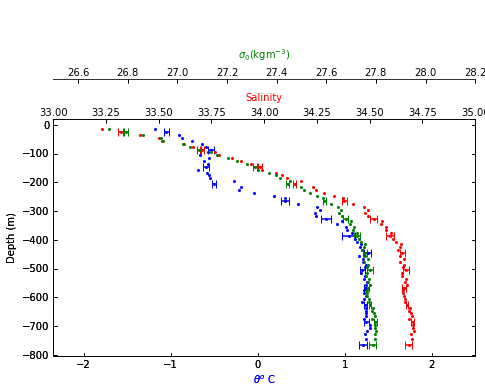

In [435]:
%matplotlib inline
mask_months = sel_months(dfmg, [12,1,2,3,4,5])
print(len(dfmg.loc[(lowSurfSal & antPeninsula & gline_le_25km), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & antPeninsula & gline_le_25km) )
find_depth_averages_v2(dfmg[mask], sigvline=[0, 0], tmin=-2.35, tmax=2.5, salmin=33.,
                    salmax=35., sigmin=26.5, sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_peninsula_lowSurfSal.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=0, errorevery=6)

576


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


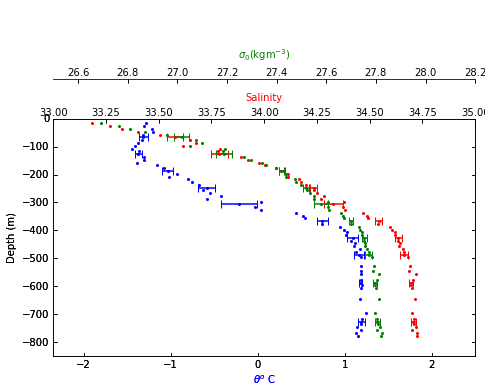

In [439]:
%matplotlib inline
westAnt = (dfmg['LONGITUDE'] > -100) & (dfmg['LONGITUDE'] < -80)
mask_months = sel_months(dfmg, [12,1,2,3,4,5])
print(len(dfmg.loc[(lowSurfSal & westAnt & gline_le_50km), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & westAnt & gline_le_50km) )
find_depth_averages_v2(dfmg[mask], sigvline=[0, 0], tmin=-2.35, tmax=2.5, salmin=33.,
                    salmax=35., sigmin=26.5, sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_westAnt_meltwater_lowSurfSal_gline_le_50km.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=-850, errorevery=6)

In [547]:
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & Ross & gline_le_25km) )
dfmg.loc[mask, 'PRES_ADJUSTED'].max()

898.0

1377


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in less


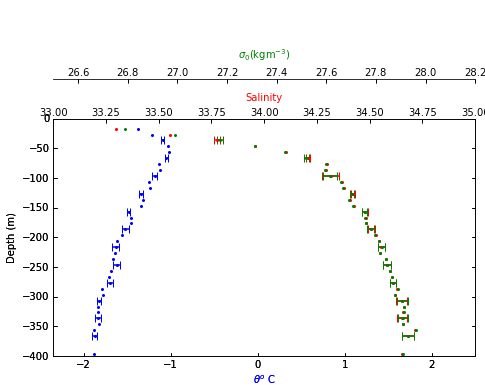

In [544]:
%matplotlib inline

mask_months = sel_months(dfmg, [12,1,2,3,4,5])
Ross = box5 | box7
print(len(dfmg.loc[(lowSurfSal & Ross & gline_le_25km), 'PROFILE_NUMBER'].unique()))
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & Ross & gline_le_25km) )
find_depth_averages_v2(dfmg[mask], sigvline=[0, 0], tmin=-2.35, tmax=2.5, salmin=33.,
                    salmax=35., sigmin=26.5, sigmax=28.2, save=True, 
                    savename='./Images/prof_avg_Ross_lowSurfSal.png', 
                    use_sample_sd=True, use_full_sd=False, cutoff_depth=-400, errorevery=3)

In [ ]:
dfmg['DIST_GLINE']

In [618]:
def plot_var_contours_with_distance(df, mask, var, dist=100, bins=5, wd=12, ht=5, varmin=33, varmax=35, nlevs=10,
                                    colorunit=' ', save=False, savename="Untitled.png", 
                                    zbin=10, xbin=10, zmin=0):
    zlowest = df.loc[mask, 'DEPTH'].min()
    depth_bins = np.arange(zlowest, 0+zbin, zbin)
    dist_bins = np.arange(0, dist+xbin, xbin)
    var_binned = np.zeros((len(dist_bins), len(depth_bins)))
    
    dist_binned_group = df.loc[mask].groupby(pd.cut(df.loc[mask].DIST_GLINE, dist_bins))
    var_mean = np.zeros((len(dist_bins), len(depth_bins)-1))
    var_count = np.zeros((len(dist_bins), len(depth_bins)-1))
    var_sd = np.zeros((len(dist_bins), len(depth_bins)-1))
    i = 0
    for groupList, xGroup in dist_binned_group:
        zGroup = xGroup.groupby(pd.cut(xGroup.DEPTH, depth_bins))
        var_mean[i] = zGroup[var].mean().values
        var_count[i] = zGroup[var].count().values
        var_sd[i] = zGroup[var].std().values
        i += 1
    
    fig, ax = plt.subplots(1,2, figsize=(wd, ht))
    #fig.subplots_adjust(hspace=1.3)
    X, Y = np.meshgrid(dist_bins[:], depth_bins[:-1])
    levels = np.linspace(varmin, varmax, nlevs)
    CF = ax[0].contourf(X.T[:-1, :], Y.T[:-1, :], var_mean[:-1, :], levels)
    ax[0].set_ylabel('Depth (m)')
    ax[0].set_xlabel('Distance from grounding line (km)')
    if(zmin != 0):
        ax[0].set_ylim(zmin, 0)
    else:
        ax[0].set_ylim(zlowest, 0)
    cbar1 = fig.colorbar(CF, ax=ax[0])
    cbar1.set_label(colorunit)
    
    
    conf_int = 1.96*var_sd/np.sqrt(var_count)
    conf_int[np.isnan(conf_int)] = 100000.0
    levels2 = np.linspace(0,1, 10)
    print(np.max(conf_int[~np.isnan(conf_int)]))
    CF2 = ax[1].contourf(X.T[:-1, :], Y.T[:-1, :], conf_int[:-1, :], levels2)
    ax[1].set_xlabel('Distance from grounding line (km)')
    if(zmin != 0):
        ax[1].set_ylim(zmin, 0)
    cbar2 = fig.colorbar(CF2, ax=ax[1])
    cbar2.set_label('Error in sample mean')
    if(save== True):
        plt.savefig(savename)
    plt.show()

In [650]:
mask_months = sel_months(dfmg, [2,3,4])
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & Ross & mask_months) )
print(len(dfmg.loc[mask, 'PROFILE_NUMBER'].unique()))

1480


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


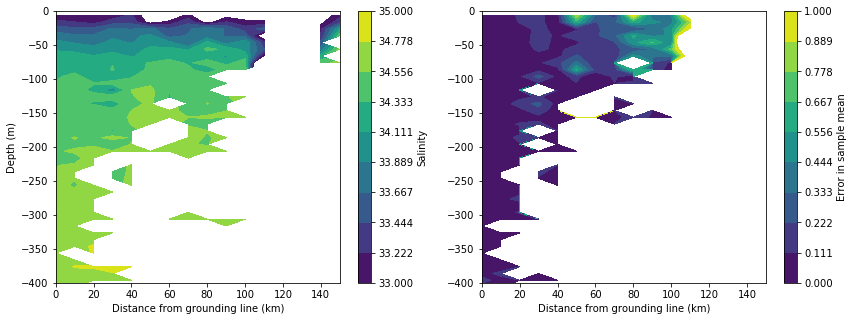

In [624]:
mask_months = sel_months(dfmg, [2,3,4])
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & Ross & mask_months) )
print(len(dfmg.loc[mask, 'PROFILE_NUMBER'].unique()))
plot_var_contours_with_distance(dfmg, mask=mask, var='PSAL_ADJUSTED', dist=160, 
                                colorunit='Salinity', save=True, 
                                savename='./Images/Dist_lowSurfSalinity_Ross_FMA.png', wd=14, ht=5, 
                                zmin=-400 )

In [649]:
mask = get_mask_from_prof_mask(dfmg, (Ross & mask_months) )
print(len(dfmg.loc[mask, 'PROFILE_NUMBER'].unique()))

11653


/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


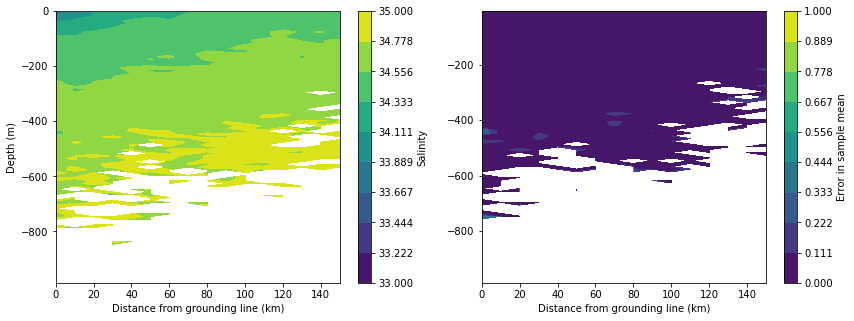

In [622]:
mask_months = sel_months(dfmg, [2,3,4])
mask = get_mask_from_prof_mask(dfmg, (Ross & mask_months) )
print(len(dfmg.loc[mask, 'PROFILE_NUMBER'].unique()))
plot_var_contours_with_distance(dfmg, mask=mask, var='PSAL_ADJUSTED', dist=160, 
                                colorunit='Salinity', save=True, 
                                savename='./Images/Dist_salinity_Ross_FMA.png', wd=14, ht=5, 
                                zmin=0 )

In [658]:
np.linspace(-2, 1.6, 10)

array([-2. , -1.6, -1.2, -0.8, -0.4,  0. ,  0.4,  0.8,  1.2,  1.6])

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


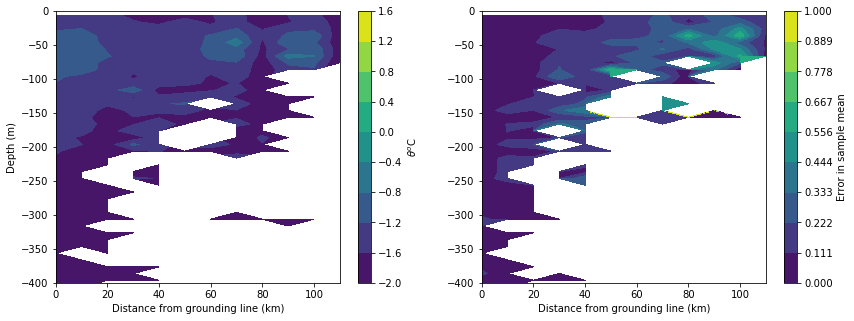

In [659]:
mask_months = sel_months(dfmg, [2,3,4])
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & Ross & mask_months) )
plot_var_contours_with_distance(dfmg, mask=mask, var='CTEMP', dist=120, 
                                colorunit='$\\theta^o$C', save=True, 
                                savename='./Images/Dist_lowSurfSalinity_CTEMP_Ross_FMA.png', wd=14, ht=5, 
                                zmin=-400, varmin=-2., varmax=1.6)

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


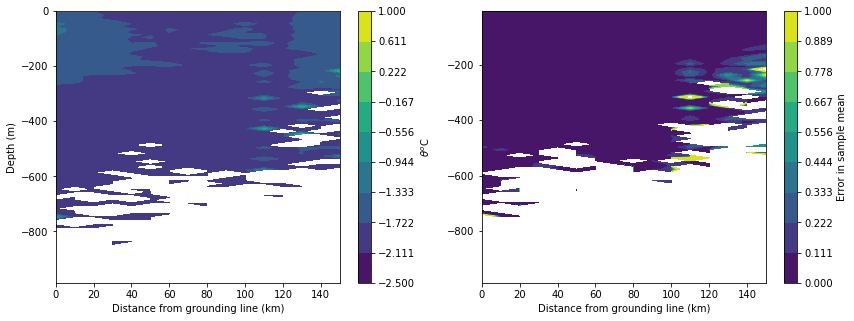

In [620]:
mask_months = sel_months(dfmg, [2,3,4])
mask = get_mask_from_prof_mask(dfmg, (Ross & mask_months) )
plot_var_contours_with_distance(dfmg, mask=mask, var='CTEMP', dist=160, 
                                colorunit='$\\theta^o$C', save=True, 
                                savename='./Images/Dist_CTEMP_Ross_FMA.png', wd=14, ht=5, 
                                zmin=0, varmin=-2.5, varmax=1 )

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


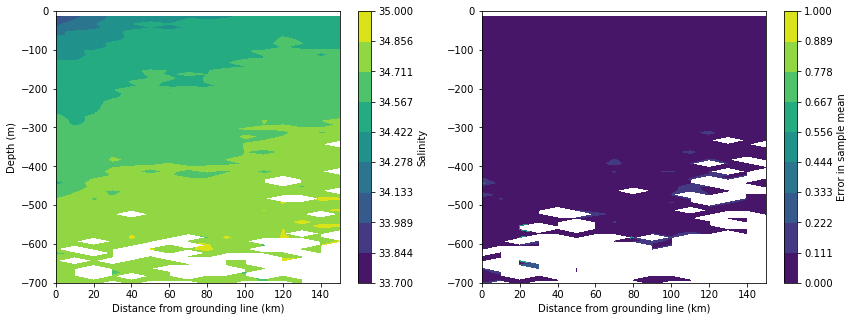

In [632]:
%matplotlib inline
mask_months = sel_months(dfmg, [12,1,2,3,4,5])
mask = get_mask_from_prof_mask(dfmg, (Ross & mask_months) )
plot_var_contours_with_distance(dfmg, mask=mask, var='PSAL_ADJUSTED', dist=160, 
                                colorunit='Salinity', save=True, 
                                savename='./Images/Dist_salinity_Ross_DJFMAM.png', wd=14, ht=5, 
                                zmin=-700, varmin=33.7 )

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


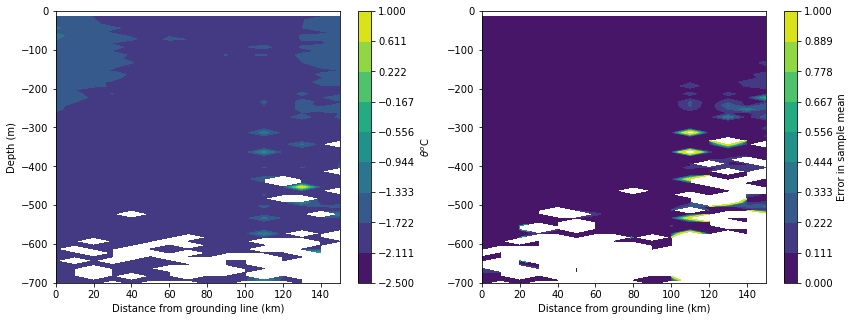

In [633]:
mask_months = sel_months(dfmg, [12,1,2,3,4,5])
mask = get_mask_from_prof_mask(dfmg, (Ross & mask_months) )
plot_var_contours_with_distance(dfmg, mask=mask, var='CTEMP', dist=160, 
                                colorunit='$\\theta^o$C', save=True, 
                                savename='./Images/Dist_CTEMP_Ross_DJFMAM.png', wd=14, ht=5, 
                                zmin=-700, varmin=-2.5, varmax=1. )

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


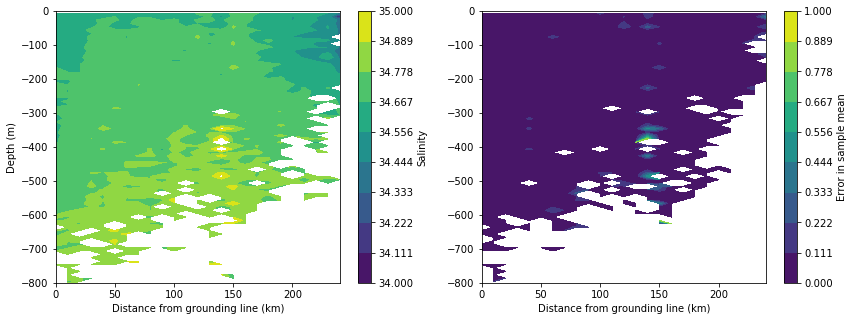

In [638]:
mask_months = sel_months(dfmg, [6,7,8,9,10,11])
mask = get_mask_from_prof_mask(dfmg, (Ross & mask_months) )
plot_var_contours_with_distance(dfmg, mask=mask, var='PSAL_ADJUSTED', dist=250, 
                                colorunit='Salinity', save=True, 
                                savename='./Images/Dist_salinity_Ross_JJASON.png', wd=14, ht=5, 
                                zmin=-800, varmin=34 )

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


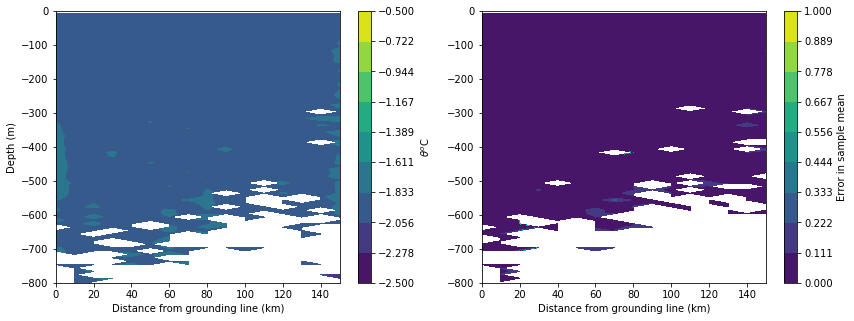

In [640]:
mask_months = sel_months(dfmg, [6,7,8,9,10,11])
mask = get_mask_from_prof_mask(dfmg, (Ross & mask_months) )
plot_var_contours_with_distance(dfmg, mask=mask, var='CTEMP', dist=160, 
                                colorunit='$\\theta^o$C', save=True, 
                                savename='./Images/Dist_CTEMP_Ross_JJASON.png', wd=14, ht=5, 
                                zmin=-800, varmin=-2.5, varmax=-0.5 )

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


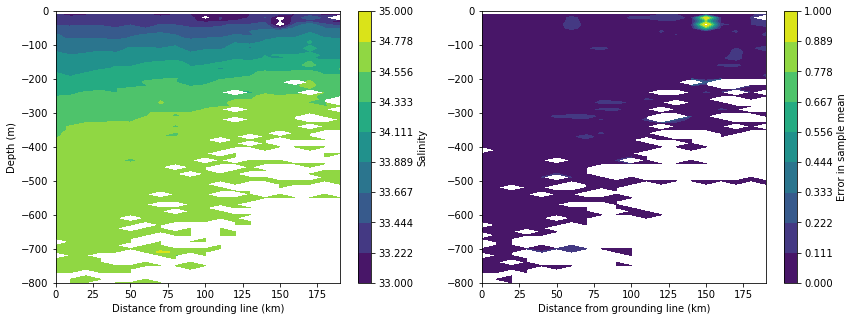

In [643]:
mask_months = sel_months(dfmg, [3,4,5])
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & antPeninsula & mask_months ) )
plot_var_contours_with_distance(dfmg, mask=mask, var='PSAL_ADJUSTED', dist=200, 
                                colorunit='Salinity', save=True, 
                                savename='./Images/Dist_LowSurfSalinity_antPen_MAM.png', wd=14, ht=5, zmin=-800 )

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


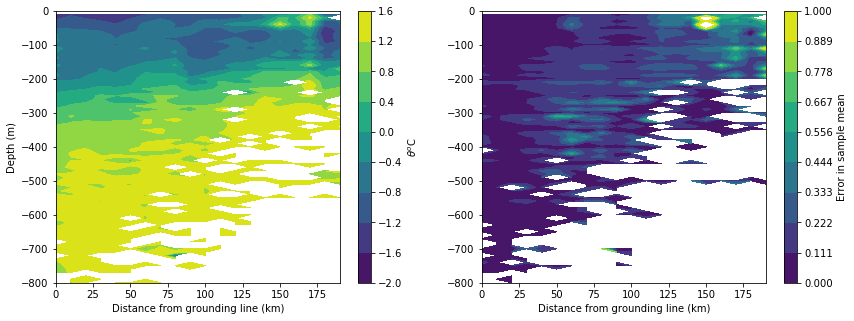

In [660]:
mask_months = sel_months(dfmg, [3,4,5])
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & antPeninsula & mask_months ) )
plot_var_contours_with_distance(dfmg, mask=mask, var='TEMP_ADJUSTED', dist=200, 
                                colorunit='$\\theta^o$C', save=True, 
                                savename='./Images/Dist_LowSurfSalinity_CTEMP_antPen_MAM.png', 
                                wd=14, ht=5, zmin=-800, varmin=-2, varmax=1.6 )

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


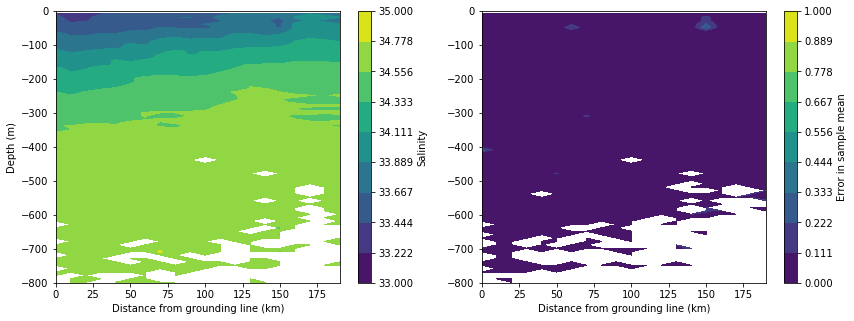

In [645]:
mask_months = sel_months(dfmg, [3,4,5])
mask = get_mask_from_prof_mask(dfmg, (antPeninsula & mask_months ) )
plot_var_contours_with_distance(dfmg, mask=mask, var='PSAL_ADJUSTED', dist=200, 
                                colorunit='Salinity', save=True, 
                                savename='./Images/Dist_Salinity_antPen_MAM.png', wd=14, ht=5, zmin=-800 )

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


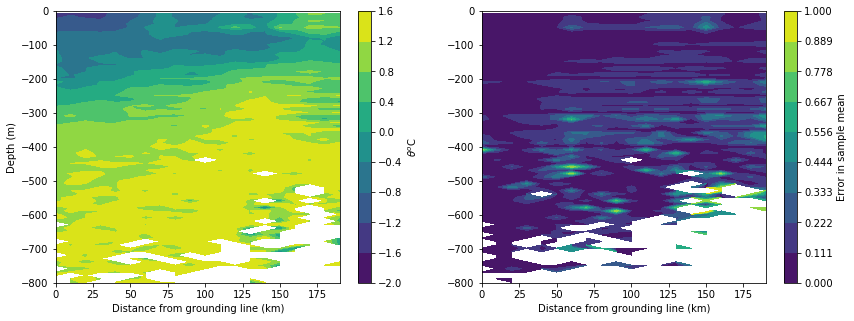

In [661]:
mask_months = sel_months(dfmg, [3,4,5])
mask = get_mask_from_prof_mask(dfmg, (antPeninsula & mask_months ) )
plot_var_contours_with_distance(dfmg, mask=mask, var='CTEMP', dist=200, 
                                colorunit='$\\theta^o$C', save=True, 
                                savename='./Images/Dist_CTEMP_antPen_MAM.png', wd=14, ht=5, 
                                zmin=-800, varmin=-2., varmax=1.6 )

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


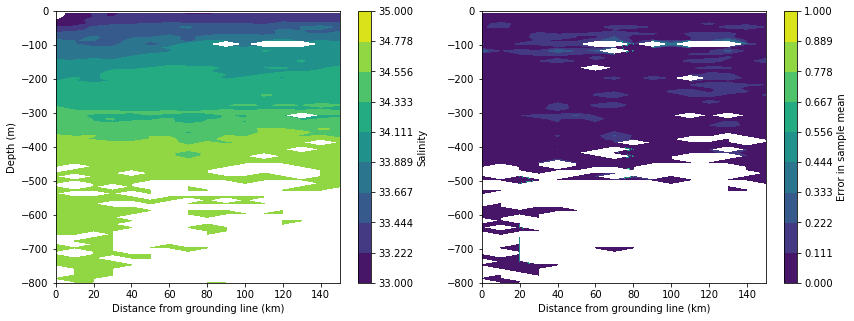

In [651]:
mask_months = sel_months(dfmg, [2,3,4,5])
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & westAnt & mask_months ) )
plot_var_contours_with_distance(dfmg, mask=mask, var='PSAL_ADJUSTED', dist=160, 
                                colorunit='Salinity', save=True, 
                                savename='./Images/Dist_LowSurfSalinity_WestAnt_FMAM.png', wd=14, ht=5, zmin=-800 )

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


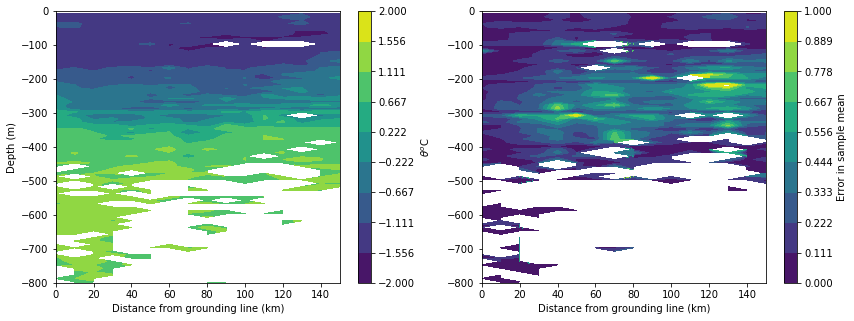

In [652]:
mask_months = sel_months(dfmg, [2,3,4,5])
mask = get_mask_from_prof_mask(dfmg, (lowSurfSal & westAnt & mask_months ) )
plot_var_contours_with_distance(dfmg, mask=mask, var='CTEMP', dist=160, 
                                colorunit='$\\theta^o$C', save=True, 
                                savename='./Images/Dist_LowSurfSalinity_CTEMP_WestAnt_FMAM.png', wd=14, ht=5, 
                                zmin=-800, varmin=-2, varmax=2 )

In [685]:
def plot_dist_quarters_region(df, mask_region, varname='CTEMP', varunit='$\\theta^o$C', varmin=-2, 
                              varmax=1.6, zmin=0, savename='Untitled', nlevs=10):
    months_quarters = np.array([[12,1,2], [3,4,5], [6,7,8], [9,10,11]])
    mth_qt_names = ['DJF', 'MAM', 'JJA', 'SON']

    for i in range(4):
        mask_months = sel_months(df, months_quarters[i])
        mask = get_mask_from_prof_mask(df, (mask_region & mask_months ) )
        plot_var_contours_with_distance(df, mask=mask, var=varname, dist=160, 
                                        colorunit=varunit, save=True, 
                                        savename=savename+mth_qt_names[i]+'.png', 
                                        wd=14, ht=5, 
                                        zmin=zmin, varmin=varmin, varmax=varmax, nlevs=nlevs)

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


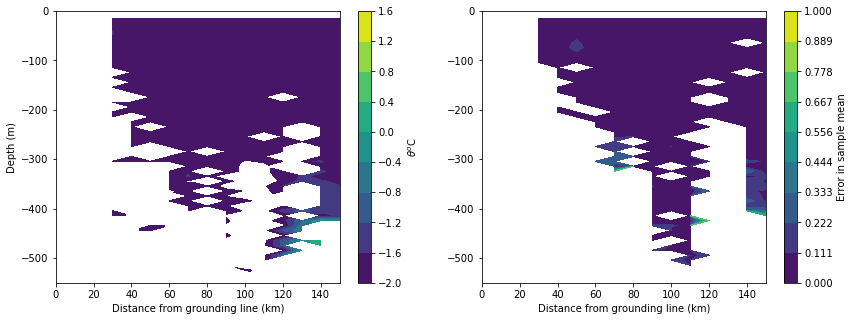

100000.0


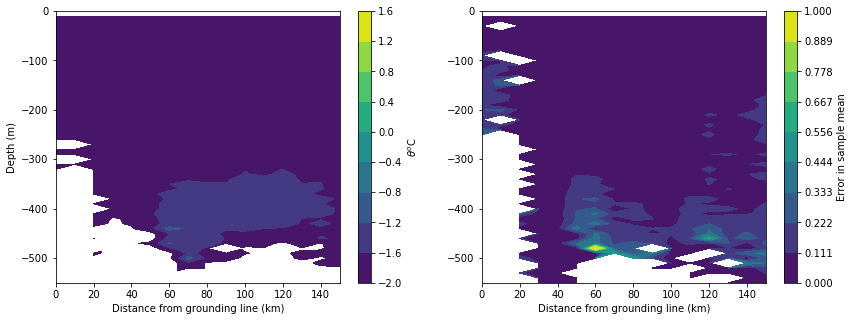

100000.0


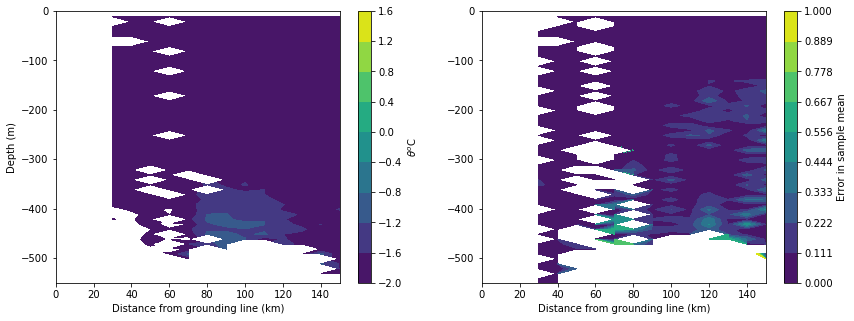

100000.0


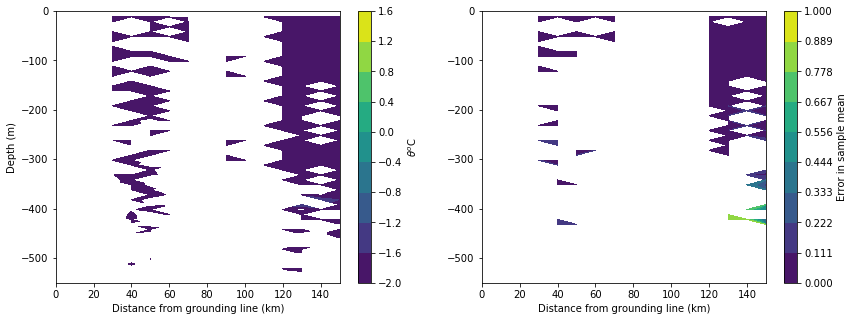

In [670]:
plot_dist_quarters_region(dfmg, Weddell, name='Weddell', varname='CTEMP', varunit='$\\theta^o$C', 
            varmin=-2, varmax=1.6, zmin=-550, savename='./Images/Dist_CTEMP_Weddell_')

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


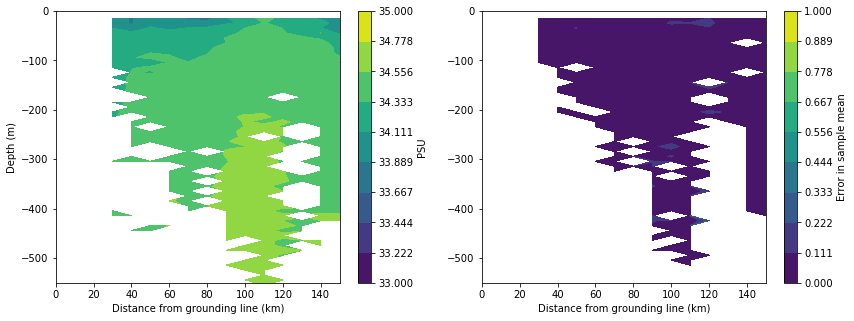

100000.0


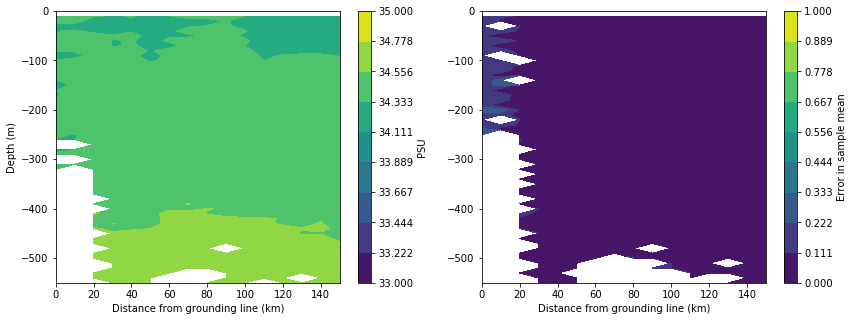

100000.0


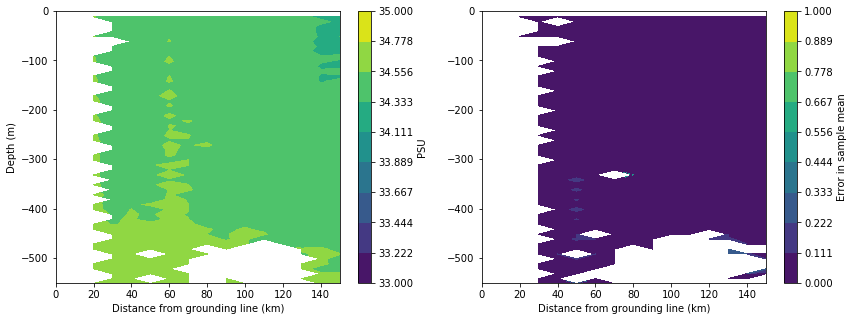

100000.0


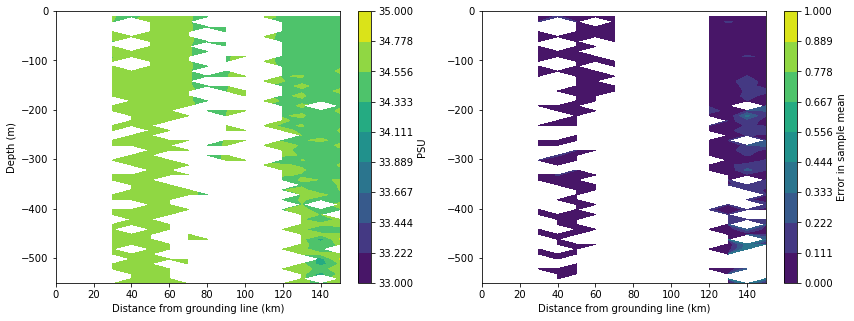

In [676]:
plot_dist_quarters_region(dfmg, Weddell, name='Weddell', varname='PSAL_ADJUSTED', varunit='PSU', 
            varmin=33, varmax=35, zmin=-550, savename='./Images/Dist_SAL_Weddell_')

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


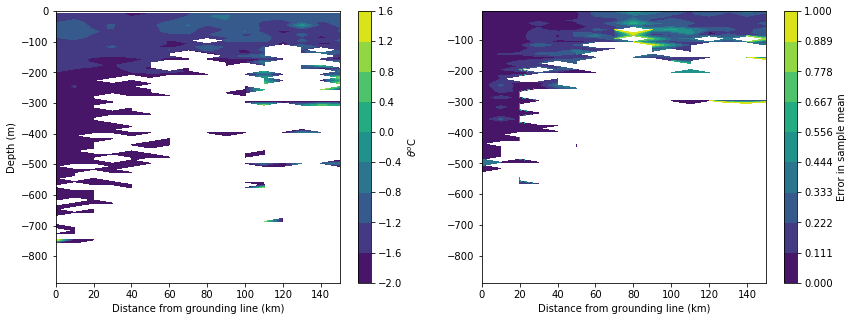

100000.0


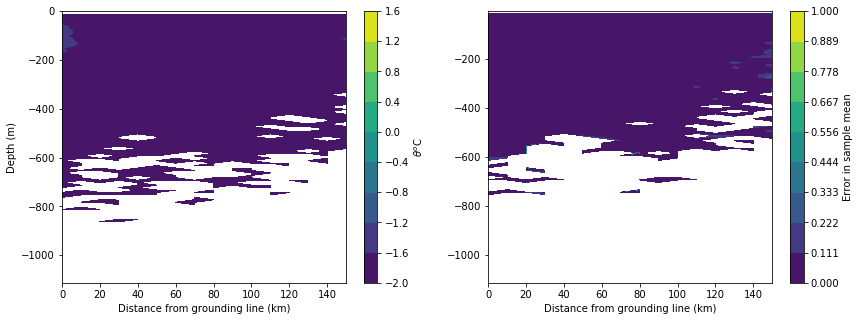

100000.0


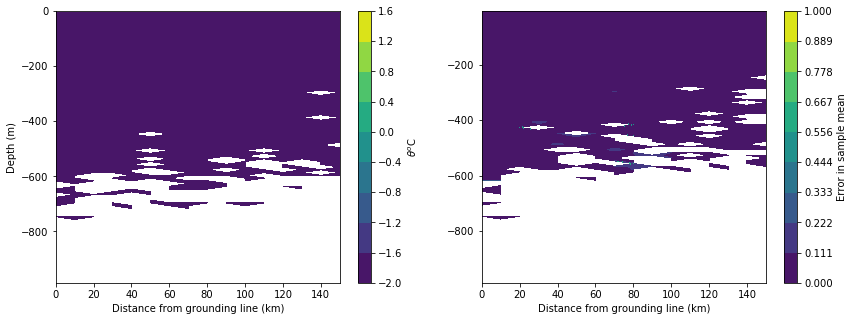

100000.0


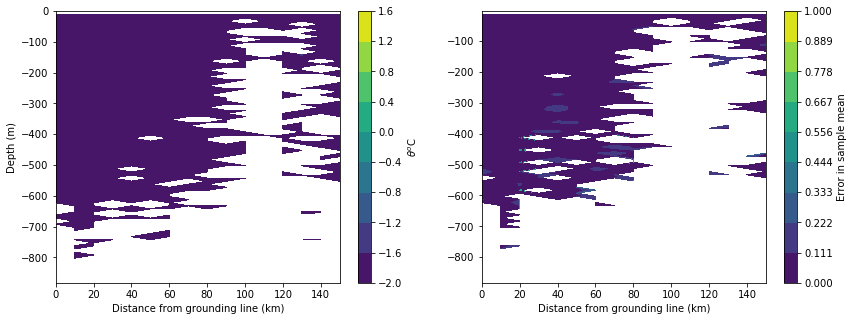

In [678]:
plot_dist_quarters_region(dfmg, Ross, name='Ross', varname='CTEMP', varunit='$\\theta^o$C', 
            varmin=-2, varmax=1.6, zmin=0, savename='./Images/Dist_CTEMP_Ross_')

In [681]:
np.linspace(33, 35, 11)

array([ 33. ,  33.2,  33.4,  33.6,  33.8,  34. ,  34.2,  34.4,  34.6,
        34.8,  35. ])

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


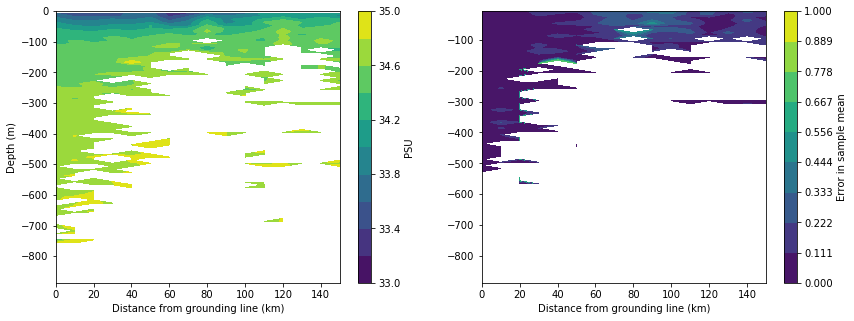

100000.0


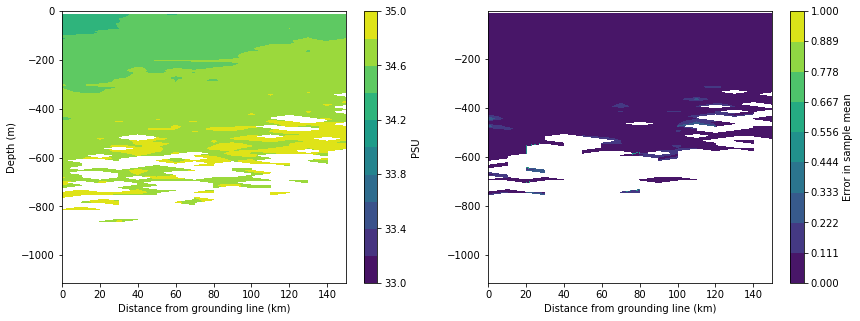

100000.0


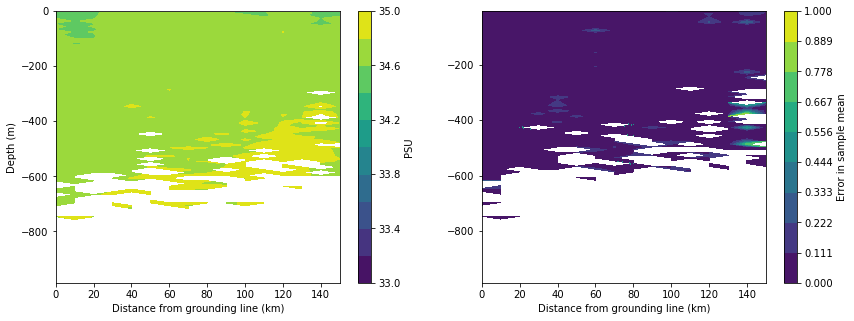

100000.0


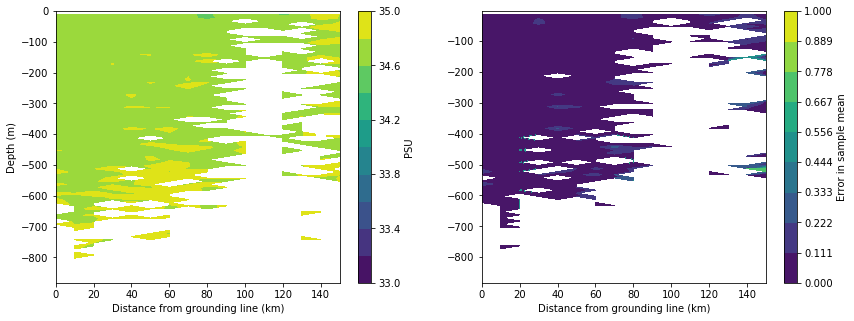

In [684]:
plot_dist_quarters_region(dfmg, Ross, name='Ross', varname='PSAL_ADJUSTED', varunit='PSU', 
            varmin=33, varmax=35, zmin=0, savename='./Images/Dist_SAL_Ross_', nlevs=11)

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


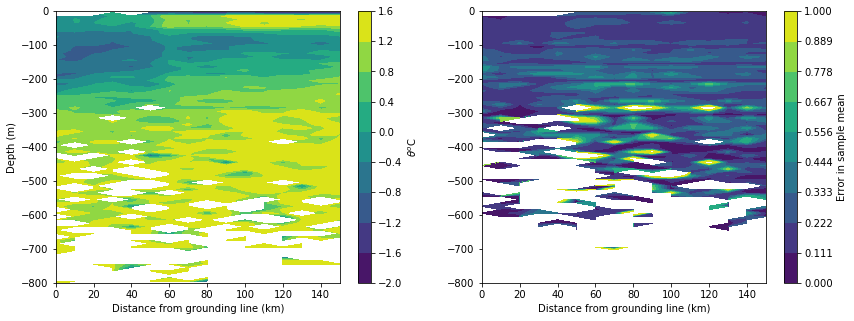

100000.0


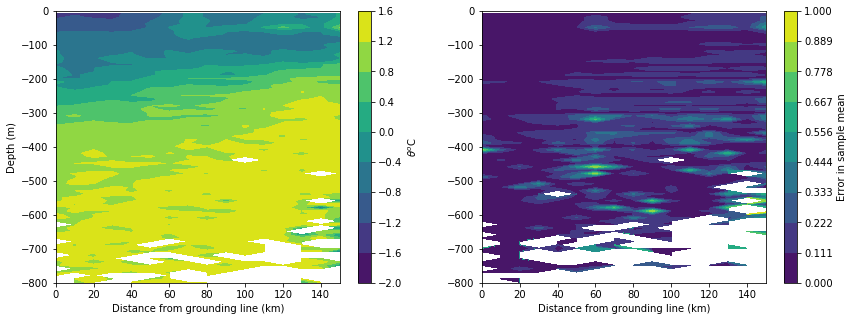

100000.0


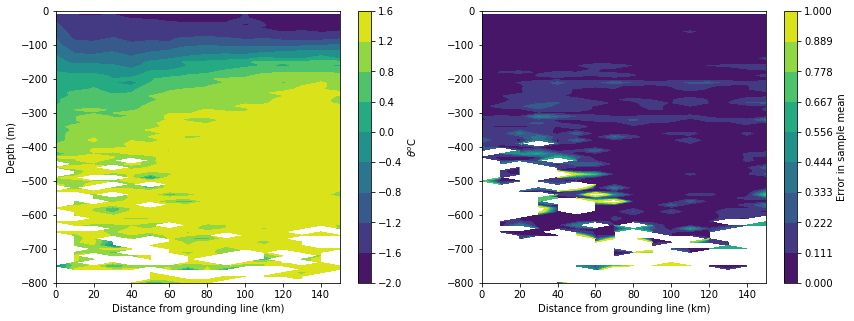

100000.0


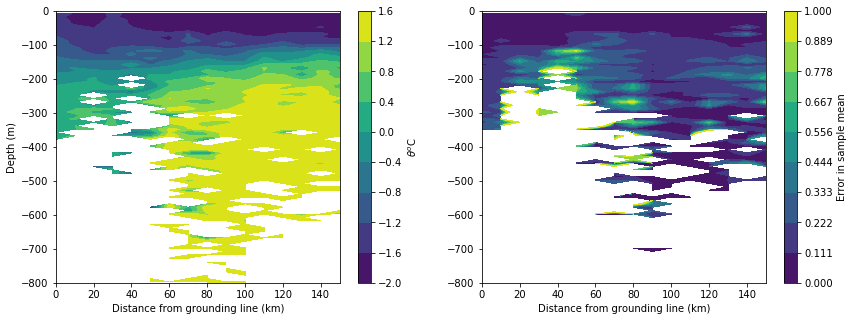

In [687]:
plot_dist_quarters_region(dfmg, antPeninsula, varname='CTEMP', varunit='$\\theta^o$C', 
            varmin=-2, varmax=1.6, zmin=-800, savename='./Images/Dist_CTEMP_AntPen_', nlevs=10)

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


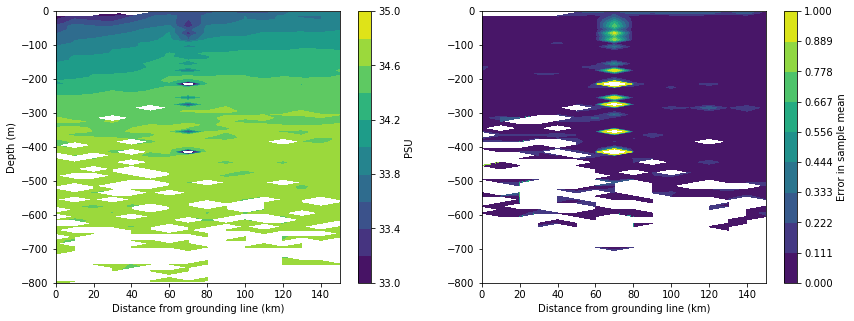

100000.0


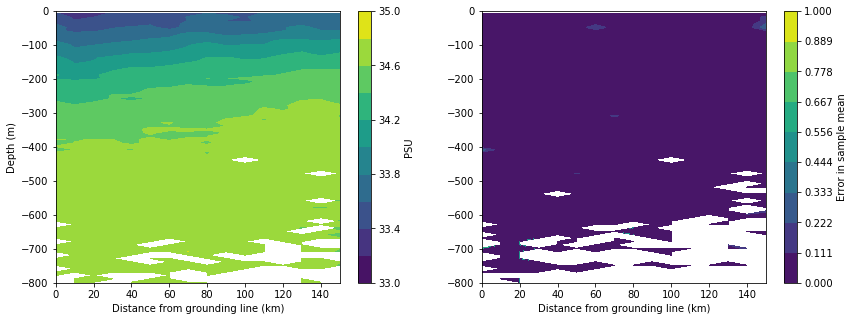

100000.0


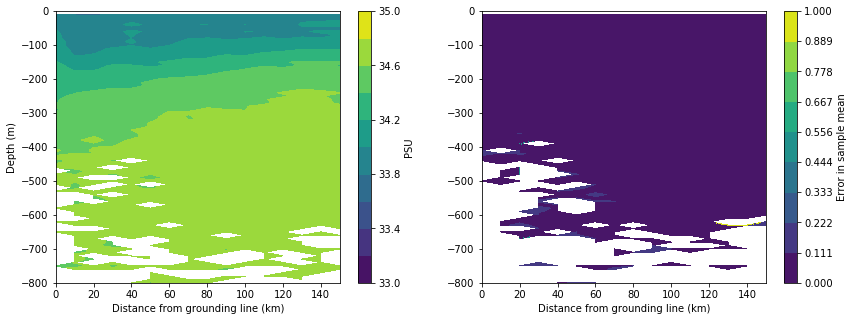

100000.0


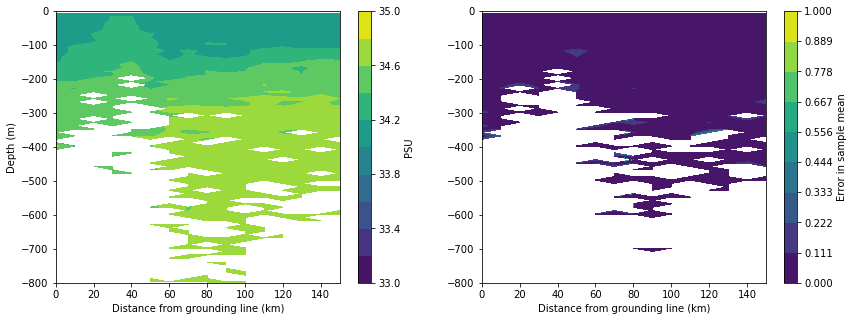

In [688]:
plot_dist_quarters_region(dfmg, antPeninsula, varname='PSAL_ADJUSTED', varunit='PSU', 
            varmin=33, varmax=35, zmin=-800, savename='./Images/Dist_SAL_AntPen_', nlevs=11)

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


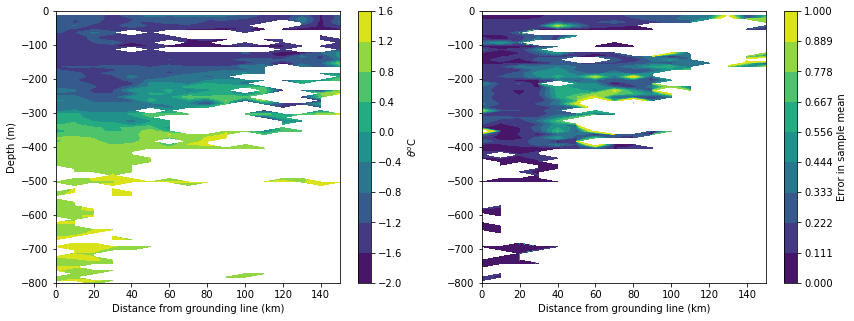

100000.0


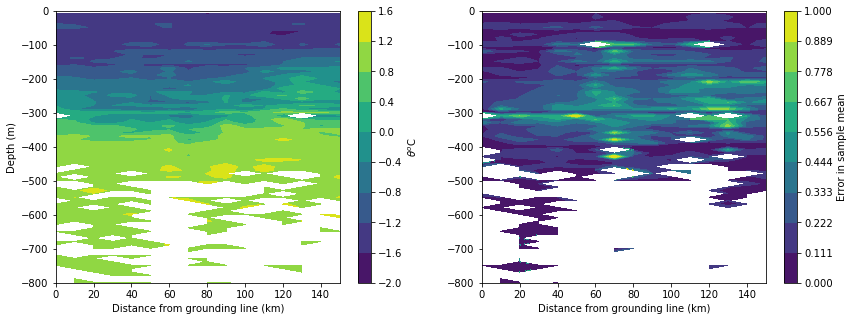

100000.0


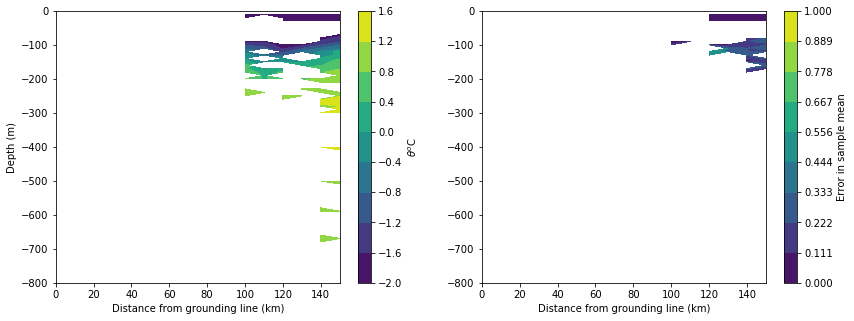

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/matplotlib/contour.py:1514: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/matplotlib/contour.py:1515: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


100000.0


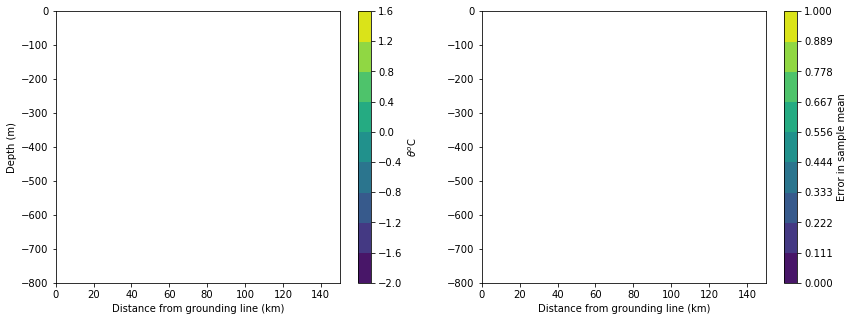

In [689]:
plot_dist_quarters_region(dfmg, westAnt, varname='CTEMP', varunit='$\\theta^o$C', 
            varmin=-2, varmax=1.6, zmin=-800, savename='./Images/Dist_CTEMP_westAnt_', nlevs=10)

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide


100000.0


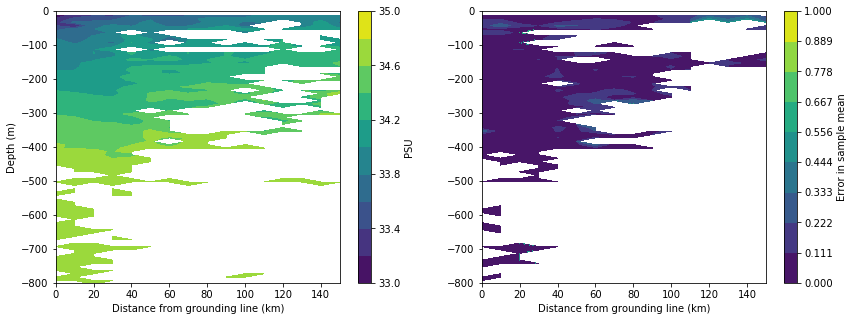

100000.0


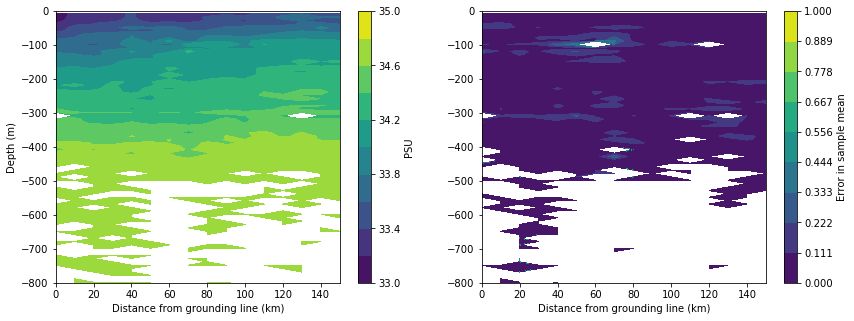

100000.0


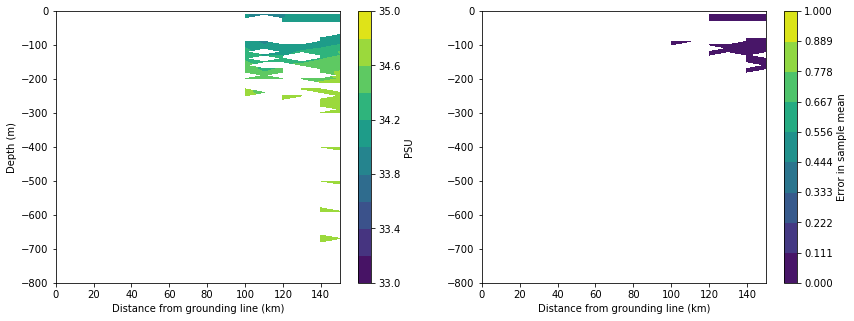

/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/matplotlib/contour.py:1514: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/home/km/anaconda2/envs/py35new/lib/python3.5/site-packages/matplotlib/contour.py:1515: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


100000.0


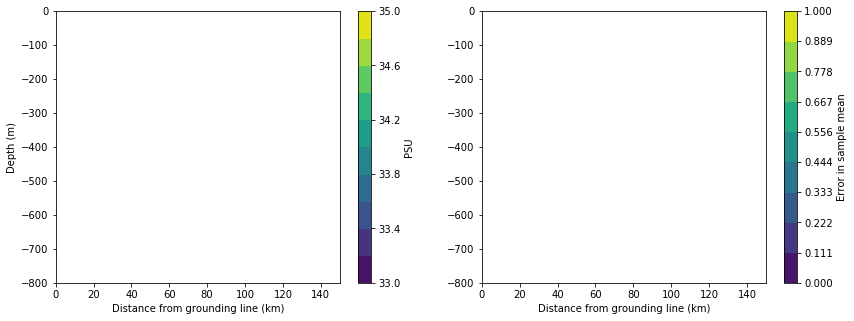

In [692]:
plot_dist_quarters_region(dfmg, westAnt, varname='PSAL_ADJUSTED', varunit='PSU', 
            varmin=33, varmax=35, zmin=-800, savename='./Images/Dist_SAL_westAnt_', nlevs=11)

## Preparing data for input into 1d Turbulence Model

In [336]:
mask = dfmg["PROFILE_NUMBER"] == 256483
dfmg[mask]

,JULD,LATITUDE,LONGITUDE,PLATFORM_NUMBER,POSITION_QC,PRES_ADJUSTED,PRES_ADJUSTED_QC,PROFILE_NUMBER,PSAL_ADJUSTED,PSAL_ADJUSTED_QC,TEMP_ADJUSTED,TEMP_ADJUSTED_QC,ECHODEPTH,DEPTH,DENSITY_INSITU,POT_DENSITY,CTEMP,mab,DENSITY_GRADIENT
1821130,2011-09-27 17:26:00.009599999,-75.8123,-33.3484,b'00021084',b'1',8.0,1,256483,34.600903,1,-1.9275,1,-725.0,-7.916466,1027.904410,27.865801,-1.924480,717.083534,0.000120
1821131,2011-09-27 17:26:00.009599999,-75.8123,-33.3484,b'00021084',b'1',46.0,1,256483,34.595001,1,-1.9233,1,-725.0,-45.515479,1028.083213,27.861307,-1.920945,679.484521,0.000120
1821132,2011-09-27 17:26:00.009599999,-75.8123,-33.3484,b'00021084',b'1',84.0,1,256483,34.591900,1,-1.9184,1,-725.0,-83.107564,1028.264016,27.858977,-1.916747,641.892436,0.000062
1821133,2011-09-27 17:26:00.009599999,-75.8123,-33.3484,b'00021084',b'1',122.0,1,256483,34.587902,1,-1.9151,1,-725.0,-120.692727,1028.443788,27.855774,-1.914176,604.307273,0.000085
1821134,2011-09-27 17:26:00.009599999,-75.8123,-33.3484,b'00021084',b'1',160.0,1,256483,34.584900,1,-1.9103,1,-725.0,-158.270976,1028.624113,27.853291,-1.910141,566.729024,0.000066
1821135,2011-09-27 17:26:00.009599999,-75.8123,-33.3484,b'00021084',b'1',198.0,1,256483,34.579903,1,-1.9065,1,-725.0,-195.842321,1028.802682,27.849207,-1.907132,529.157679,0.000109
1821136,2011-09-27 17:26:00.009599999,-75.8123,-33.3484,b'00021084',b'1',236.0,1,256483,34.576900,1,-1.9023,1,-725.0,-233.406769,1028.982668,27.846707,-1.903758,491.593231,0.000067
1821137,2011-09-27 17:26:00.009599999,-75.8123,-33.3484,b'00021084',b'1',274.0,1,256483,34.576000,1,-1.9000,1,-725.0,-270.964328,1029.164287,27.845989,-1.902313,454.035672,0.000019
1821138,2011-09-27 17:26:00.009599999,-75.8123,-33.3484,b'00021084',b'1',312.0,1,256483,34.582901,1,-1.9023,1,-725.0,-308.515006,1029.352276,27.851777,-1.905499,416.484994,-0.000154
1821139,2011-09-27 17:26:00.009599999,-75.8123,-33.3484,b'00021084',b'1',350.0,1,256483,34.598900,1,-1.9713,1,-725.0,-346.058811,1029.550050,27.866781,-1.975171,378.941189,-0.000400


In [34]:
def get_press_grad(df, prof):
    mask = (df['PROFILE_NUMBER'] == prof)  

In [108]:
dfmg['deep_flag'] = np.zeros(len(dfmg))
def apply_deep_flag(df):
    mab = df.loc[:, 'mab'].as_matrix()
    flag = 0
    if( mab[-1] < 60):
        flag = 1
    df.loc[:, 'deep_flag'] = flag
    return df
dfmg = dfmg.groupby('PROFILE_NUMBER').apply(apply_deep_flag)

In [43]:
from datetime import timedelta
mask = dfmg['PROFILE_NUMBER'] == 256483
ind = dfmg.loc[mask].index
lon = dfmg.iloc[ind[0], 2]
lat = dfmg.iloc[ind[0], 1]
time_low = dfmg.iloc[ind[0], 0] - timedelta(days=30)
time_high = dfmg.iloc[ind[0], 0] + timedelta(days=30)
mask_others = ((dfmg.loc[:,'JULD'] > time_low) & (dfmg.loc[:,'JULD'] < time_high) & (~mask) & 
               (dfmg['deep_flag'] == 1) )
other_points = dfmg.loc[mask_others,"LATITUDE": "LONGITUDE"].drop_duplicates(subset=['LONGITUDE', 'LATITUDE']).values
distances = np.zeros(len(other_points))
for i in range(len(distances)):
    distances[i] = haversine((lat, lon), other_points[i])
closest_point = other_points[np.argmin(distances)]
mask_cp = (dfmg['LATITUDE'] == closest_point[0]) & (dfmg['LONGITUDE'] == closest_point[1])

print(dfmg.loc[mask_cp, ['JULD', 'PRES_ADJUSTED', 'DEPTH']])
print(dfmg.loc[mask, ['JULD','PRES_ADJUSTED', 'DEPTH']])

                              JULD  PRES_ADJUSTED       DEPTH
1821210 2011-09-28 11:08:00.009600            8.0   -7.916481
1821211 2011-09-28 11:08:00.009600           46.0  -45.515565
1821212 2011-09-28 11:08:00.009600           83.0  -82.118542
1821213 2011-09-28 11:08:00.009600          121.0 -119.703958
1821214 2011-09-28 11:08:00.009600          158.0 -156.293642
1821215 2011-09-28 11:08:00.009600          196.0 -193.865421
1821216 2011-09-28 11:08:00.009600          233.0 -230.441841
1821217 2011-09-28 11:08:00.009600          271.0 -268.000014
1821218 2011-09-28 11:08:00.009600          309.0 -305.551306
1821219 2011-09-28 11:08:00.009600          346.0 -342.107802
1821220 2011-09-28 11:08:00.009600          384.0 -379.645536
1821221 2011-09-28 11:08:00.009600          421.0 -416.188845
1821222 2011-09-28 11:08:00.009600          459.0 -453.713052
1821223 2011-09-28 11:08:00.009600          497.0 -491.230418
1821224 2011-09-28 11:08:00.009600          534.0 -527.753918
1821225 

In [47]:
other_points

array([[ -60.0024,   83.034 ],
       [ -60.0229,   83.0541],
       [ -60.0793,   82.9328],
       [ -60.0571,   82.9238],
       [ -60.0526,   82.9225],
       [ -60.0094,   83.0824],
       [ -66.7436,   79.5368],
       [ -66.8143,   79.8122],
       [ -66.8778,   80.1365],
       [ -67.0283,   81.3713],
       [ -67.0639,   69.5854],
       [ -67.0358,   69.116 ],
       [ -67.0225,   69.2415],
       [ -67.1655,   68.5403],
       [ -67.0762,   68.2635],
       [ -67.1888,   68.0636],
       [ -67.2119,   68.267 ],
       [ -75.1445,  -35.4744],
       [ -75.0211,  -34.609 ],
       [ -75.0685,  -34.7297],
       [ -75.2466,  -35.3539],
       [ -75.2575,  -35.3554],
       [ -75.2523,  -35.3222],
       [ -75.2389,  -35.2365],
       [ -75.1808,  -34.8649],
       [ -75.1703,  -34.7979],
       [ -75.0996,  -34.3463],
       [ -75.089 ,  -34.2786],
       [ -75.0347,  -33.7979],
       [ -75.047 ,  -33.764 ],
       [ -75.0844,  -33.6618],
       [ -75.383 ,  -33.082 ],
       [

In [46]:
distances[np.argsort(distances)]

array([    5.98682193,     6.02077696,     7.56686798,    14.33351184,
          16.09685764,    16.65947108,    18.84803127,    23.40484884,
          27.39904645,    27.76104159,    28.10893242,    28.18598319,
          28.23347233,    29.71126964,    31.06191416,    31.84648914,
          35.3741018 ,    35.46466857,    38.31306355,    39.17223021,
          42.92912974,    43.32196312,    47.96542886,    48.30112598,
          50.06904717,    50.51636537,    50.84186206,    52.70926257,
          53.02110105,    53.12018248,    53.64891926,    55.83631942,
          56.37353799,    56.46525043,    56.71667434,    56.90070686,
          57.57610888,    57.58498741,    57.61430382,    57.67884032,
          58.22592997,    61.00565593,    61.16382318,    68.99826637,
          72.94175555,    74.32837   ,    78.12012786,    78.75214357,
          80.23795216,    81.01389934,    81.41071025,    81.93471484,
          82.010618  ,    82.56902747,    82.96201916,    83.13776585,
      

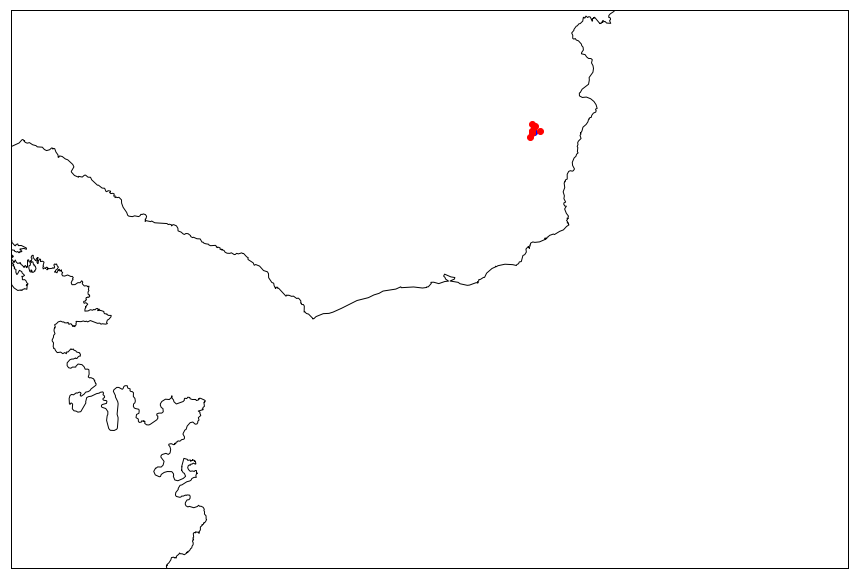

In [51]:
plt.figure(figsize=(15,15))
close_indices = np.argsort(distances)[0:8]
lat0 = -89
lon0 = 0
m1 = Basemap(projection='ortho', lat_0 =lat0, lon_0 =lon0, resolution='i');
width = m1.urcrnrx - m1.llcrnrx
height = m1.urcrnry - m1.llcrnry
m  = Basemap(projection='ortho', lat_0=lat0, lon_0=lon0, resolution='i', llcrnrx=-width*0.30*0.6, llcrnry=0.*height,\
                 urcrnrx=0.*width, urcrnry=0.4*0.30*height)

xlon, ylat = m(lon, lat)
m.scatter(xlon, ylat, color='b')

xm, ym = m(other_points[close_indices, 1], other_points[close_indices, 0])
m.scatter(xm, ym, color='r')

m.drawcoastlines();
m.drawmapboundary();
plt.show()

In [96]:
distances[885]

1.6406718063589874

In [92]:
len(other_points)

1913

In [32]:
from haversine import haversine
loc1 = np.array([[-75, 30], [-75, 30.01]])

haversine(loc1[0], loc1[1])

0.2877936470032505

In [31]:
import TBS
import importlib
importlib.reload(TBS)
mask = dfmg["PROFILE_NUMBER"] == 256483
rho = dfmg.loc[mask, "DENSITY_INSITU"].as_matrix()
depth = dfmg.loc[mask, "mab"].as_matrix()[::-1]
depth[0] = 0.
lat = dfmg.loc[mask, "LATITUDE"].as_matrix()[0]
resvel = np.ones(len(rho)) * 0.1
echodepth = depth[-1]
dp_vector = np.ones(len(rho)) * 0.008
outdir = "./Results/"
Model = TBS.Keps_Solver(200, lat, depth[:], echodepth, dp_vector, rho, resvel, outdir, "Vars")
Model.solver(3600, 10., 300)

this is iteration number = 1, max(norm_k)= 0.948733594292, norm_eps_max=0.98951485522, norm_u_max=0.000820255042131
this is iteration number = 2, max(norm_k)= 0.966626456367, norm_eps_max=0.991703479649, norm_u_max=0.00187356251848
this is iteration number = 3, max(norm_k)= 0.966673531256, norm_eps_max=0.991780522334, norm_u_max=0.00186661956978
this is iteration number = 4, max(norm_k)= 0.966568031984, norm_eps_max=0.991792222426, norm_u_max=0.00186029265511
this is iteration number = 5, max(norm_k)= 0.966551300905, norm_eps_max=0.991778537465, norm_u_max=0.00185300299786
this is iteration number = 6, max(norm_k)= 0.966360209754, norm_eps_max=0.99175260447, norm_u_max=0.00184650274208
this is iteration number = 7, max(norm_k)= 0.966693444504, norm_eps_max=0.999997732291, norm_u_max=0.00184015142774
this is iteration number = 8, max(norm_k)= 0.966443604886, norm_eps_max=0.999995464591, norm_u_max=0.0018338752659
this is iteration number = 9, max(norm_k)= 0.966189739421, norm_eps_max=0.

this is iteration number = 222, max(norm_k)= 0.00168461534295, norm_eps_max=0.0306124176121, norm_u_max=0.00142735668897
this is iteration number = 223, max(norm_k)= 0.00170334478959, norm_eps_max=0.0301135386874, norm_u_max=0.00142423959146
this is iteration number = 224, max(norm_k)= 0.00170141092412, norm_eps_max=0.0293250616749, norm_u_max=0.00142112948669
this is iteration number = 225, max(norm_k)= 0.00171937778299, norm_eps_max=0.0288336759063, norm_u_max=0.00141803603588
this is iteration number = 226, max(norm_k)= 0.00171747356776, norm_eps_max=0.028090161644, norm_u_max=0.00141494963203
this is iteration number = 227, max(norm_k)= 0.00173470545059, norm_eps_max=0.0276098607624, norm_u_max=0.00141187953372
this is iteration number = 228, max(norm_k)= 0.00173282851164, norm_eps_max=0.0269056371262, norm_u_max=0.00140881653117
this is iteration number = 229, max(norm_k)= 0.00174935200207, norm_eps_max=0.0264395867278, norm_u_max=0.00140576949663
this is iteration number = 230, m

this is iteration number = 301, max(norm_k)= 0.00197055875881, norm_eps_max=0.00588377203856, norm_u_max=0.00121256202682
this is iteration number = 302, max(norm_k)= 0.0019687257629, norm_eps_max=0.00512773864162, norm_u_max=0.00121019659981
this is iteration number = 303, max(norm_k)= 0.001971143204, norm_eps_max=0.00565663285924, norm_u_max=0.00120783968482
this is iteration number = 304, max(norm_k)= 0.00196929976887, norm_eps_max=0.00488891689618, norm_u_max=0.00120548947003
this is iteration number = 305, max(norm_k)= 0.00197154024232, norm_eps_max=0.00543930889944, norm_u_max=0.00120314765218
this is iteration number = 306, max(norm_k)= 0.00196968628068, norm_eps_max=0.00465999342749, norm_u_max=0.00120081249578
this is iteration number = 307, max(norm_k)= 0.00197175615756, norm_eps_max=0.00523137674458, norm_u_max=0.00119848562399
this is iteration number = 308, max(norm_k)= 0.00196989160664, norm_eps_max=0.00444055780459, norm_u_max=0.00119616537444
this is iteration number = 

this is iteration number = 485, max(norm_k)= 0.00168781956847, norm_eps_max=0.000734151224953, norm_u_max=0.000876020219969
this is iteration number = 486, max(norm_k)= 0.00168571481587, norm_eps_max=0.000528176613611, norm_u_max=0.00087460881988
this is iteration number = 487, max(norm_k)= 0.00168371477431, norm_eps_max=0.000730340277501, norm_u_max=0.000873200921404
this is iteration number = 488, max(norm_k)= 0.00168161515918, norm_eps_max=0.000533083084262, norm_u_max=0.000871796481238
this is iteration number = 489, max(norm_k)= 0.00167961619126, norm_eps_max=0.000726690990042, norm_u_max=0.000870395516805
this is iteration number = 490, max(norm_k)= 0.00167752180418, norm_eps_max=0.000537782064986, norm_u_max=0.000868997986255
this is iteration number = 491, max(norm_k)= 0.00167552416352, norm_eps_max=0.000723196071752, norm_u_max=0.000867603905837
this is iteration number = 492, max(norm_k)= 0.00167343509224, norm_eps_max=0.000542281892535, norm_u_max=0.000866213235095
this is i

this is iteration number = 601, max(norm_k)= 0.00146529651279, norm_eps_max=0.000645842044374, norm_u_max=0.000831482058369
this is iteration number = 602, max(norm_k)= 0.00146356857836, norm_eps_max=0.000629009880174, norm_u_max=0.000831179714883
this is iteration number = 603, max(norm_k)= 0.00146185347231, norm_eps_max=0.000645308226155, norm_u_max=0.000830877223432
this is iteration number = 604, max(norm_k)= 0.00146013261892, norm_eps_max=0.000629181902682, norm_u_max=0.00083057458305
this is iteration number = 605, max(norm_k)= 0.00145842418687, norm_eps_max=0.000644783861333, norm_u_max=0.000830271797394
this is iteration number = 606, max(norm_k)= 0.00145671035711, norm_eps_max=0.000629333459235, norm_u_max=0.000829968865586
this is iteration number = 607, max(norm_k)= 0.0014550085619, norm_eps_max=0.000644268458671, norm_u_max=0.000829665791172
this is iteration number = 608, max(norm_k)= 0.00145330170912, norm_eps_max=0.000629465326242, norm_u_max=0.000829362573361
this is it

this is iteration number = 840, max(norm_k)= 0.00113971981325, norm_eps_max=0.000599109120284, norm_u_max=0.000757432004079
this is iteration number = 841, max(norm_k)= 0.00113866128707, norm_eps_max=0.000599021744621, norm_u_max=0.000757122747317
this is iteration number = 842, max(norm_k)= 0.00113760469475, norm_eps_max=0.000598745624025, norm_u_max=0.00075681354732
this is iteration number = 843, max(norm_k)= 0.00113655015569, norm_eps_max=0.000598654185903, norm_u_max=0.000756504404576
this is iteration number = 844, max(norm_k)= 0.00113549754072, norm_eps_max=0.000598381991909, norm_u_max=0.000756195319549
this is iteration number = 845, max(norm_k)= 0.00113444696409, norm_eps_max=0.00059828666415, norm_u_max=0.000755886292723
this is iteration number = 846, max(norm_k)= 0.0011333983017, norm_eps_max=0.000598018231424, norm_u_max=0.000755577324558
this is iteration number = 847, max(norm_k)= 0.00113235166287, norm_eps_max=0.000597919179505, norm_u_max=0.000755268415532
this is ite

this is iteration number = 1136, max(norm_k)= 0.000891105834727, norm_eps_max=0.000544024314158, norm_u_max=0.000669835233911
this is iteration number = 1137, max(norm_k)= 0.000890421952362, norm_eps_max=0.000543828009427, norm_u_max=0.00066955613518
this is iteration number = 1138, max(norm_k)= 0.000889738763048, norm_eps_max=0.000543631258877, norm_u_max=0.000669277164463
this is iteration number = 1139, max(norm_k)= 0.000889056264086, norm_eps_max=0.000543434681938, norm_u_max=0.000668998321839
this is iteration number = 1140, max(norm_k)= 0.00088837445231, norm_eps_max=0.000543237670981, norm_u_max=0.000668719607388
this is iteration number = 1141, max(norm_k)= 0.000887693325026, norm_eps_max=0.000543040819186, norm_u_max=0.000668441021187
this is iteration number = 1142, max(norm_k)= 0.000887012879092, norm_eps_max=0.00054284354461, norm_u_max=0.000668162563314
this is iteration number = 1143, max(norm_k)= 0.000886333111818, norm_eps_max=0.000542646415297, norm_u_max=0.00066788423

this is iteration number = 1430, max(norm_k)= 0.000709479211129, norm_eps_max=0.000477434722923, norm_u_max=0.000608016341256
this is iteration number = 1431, max(norm_k)= 0.000708897686472, norm_eps_max=0.000477167266177, norm_u_max=0.000607880440269
this is iteration number = 1432, max(norm_k)= 0.000708316233999, norm_eps_max=0.000476899459995, norm_u_max=0.000607744608835
this is iteration number = 1433, max(norm_k)= 0.000707734852245, norm_eps_max=0.000476631304767, norm_u_max=0.000607608846858
this is iteration number = 1434, max(norm_k)= 0.000707153539748, norm_eps_max=0.000476362798758, norm_u_max=0.000607473154243
this is iteration number = 1435, max(norm_k)= 0.000706572295052, norm_eps_max=0.000476093942311, norm_u_max=0.000607337530896
this is iteration number = 1436, max(norm_k)= 0.000705991116702, norm_eps_max=0.000475824733739, norm_u_max=0.000607201976722
this is iteration number = 1437, max(norm_k)= 0.000705410003246, norm_eps_max=0.000475555173344, norm_u_max=0.00060706

this is iteration number = 1501, max(norm_k)= 0.000668289943463, norm_eps_max=0.000457539850454, norm_u_max=0.00059853497398
this is iteration number = 1502, max(norm_k)= 0.00066771009845, norm_eps_max=0.000457245963364, norm_u_max=0.000598403786638
this is iteration number = 1503, max(norm_k)= 0.000667130230005, norm_eps_max=0.000456951680824, norm_u_max=0.000598272662603
this is iteration number = 1504, max(norm_k)= 0.0006665503369, norm_eps_max=0.000456657001978, norm_u_max=0.000598141601792
this is iteration number = 1505, max(norm_k)= 0.000665970417909, norm_eps_max=0.000456361926422, norm_u_max=0.000598010604126
this is iteration number = 1506, max(norm_k)= 0.000665390471809, norm_eps_max=0.000456066453323, norm_u_max=0.000597879669522
this is iteration number = 1507, max(norm_k)= 0.000664810497379, norm_eps_max=0.000455770582261, norm_u_max=0.000597748797902
this is iteration number = 1508, max(norm_k)= 0.000664230493404, norm_eps_max=0.000455474312413, norm_u_max=0.000597617989

this is iteration number = 1733, max(norm_k)= 0.000530967603445, norm_eps_max=0.000377613243141, norm_u_max=0.000569648415098
this is iteration number = 1734, max(norm_k)= 0.000530355529568, norm_eps_max=0.000377213373432, norm_u_max=0.000569530066527
this is iteration number = 1735, max(norm_k)= 0.000529743226224, norm_eps_max=0.000376812998667, norm_u_max=0.000569411766485
this is iteration number = 1736, max(norm_k)= 0.000529130692855, norm_eps_max=0.000376412118581, norm_u_max=0.000569293514923
this is iteration number = 1737, max(norm_k)= 0.000528517928907, norm_eps_max=0.000376010732892, norm_u_max=0.000569175311791
this is iteration number = 1738, max(norm_k)= 0.000527904933825, norm_eps_max=0.000375608841339, norm_u_max=0.00056905715704
this is iteration number = 1739, max(norm_k)= 0.000527291707061, norm_eps_max=0.000375206443639, norm_u_max=0.000568939050622
this is iteration number = 1740, max(norm_k)= 0.000526678248066, norm_eps_max=0.000374803539544, norm_u_max=0.000568820

this is iteration number = 1801, max(norm_k)= 0.000488798121053, norm_eps_max=0.000349259526164, norm_u_max=0.000561708868287
this is iteration number = 1802, max(norm_k)= 0.000488169309869, norm_eps_max=0.000348824792808, norm_u_max=0.000561593712145
this is iteration number = 1803, max(norm_k)= 0.000487540237538, norm_eps_max=0.000348389540595, norm_u_max=0.000561478601395
this is iteration number = 1804, max(norm_k)= 0.000486910903689, norm_eps_max=0.000347953769409, norm_u_max=0.000561363535992
this is iteration number = 1805, max(norm_k)= 0.000486281307954, norm_eps_max=0.000347517479117, norm_u_max=0.000561248515895
this is iteration number = 1806, max(norm_k)= 0.000485651449968, norm_eps_max=0.000347080669608, norm_u_max=0.00056113354106
this is iteration number = 1807, max(norm_k)= 0.000485021329368, norm_eps_max=0.000346643340758, norm_u_max=0.000561018611445
this is iteration number = 1808, max(norm_k)= 0.000484390945795, norm_eps_max=0.000346205492455, norm_u_max=0.000560903

this is iteration number = 2022, max(norm_k)= 0.000343090823961, norm_eps_max=0.000240593080041, norm_u_max=0.000537293822022
this is iteration number = 2023, max(norm_k)= 0.000342400170576, norm_eps_max=0.000240045199296, norm_u_max=0.000537187783111
this is iteration number = 2024, max(norm_k)= 0.000341709240892, norm_eps_max=0.000239496835919, norm_u_max=0.000537081781815
this is iteration number = 2025, max(norm_k)= 0.000341018035142, norm_eps_max=0.000238947990397, norm_u_max=0.000536975818104
this is iteration number = 2026, max(norm_k)= 0.00034032655356, norm_eps_max=0.000238398663198, norm_u_max=0.000536869891949
this is iteration number = 2027, max(norm_k)= 0.000339634796385, norm_eps_max=0.00023784885482, norm_u_max=0.000536764003324
this is iteration number = 2028, max(norm_k)= 0.000338942763859, norm_eps_max=0.000237298565736, norm_u_max=0.000536658152199
this is iteration number = 2029, max(norm_k)= 0.000338250456225, norm_eps_max=0.000236747796448, norm_u_max=0.0005365523

this is iteration number = 2101, max(norm_k)= 0.00028770030094, norm_eps_max=0.000195865754126, norm_u_max=0.000529030450576
this is iteration number = 2102, max(norm_k)= 0.000286988745038, norm_eps_max=0.000195281451718, norm_u_max=0.000528927298935
this is iteration number = 2103, max(norm_k)= 0.000286276939284, norm_eps_max=0.000194696713508, norm_u_max=0.000528824182796
this is iteration number = 2104, max(norm_k)= 0.000285564884115, norm_eps_max=0.000194111540241, norm_u_max=0.000528721102134
this is iteration number = 2105, max(norm_k)= 0.000284852579968, norm_eps_max=0.000193525932599, norm_u_max=0.000528618056923
this is iteration number = 2106, max(norm_k)= 0.000284140027289, norm_eps_max=0.000192939891329, norm_u_max=0.000528515047139
this is iteration number = 2107, max(norm_k)= 0.000283427226519, norm_eps_max=0.000192353417117, norm_u_max=0.000528412072757
this is iteration number = 2108, max(norm_k)= 0.000282714178107, norm_eps_max=0.000191766510719, norm_u_max=0.000528309

this is iteration number = 2349, max(norm_k)= 0.000105040223161, norm_eps_max=3.98184037426e-05, norm_u_max=0.000504479079416
this is iteration number = 2350, max(norm_k)= 0.000104285856449, norm_eps_max=3.91545520956e-05, norm_u_max=0.000504384056599
this is iteration number = 2351, max(norm_k)= 0.000103531415978, norm_eps_max=3.84905203321e-05, norm_u_max=0.000504289064133
this is iteration number = 2352, max(norm_k)= 0.000102776902685, norm_eps_max=3.78263097413e-05, norm_u_max=0.000504194102
this is iteration number = 2353, max(norm_k)= 0.000102022317512, norm_eps_max=3.71619216304e-05, norm_u_max=0.000504099170183
this is iteration number = 2354, max(norm_k)= 0.000101267661398, norm_eps_max=3.64973572884e-05, norm_u_max=0.000504004268665
this is iteration number = 2355, max(norm_k)= 0.000100512935289, norm_eps_max=3.58326180339e-05, norm_u_max=0.000503909397429
this is iteration number = 2356, max(norm_k)= 9.97581401279e-05, norm_eps_max=3.51677051486e-05, norm_u_max=0.00050381455

this is iteration number = 2567, max(norm_k)= 0.000107188819865, norm_eps_max=0.000106848786989, norm_u_max=0.000484454513975
this is iteration number = 2568, max(norm_k)= 0.000107859436595, norm_eps_max=0.000107519475644, norm_u_max=0.000484365734228
this is iteration number = 2569, max(norm_k)= 0.000108529929968, norm_eps_max=0.000108190041641, norm_u_max=0.000484276981535
this is iteration number = 2570, max(norm_k)= 0.000109200298584, norm_eps_max=0.000108860483606, norm_u_max=0.000484188255882
this is iteration number = 2571, max(norm_k)= 0.000109870541043, norm_eps_max=0.000109530800109, norm_u_max=0.000484099557257
this is iteration number = 2572, max(norm_k)= 0.000110540655943, norm_eps_max=0.000110200989782, norm_u_max=0.000484010885646
this is iteration number = 2573, max(norm_k)= 0.000111210641887, norm_eps_max=0.000110871051196, norm_u_max=0.000483922241036
this is iteration number = 2574, max(norm_k)= 0.000111880497475, norm_eps_max=0.000111540982973, norm_u_max=0.00048383

this is iteration number = 2701, max(norm_k)= 0.000195414321364, norm_eps_max=0.00019509008817, norm_u_max=0.000472794066306
this is iteration number = 2702, max(norm_k)= 0.000196056296913, norm_eps_max=0.000195732226434, norm_u_max=0.000472708798522
this is iteration number = 2703, max(norm_k)= 0.000196697970769, norm_eps_max=0.000196374063628, norm_u_max=0.000472623556125
this is iteration number = 2704, max(norm_k)= 0.0001973393417, norm_eps_max=0.000197015598528, norm_u_max=0.000472538339104
this is iteration number = 2705, max(norm_k)= 0.000197980408474, norm_eps_max=0.000197656829895, norm_u_max=0.000472453147447
this is iteration number = 2706, max(norm_k)= 0.000198621169862, norm_eps_max=0.000198297756507, norm_u_max=0.000472367981143
this is iteration number = 2707, max(norm_k)= 0.000199261624638, norm_eps_max=0.000198938377127, norm_u_max=0.00047228284018
this is iteration number = 2708, max(norm_k)= 0.000199901771575, norm_eps_max=0.000199578690536, norm_u_max=0.000472197724

this is iteration number = 2922, max(norm_k)= 0.000333140731606, norm_eps_max=0.00032769783324, norm_u_max=0.000454547313723
this is iteration number = 2923, max(norm_k)= 0.00033377045756, norm_eps_max=0.000328247283237, norm_u_max=0.000454467390062
this is iteration number = 2924, max(norm_k)= 0.000334399716503, norm_eps_max=0.000328796214322, norm_u_max=0.000454387489434
this is iteration number = 2925, max(norm_k)= 0.000335028507758, norm_eps_max=0.000329344625777, norm_u_max=0.000454307611828
this is iteration number = 2926, max(norm_k)= 0.000335656830653, norm_eps_max=0.000329892516922, norm_u_max=0.000454227757237
this is iteration number = 2927, max(norm_k)= 0.000336284684518, norm_eps_max=0.000330439887044, norm_u_max=0.000454147925648
this is iteration number = 2928, max(norm_k)= 0.000336912068681, norm_eps_max=0.000330986735468, norm_u_max=0.000454068117054
this is iteration number = 2929, max(norm_k)= 0.000337538982476, norm_eps_max=0.000331533061485, norm_u_max=0.0004539883

this is iteration number = 3001, max(norm_k)= 0.000381399547042, norm_eps_max=0.000369454322664, norm_u_max=0.000448303543544
this is iteration number = 3002, max(norm_k)= 0.000381990442119, norm_eps_max=0.000369960837377, norm_u_max=0.000448225409791
this is iteration number = 3003, max(norm_k)= 0.000382580822438, norm_eps_max=0.000370466786322, norm_u_max=0.000448147298316
this is iteration number = 3004, max(norm_k)= 0.000383170687467, norm_eps_max=0.000370972169021, norm_u_max=0.00044806920911
this is iteration number = 3005, max(norm_k)= 0.000383760036677, norm_eps_max=0.000371476984991, norm_u_max=0.000447991142163
this is iteration number = 3006, max(norm_k)= 0.000384348869541, norm_eps_max=0.000371981233757, norm_u_max=0.000447913097465
this is iteration number = 3007, max(norm_k)= 0.000384937185533, norm_eps_max=0.000372484914842, norm_u_max=0.000447835075009
this is iteration number = 3008, max(norm_k)= 0.00038552498413, norm_eps_max=0.000372988027778, norm_u_max=0.0004477570

this is iteration number = 3218, max(norm_k)= 0.000496831791707, norm_eps_max=0.000465536799686, norm_u_max=0.000431855422163
this is iteration number = 3219, max(norm_k)= 0.00049730158388, norm_eps_max=0.000465913643571, norm_u_max=0.000431781912551
this is iteration number = 3220, max(norm_k)= 0.000497770788066, norm_eps_max=0.000466289877234, norm_u_max=0.000431708423304
this is iteration number = 3221, max(norm_k)= 0.000498239404112, norm_eps_max=0.000466665500748, norm_u_max=0.000431634954417
this is iteration number = 3222, max(norm_k)= 0.000498707431867, norm_eps_max=0.000467040514142, norm_u_max=0.000431561505879
this is iteration number = 3223, max(norm_k)= 0.00049917487118, norm_eps_max=0.000467414917493, norm_u_max=0.000431488077682
this is iteration number = 3224, max(norm_k)= 0.000499641721903, norm_eps_max=0.000467788710834, norm_u_max=0.000431414669818
this is iteration number = 3225, max(norm_k)= 0.000500107983889, norm_eps_max=0.000468161894244, norm_u_max=0.0004313412

this is iteration number = 3301, max(norm_k)= 0.000533812291983, norm_eps_max=0.000494746463399, norm_u_max=0.000425822669003
this is iteration number = 3302, max(norm_k)= 0.000534232896184, norm_eps_max=0.000495073007301, norm_u_max=0.000425750821643
this is iteration number = 3303, max(norm_k)= 0.000534652904666, norm_eps_max=0.000495398951598, norm_u_max=0.000425678993966
this is iteration number = 3304, max(norm_k)= 0.000535072317395, norm_eps_max=0.000495724296527, norm_u_max=0.000425607185965
this is iteration number = 3305, max(norm_k)= 0.000535491134338, norm_eps_max=0.000496049042258, norm_u_max=0.00042553539763
this is iteration number = 3306, max(norm_k)= 0.000535909355462, norm_eps_max=0.000496373189029, norm_u_max=0.000425463628954
this is iteration number = 3307, max(norm_k)= 0.000536326980736, norm_eps_max=0.00049669673702, norm_u_max=0.000425391879928
this is iteration number = 3308, max(norm_k)= 0.000536744010131, norm_eps_max=0.000497019686466, norm_u_max=0.0004253201

this is iteration number = 3523, max(norm_k)= 0.000612625809433, norm_eps_max=0.000553036627851, norm_u_max=0.000410341067525
this is iteration number = 3524, max(norm_k)= 0.000612915359502, norm_eps_max=0.000553237520431, norm_u_max=0.000410273395394
this is iteration number = 3525, max(norm_k)= 0.000613204332672, norm_eps_max=0.00055343789016, norm_u_max=0.000410205741204
this is iteration number = 3526, max(norm_k)= 0.000613492729123, norm_eps_max=0.000553637737504, norm_u_max=0.000410138104949
this is iteration number = 3527, max(norm_k)= 0.000613780549034, norm_eps_max=0.000553837062904, norm_u_max=0.000410070486619
this is iteration number = 3528, max(norm_k)= 0.000614067792589, norm_eps_max=0.000554035866825, norm_u_max=0.000410002886208
this is iteration number = 3529, max(norm_k)= 0.000614354459969, norm_eps_max=0.000554234149708, norm_u_max=0.000409935303709
this is iteration number = 3530, max(norm_k)= 0.000614640551356, norm_eps_max=0.00055443191202, norm_u_max=0.0004098677